## Setup, Loading Data and CDFs

In [6]:
DATA_NAME = 'spaceNet-full' 
TRANSFORM = 'gabor'
CHANNEL = 'red'
PARAM_CSV = "gabor_new.csv"

In [7]:
path_list = DATA_NAME.split("-") + TRANSFORM.split("-")
if CHANNEL:
    path_list.append(CHANNEL)
print(f"Name the notebook:\n{'_'.join(path_list[::-1])}.ipynb")
FULL_DATA_NAME='-'.join(path_list)

Name the notebook:
red_gabor_full_spaceNet.ipynb


In [8]:
import git
from pathlib import Path
import os
import pandas as pd
import numpy as np

ROOT_DIR = Path(git.Repo('.', search_parent_directories=True).working_tree_dir)
CWD = os.path.join(ROOT_DIR, "results", "case-studies", *path_list)

assert CWD == os.getcwd()
Path(os.path.join(CWD, "CSVs")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "plots")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "cache")).mkdir(exist_ok=True)

GROUP = 'layer' if TRANSFORM.split("-")[0] == 'wavelet' else ('band' if TRANSFORM.split("-")[0] == 'fourier' else 'filter_idx')
RERUN = False
SKIP_OPTIMIZE_STEP = False
CWD

'/Users/brandonmarks/Desktop/hierarchical-bayesian-model-validation/results/case-studies/spaceNet/full/gabor/red'

In [9]:
os.chdir(os.path.join(ROOT_DIR, "utilities"))
from testing import * # If MATLAB is not installed, open utilities and set to False
from plotting import *
from learned import *
os.chdir(CWD)
np.random.seed(0)

In [10]:
group_data_map = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}.pickle'))
group_total_samples = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}-size.pickle'))

# treat all as nonskewed for gabor grouped over frequency
nonskewed_filter_idxs = list(group_data_map.keys())

df = pd.read_csv(os.path.join(ROOT_DIR, "gabor", PARAM_CSV), index_col="index")
df = df.sort_index()

filter_group_map = (df.loc[:, ["wave_number", "aspect_ratio", "frequency"]]
                      .apply(tuple, axis=1)
                      .to_dict())

filter_group_map

{0: (2.0, 0.5, 0.044),
 1: (2.0, 0.5, 0.065),
 2: (2.0, 0.5, 0.096),
 3: (2.0, 0.5, 0.141),
 4: (2.0, 0.5, 0.208),
 5: (2.0, 0.5, 0.306),
 6: (2.0, 0.5, 0.45),
 7: (2.0, 1.0, 0.044),
 8: (2.0, 1.0, 0.065),
 9: (2.0, 1.0, 0.096),
 10: (2.0, 1.0, 0.141),
 11: (2.0, 1.0, 0.208),
 12: (2.0, 1.0, 0.306),
 13: (2.0, 1.0, 0.45),
 14: (3.0, 0.5, 0.044),
 15: (3.0, 0.5, 0.065),
 16: (3.0, 0.5, 0.096),
 17: (3.0, 0.5, 0.141),
 18: (3.0, 0.5, 0.208),
 19: (3.0, 0.5, 0.306),
 20: (3.0, 0.5, 0.45),
 21: (3.0, 1.0, 0.044),
 22: (3.0, 1.0, 0.065),
 23: (3.0, 1.0, 0.096),
 24: (3.0, 1.0, 0.141),
 25: (3.0, 1.0, 0.208),
 26: (3.0, 1.0, 0.306),
 27: (3.0, 1.0, 0.45),
 28: (4.0, 0.5, 0.044),
 29: (4.0, 0.5, 0.065),
 30: (4.0, 0.5, 0.096),
 31: (4.0, 0.5, 0.141),
 32: (4.0, 0.5, 0.208),
 33: (4.0, 0.5, 0.306),
 34: (4.0, 0.5, 0.45),
 35: (4.0, 1.0, 0.044),
 36: (4.0, 1.0, 0.065),
 37: (4.0, 1.0, 0.096),
 38: (4.0, 1.0, 0.141),
 39: (4.0, 1.0, 0.208),
 40: (4.0, 1.0, 0.306),
 41: (4.0, 1.0, 0.45)}

In [11]:
if 'fourier' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)[::3]
elif 'wavelet' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)
elif 'learned' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters
elif 'gabor' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters

cdfs_dir = os.path.join(ROOT_DIR, "results", "CDFs")
cdfs_list = sorted([os.path.join(cdfs_dir, i) for i in os.listdir(cdfs_dir)])
all_cdfs = combine_pickles(cdfs_list[0])
for cdf_dir in cdfs_list[:6]: # TODO For quick testing purposes. Currently excluding 20000 CDFs. Use cdfs_list[5:6] to access CDFs/_test
    all_cdfs = all_cdfs | combine_pickles(cdf_dir)
    
# group_data_map = {g : group_data_map[g][::100] for g in GROUPS} # TODO For quick testing purposes
group_total_samples

{0: 160000000,
 1: 160000000,
 2: 160000000,
 3: 160000000,
 4: 160000000,
 5: 160000000,
 6: 160000000,
 7: 160000000,
 8: 160000000,
 9: 160000000,
 10: 160000000,
 11: 160000000,
 12: 160000000,
 13: 160000000,
 14: 160000000,
 15: 160000000,
 16: 160000000,
 17: 160000000,
 18: 160000000,
 19: 160000000,
 20: 160000000,
 21: 160000000,
 22: 160000000,
 23: 160000000,
 24: 160000000,
 25: 160000000,
 26: 160000000,
 27: 160000000,
 28: 160000000,
 29: 160000000,
 30: 160000000,
 31: 160000000,
 32: 160000000,
 33: 160000000,
 34: 160000000,
 35: 160000000,
 36: 160000000,
 37: 160000000,
 38: 160000000,
 39: 160000000,
 40: 160000000,
 41: 160000000}

Running 12760 CDFs


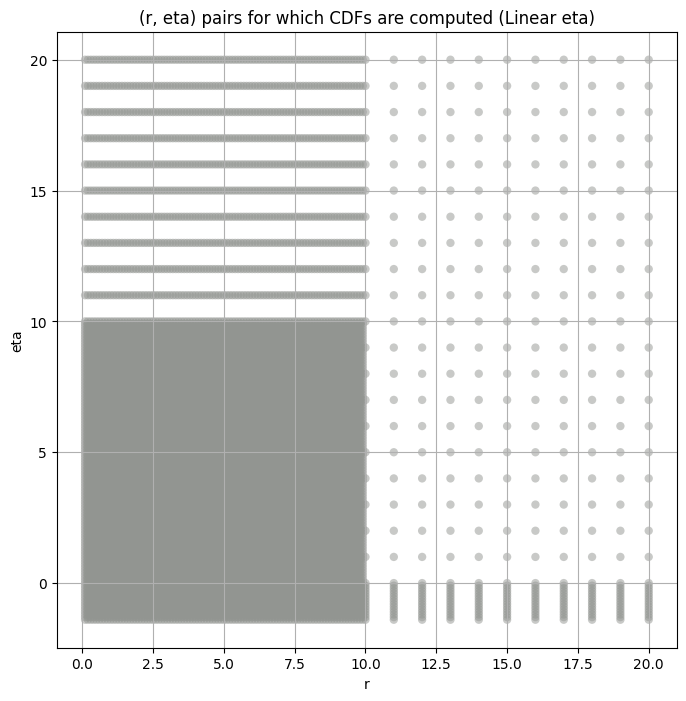

,"(r,eta),cdf",r,eta,cdf,variance,kurtosis
0,"((0.1, -1.4), <scipy.interpolate._fitpack2.Int...",0.1,-1.4,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.628800e+06,554265.000000
1,"((0.1, -1.3), <scipy.interpolate._fitpack2.Int...",0.1,-1.3,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.991680e+07,96192.272727
2,"((0.1, -1.2), <scipy.interpolate._fitpack2.Int...",0.1,-1.2,<scipy.interpolate._fitpack2.InterpolatedUniva...,2.395008e+08,29390.000000
3,"((0.1, -1.1), <scipy.interpolate._fitpack2.Int...",0.1,-1.1,<scipy.interpolate._fitpack2.InterpolatedUniva...,1.037837e+09,11997.692308
4,"((0.1, -1.0), <scipy.interpolate._fitpack2.Int...",0.1,-1.0,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.632429e+09,5874.890110


In [12]:
warnings.filterwarnings('ignore', category=RuntimeWarning)

all_cdfs_df = create_kurt_var_ksstat_df(all_cdfs)
fine_cdfs_df = all_cdfs_df.copy()
all_cdfs_df = all_cdfs_df[(np.round(all_cdfs_df['r'], 1) == all_cdfs_df['r']) & (np.round(all_cdfs_df['eta'], 1) == all_cdfs_df['eta'])]
all_cdfs_df = all_cdfs_df.reset_index(drop=True)
all_cdfs = {x[0] : x[1] for x in all_cdfs_df["(r,eta),cdf"]}
                                             
var_values_dict = dict()
kurt_values_dict = dict()
master_df = pd.DataFrame(columns=[GROUP]).set_index(GROUP)
temp_cdf = all_cdfs_df
print(f"Running {all_cdfs_df.shape[0]} CDFs")
create_scatter_plot(all_cdfs_df);
all_cdfs_df.head()

## Bootstrapping the Variance and Kurtosis

In [13]:
n_bootstrap = int(1e3) # TODO For quick testing purposes
bootstrap_size = int(1e3) # TODO For quick testing purposes
ci = 0.99

In [14]:
bootstrap_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))
master_df_var_kurt_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

if True or not master_df_var_kurt_path.exists(): # TODO For quick testing purposes
    for group in GROUPS:
        print(f'{GROUP.capitalize()} {group}: {str(filter_group_map[group])}')
        obs_var, var_lower, var_upper, var_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                n_bootstrap=n_bootstrap, 
                                                                                bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                metric= np.var, 
                                                                                ci=ci)
        obs_kurt, kurt_lower, kurt_upper, kurt_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                    n_bootstrap=n_bootstrap, 
                                                                                    bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                    metric= stats.kurtosis, ci=ci)  
        master_df.loc[group, 'obs_var'], master_df.loc[group, 'var_lower'], master_df.loc[group, 'var_upper'] = obs_var, var_lower, var_upper
        master_df.loc[group, 'obs_kurt'], master_df.loc[group, 'kurt_lower'], master_df.loc[group, 'kurt_upper'] = obs_kurt, kurt_lower, kurt_upper
        master_df.loc[group, 'total_samples'] = group_total_samples[group]
        master_df.loc[group, 'filter_group'] = str(filter_group_map[group])

    master_df.to_csv(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

master_df = pd.read_csv(master_df_var_kurt_path, index_col=GROUP)
var_kurt_df = pd.read_csv(bootstrap_path, index_col=GROUP)
master_df

Filter_idx 0: (2.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 1: (2.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 2: (2.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 3: (2.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 4: (2.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 5: (2.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 6: (2.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 7: (2.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 8: (2.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 9: (2.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 10: (2.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 11: (2.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 12: (2.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 13: (2.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 14: (3.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 15: (3.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 16: (3.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 17: (3.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 18: (3.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 19: (3.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 20: (3.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 21: (3.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 22: (3.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 23: (3.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 24: (3.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 25: (3.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 26: (3.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 27: (3.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 28: (4.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 29: (4.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 30: (4.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 31: (4.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 32: (4.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 33: (4.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 34: (4.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 35: (4.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 36: (4.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 37: (4.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 38: (4.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 39: (4.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 40: (4.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 41: (4.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group
filter_idx,,,,,,,,
0,96.525920,70.528580,161.917770,19.178097,3.513101,155.585340,160000000.0,"(2.0, 0.5, 0.044)"
1,39.640656,29.082182,68.552986,24.873302,4.030701,218.632260,160000000.0,"(2.0, 0.5, 0.065)"
2,17.815247,12.593767,35.419140,39.990158,4.784158,295.938780,160000000.0,"(2.0, 0.5, 0.096)"
3,7.128089,4.933293,16.395422,52.462814,5.251441,315.332460,160000000.0,"(2.0, 0.5, 0.141)"
4,2.827215,1.798519,8.435795,99.624886,7.044568,497.418400,160000000.0,"(2.0, 0.5, 0.208)"
5,0.849095,0.525596,3.329293,202.204280,5.845236,593.344670,160000000.0,"(2.0, 0.5, 0.306)"
6,0.509841,0.329509,1.785459,138.650010,5.808846,532.173160,160000000.0,"(2.0, 0.5, 0.45)"
7,122.047100,91.589440,198.601530,18.166317,3.700830,162.124650,160000000.0,"(2.0, 1.0, 0.044)"
8,50.507060,36.873737,92.119070,23.864079,3.781666,200.233380,160000000.0,"(2.0, 1.0, 0.065)"


## Initial Grid Search and Hypothesis Test Plots

In [15]:
EXCLUDE_CUTOFFS = [0, 50, 100, 200] # TODO For quick testing purposes
SCALE_CAP = 1e5

In [16]:
augmented_var_df_path = Path(os.path.join(CWD, "CSVs", "augmented_var_df.csv"))
augmented_var_df = var_kurt_df[['obs_var']].copy()
augmented_var_df
for val in EXCLUDE_CUTOFFS:
    temp_arr = []
    for group in GROUPS:
        if val != 0:
            temp_arr.append(np.var(group_data_map[group][val:-val]))
        else:
            temp_arr.append(np.var(group_data_map[group]))

    augmented_var_df[f"var_exclude_{val}"] = temp_arr
augmented_var_df

,obs_var,var_exclude_0,var_exclude_50,var_exclude_100,var_exclude_200
filter_idx,,,,,
0,96.525920,96.525917,88.101799,84.581245,79.686333
1,39.640656,39.640656,36.007687,34.480446,32.325939
2,17.815247,17.815247,15.815575,15.032948,13.963770
3,7.128089,7.128089,6.280857,5.960586,5.522858
4,2.827215,2.827215,2.399102,2.253248,2.060689
5,0.849095,0.849095,0.703915,0.661205,0.605148
6,0.509841,0.509841,0.428220,0.403394,0.370908
7,122.047100,122.047096,111.885986,107.569450,101.478737
8,50.507060,50.507061,45.871265,43.968632,41.325718


####
Filter_idx, 0: (2.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 0 0.010890107526111303 96.52592


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 50 0.011821074146376065 88.1018


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 100 0.013795772463836176 84.581245


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 200 0.01675511196907964 79.68633
Number of samples: 100000, Without approximation : 160000000.0


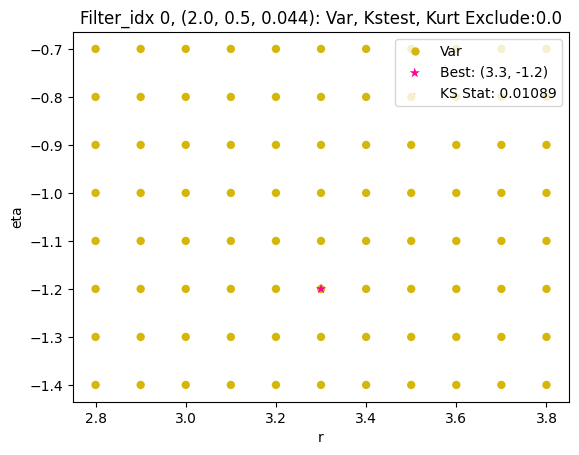

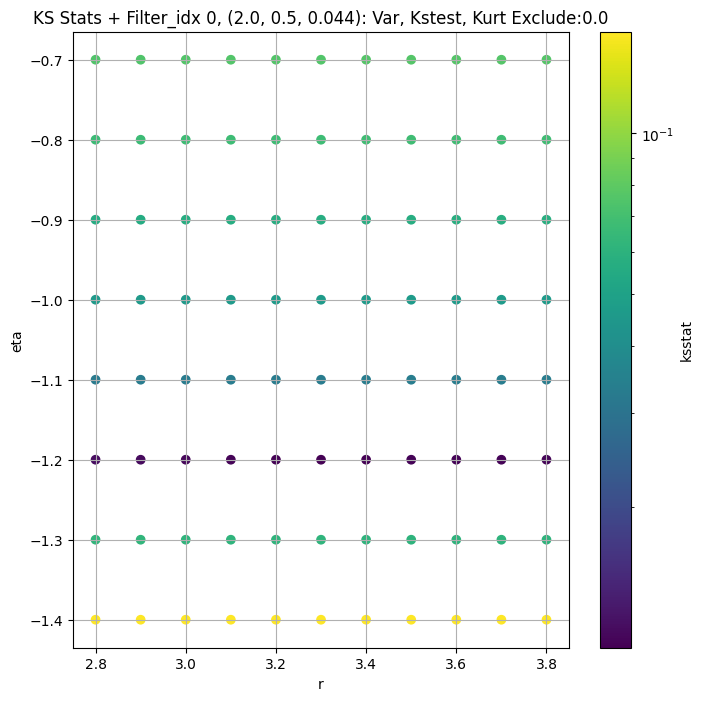

####
Filter_idx, 1: (2.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 0 0.009229243732580938 39.640656


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 50 0.009132229465169006 36.007687


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 100 0.009148786703455092 34.480446


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 200 0.009232399397850033 32.32594
Number of samples: 100000, Without approximation : 160000000.0


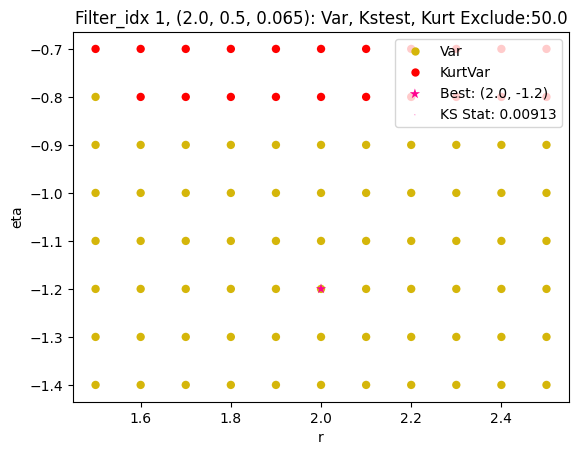

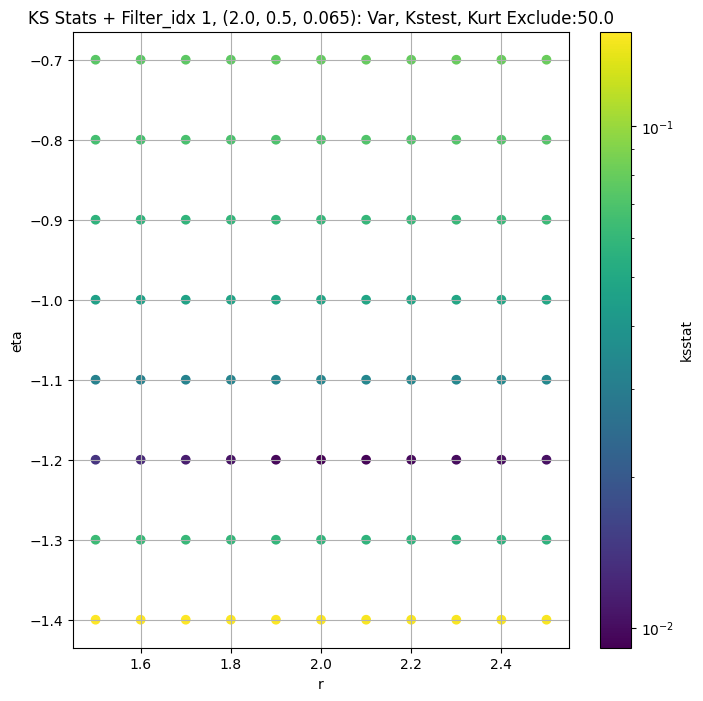

####
Filter_idx, 2: (2.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 0 0.009827035139602314 17.815247


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 50 0.00935857325863415 15.815575


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 100 0.00901151121597843 15.0329485


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 200 0.008869508885313238 13.96377
Number of samples: 100000, Without approximation : 160000000.0


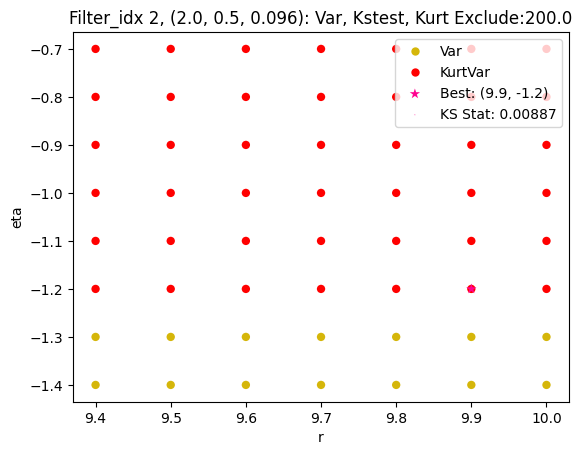

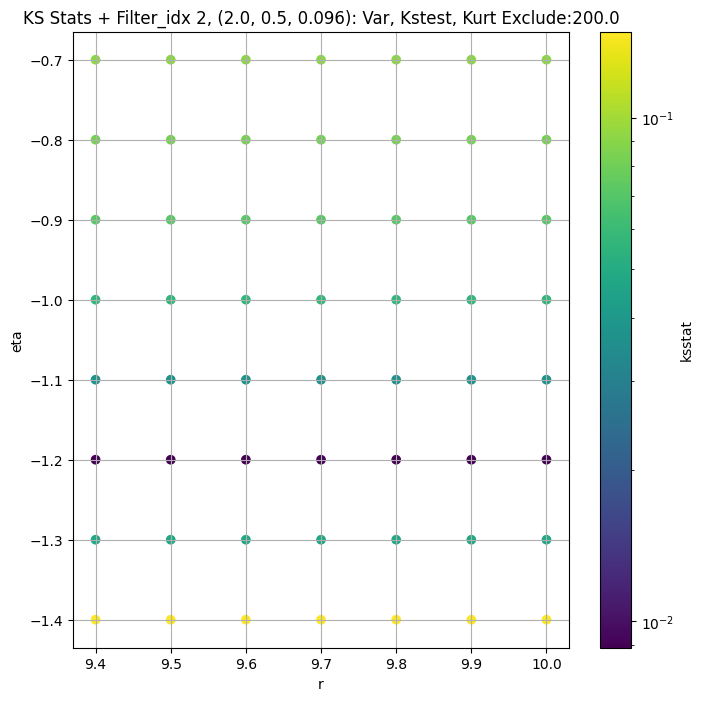

####
Filter_idx, 3: (2.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 0 0.007169213465152535 7.1280894


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 50 0.009568063676183514 6.280857


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 100 0.008480719157614947 5.960586


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 200 0.009678095872966475 5.522858
Number of samples: 100000, Without approximation : 160000000.0


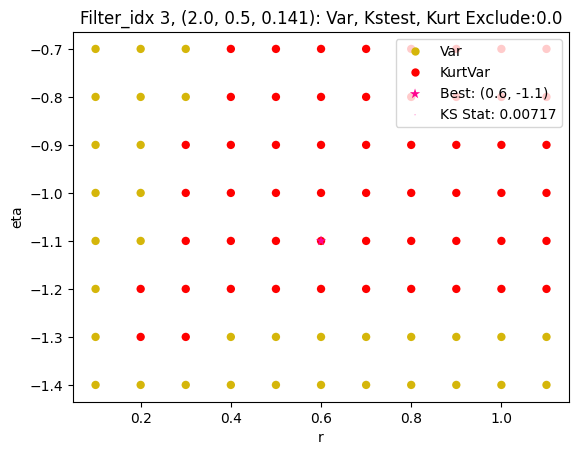

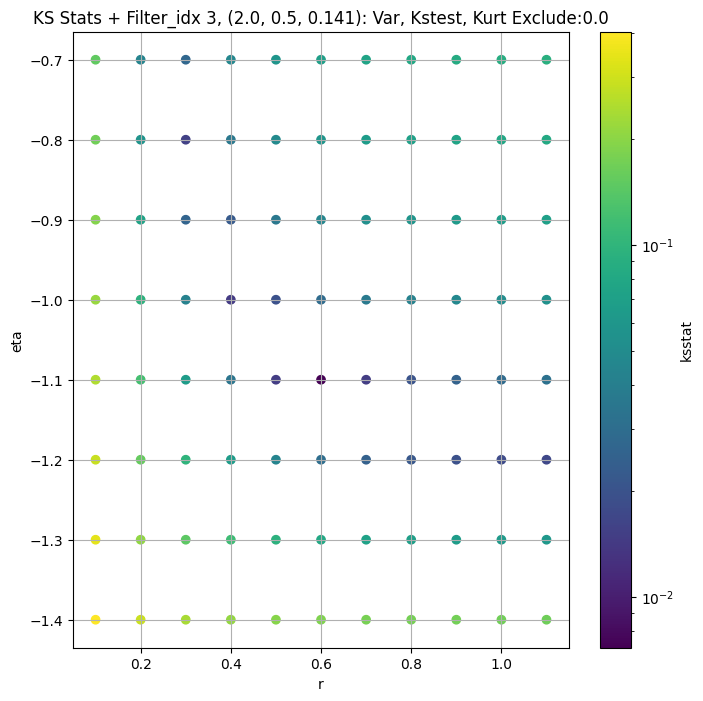

####
Filter_idx, 4: (2.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 0 0.010243886266298408 2.827215


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 50 0.011486603323502945 2.3991017


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 100 0.009630795692692429 2.2532485


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 200 0.00866902963521754 2.0606887
Number of samples: 100000, Without approximation : 160000000.0


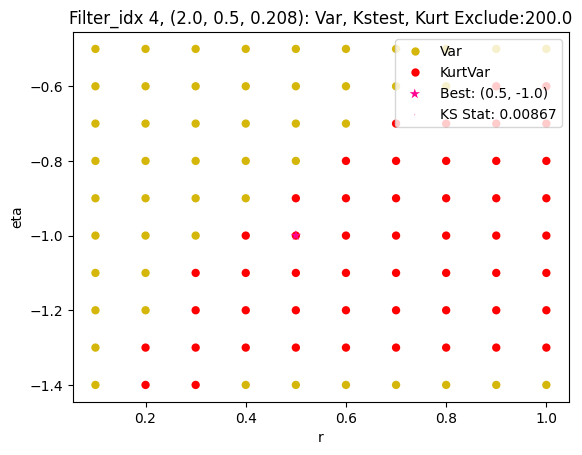

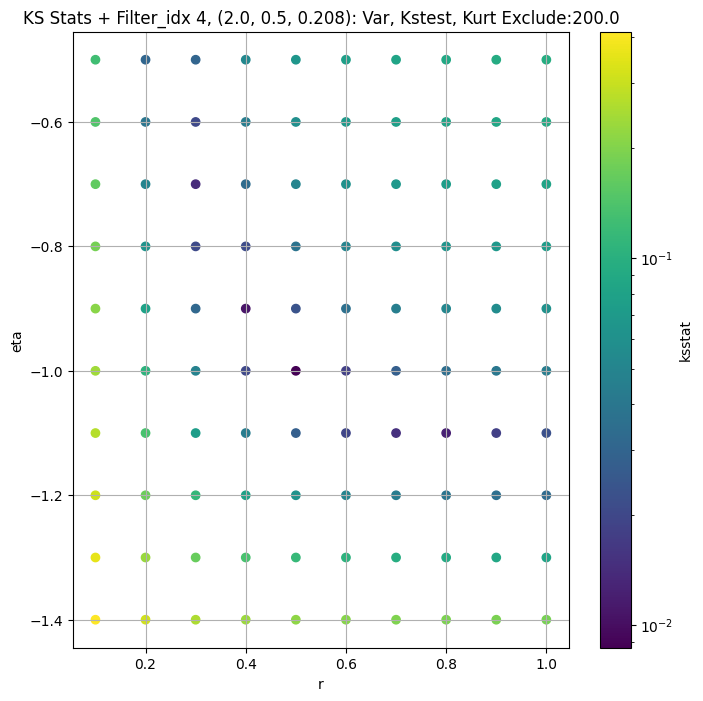

####
Filter_idx, 5: (2.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 0 0.004564029011188325 0.84909546


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 50 0.005739187313410499 0.7039152


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 100 0.007519982981752826 0.6612053


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 200 0.0074044418848865645 0.60514784
Number of samples: 100000, Without approximation : 160000000.0


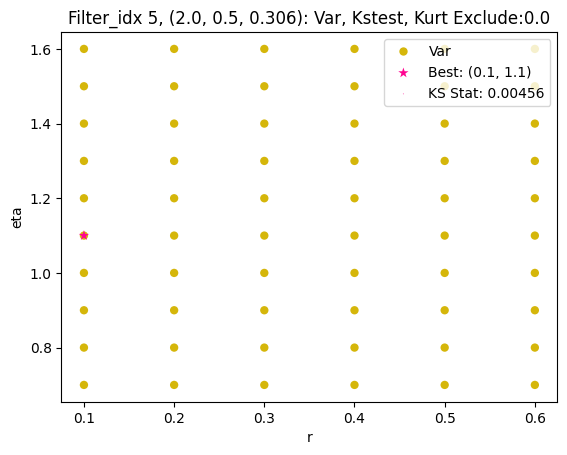

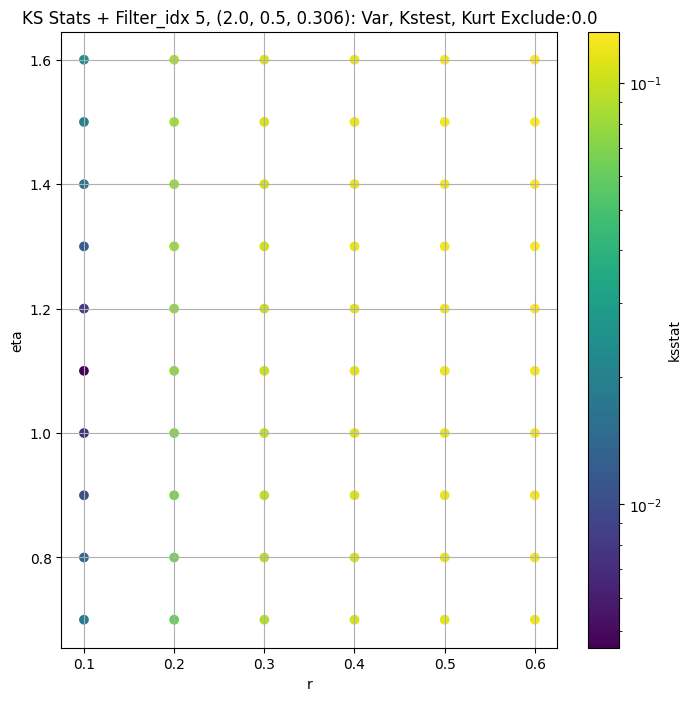

####
Filter_idx, 6: (2.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 0 0.0027694662858646635 0.5098412


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 50 0.003808298588707751 0.42822006


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 100 0.004061704543727174 0.4033938


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 200 0.005869188239831458 0.37090835
Number of samples: 100000, Without approximation : 160000000.0


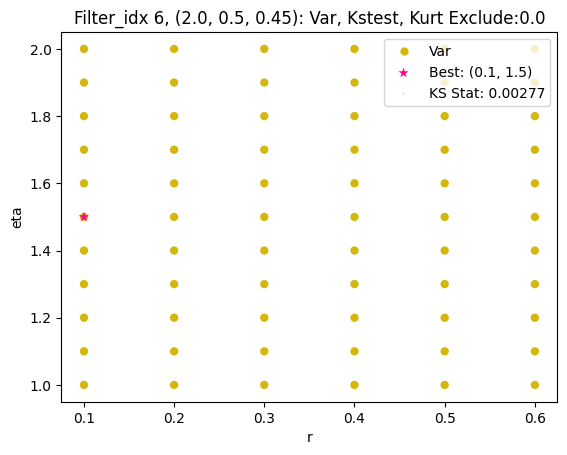

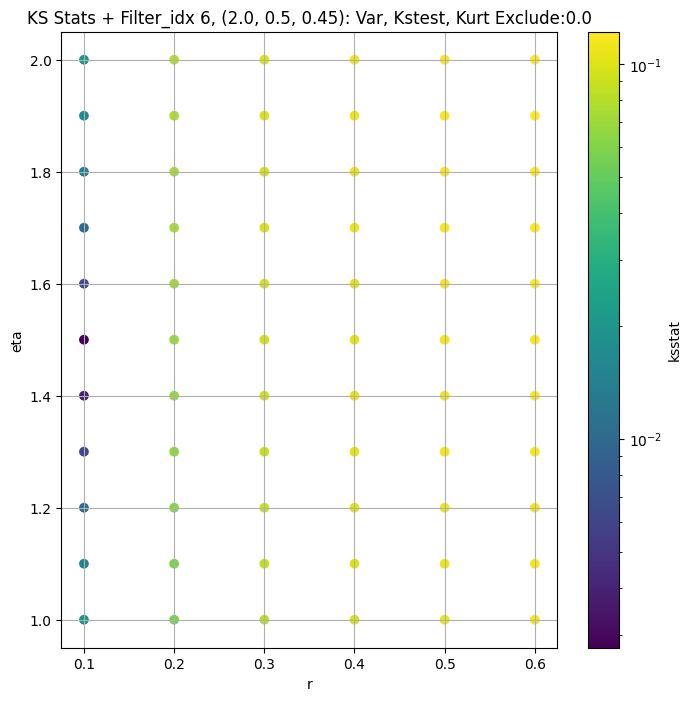

####
Filter_idx, 7: (2.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 0 0.013232202562039386 122.0471


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 50 0.016807662475849083 111.88599


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 100 0.016240360619041327 107.56945


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 200 0.016555577389903264 101.47874
Number of samples: 100000, Without approximation : 160000000.0


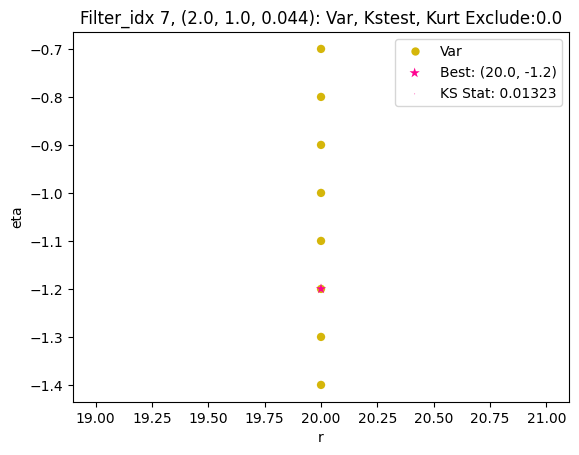

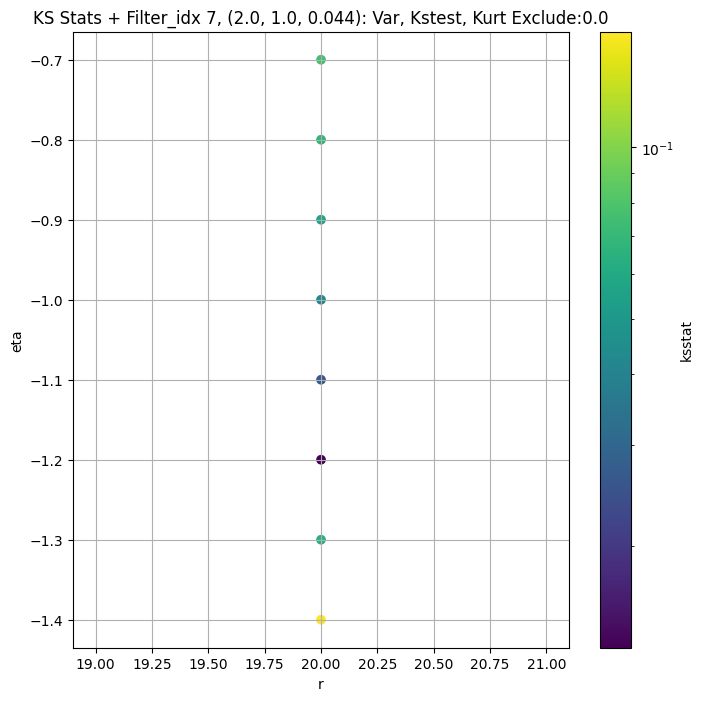

####
Filter_idx, 8: (2.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 0 0.009630216500840949 50.50706


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 50 0.008395879391196265 45.871265


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 100 0.009936721118212533 43.96863


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 200 0.012718778097200567 41.325718
Number of samples: 100000, Without approximation : 160000000.0


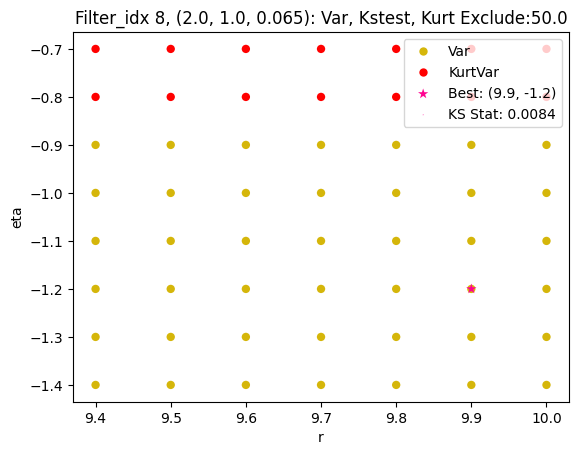

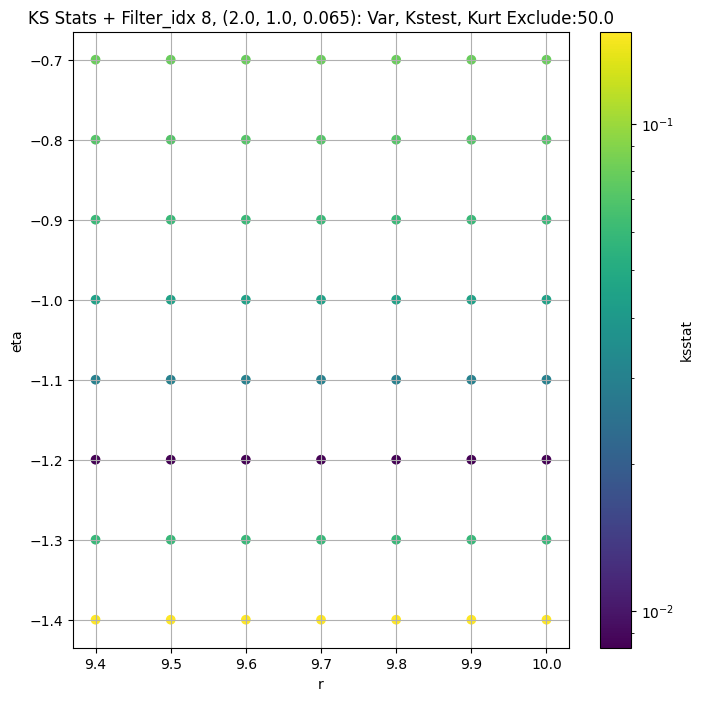

####
Filter_idx, 9: (2.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 0 0.009214035112523389 23.151463


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 50 0.008312832378264523 20.44924


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 100 0.00799986756787574 19.448757


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 200 0.007866777424395122 18.08714
Number of samples: 100000, Without approximation : 160000000.0


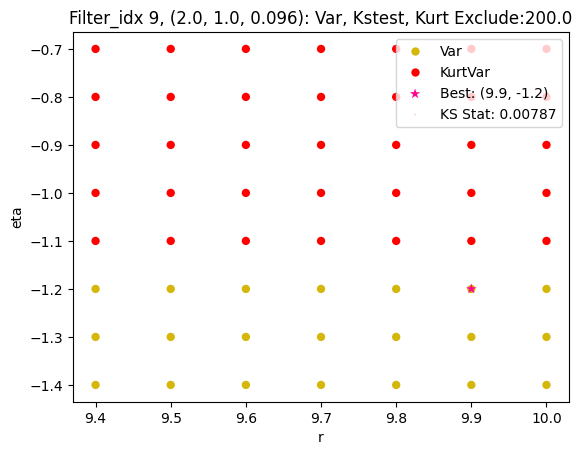

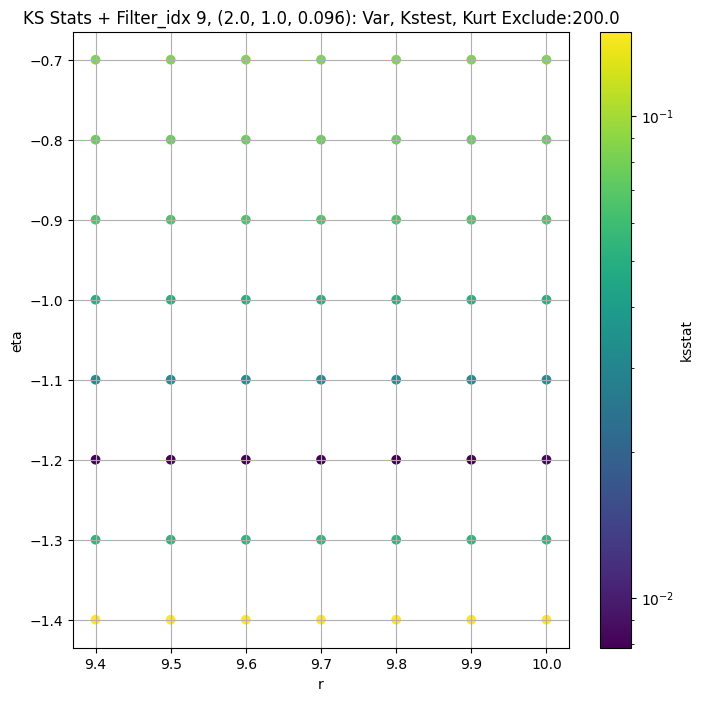

####
Filter_idx, 10: (2.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 0 0.010245869211175263 9.308575


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 50 0.007876465713838321 8.1438675


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 100 0.011187332282550977 7.7204704


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 200 0.008998611627681008 7.1388364
Number of samples: 100000, Without approximation : 160000000.0


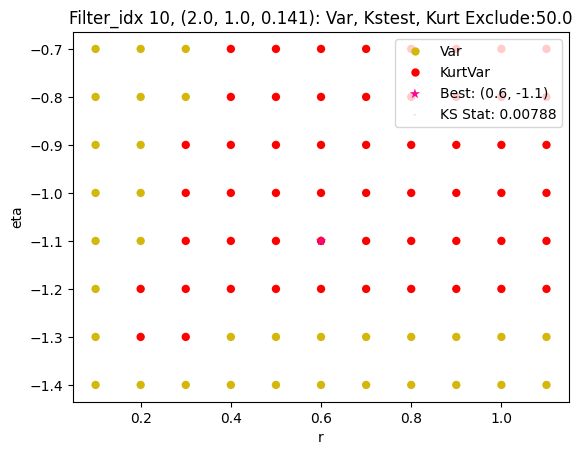

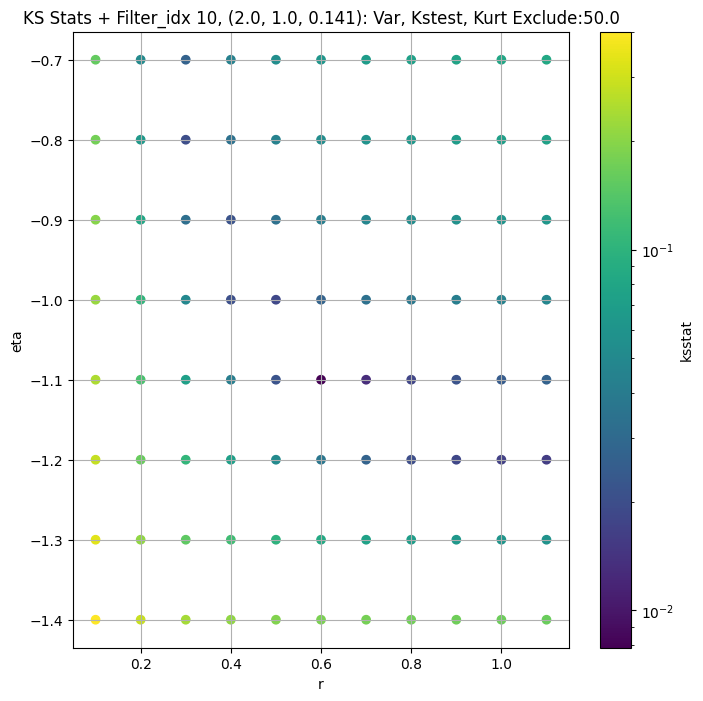

####
Filter_idx, 11: (2.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 0 0.006810898328296733 3.8609498


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 50 0.007798872171176918 3.3231487


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 100 0.005762372295863405 3.132614


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 200 0.010244216055575572 2.8785796
Number of samples: 100000, Without approximation : 160000000.0


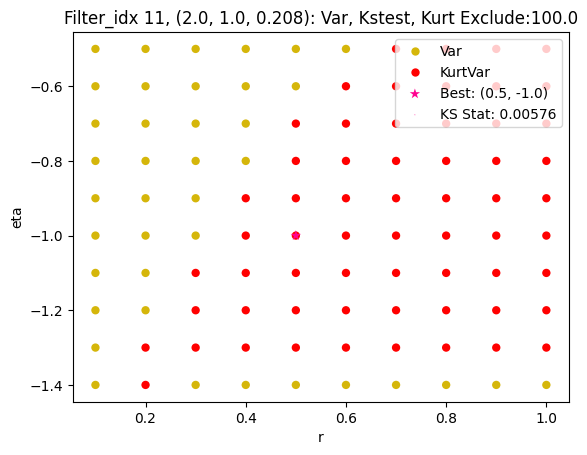

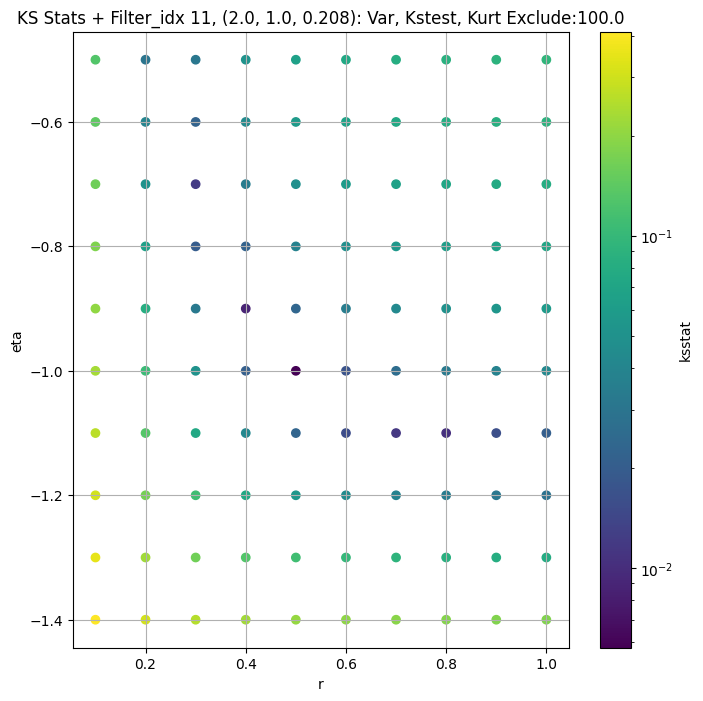

####
Filter_idx, 12: (2.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 0 0.007141114398068638 1.3179938


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 50 0.007666669447929431 1.1261686


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 100 0.009184101594563177 1.0566484


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 200 0.006283835534367455 0.96458066
Number of samples: 100000, Without approximation : 160000000.0


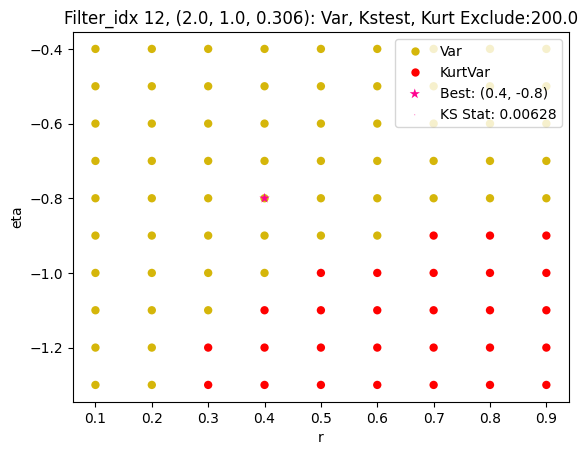

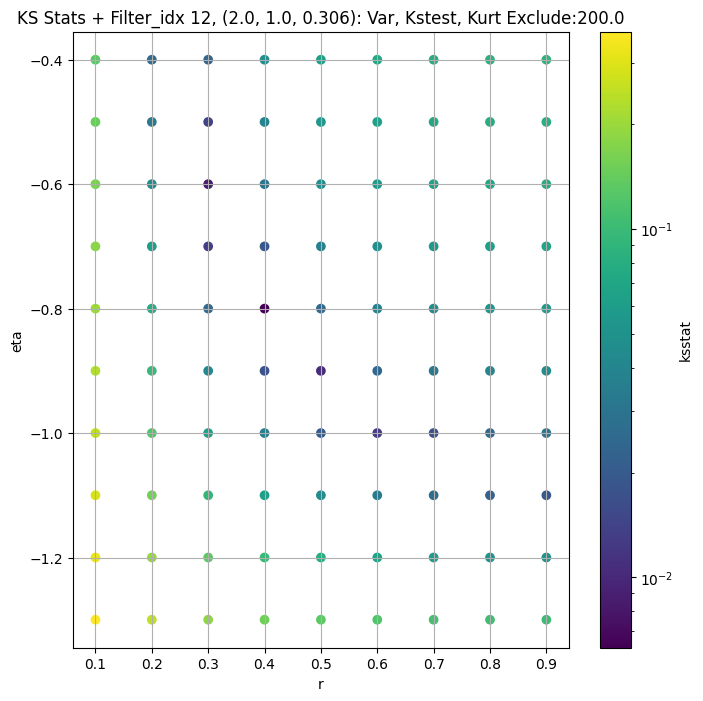

####
Filter_idx, 13: (2.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 0 0.0034230537801180905 0.47919533


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 50 0.0034713702484233666 0.40184674


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 100 0.004815643791225788 0.37814993


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 200 0.00593080227137921 0.3469489
Number of samples: 100000, Without approximation : 160000000.0


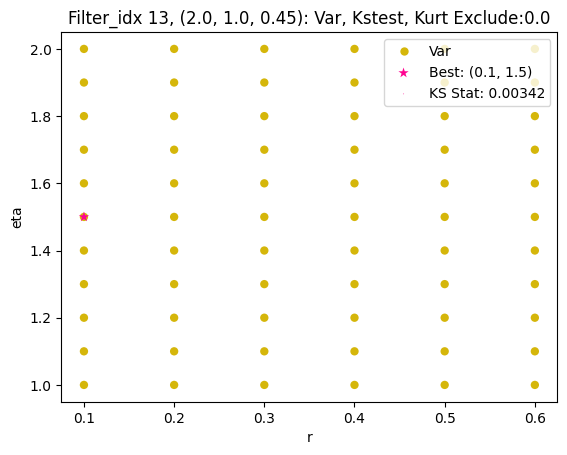

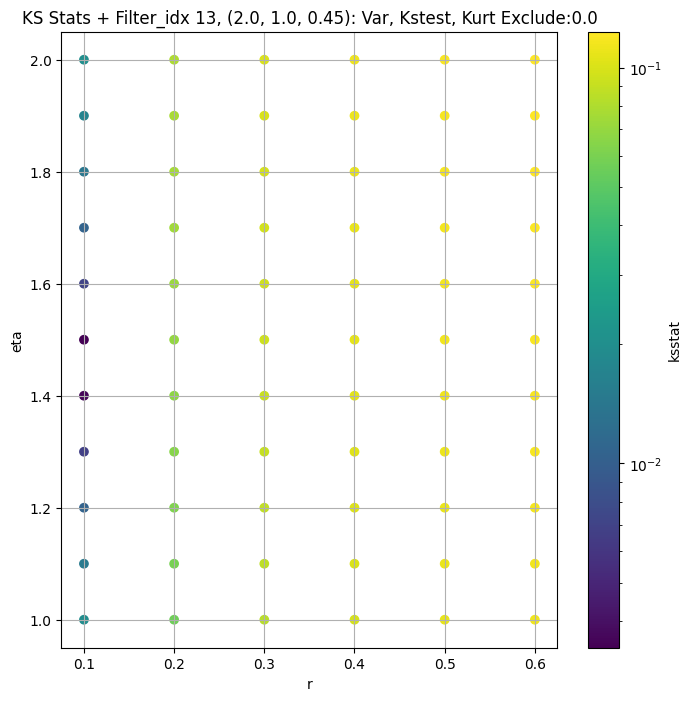

####
Filter_idx, 14: (3.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 0 0.009163683036523929 90.89836


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 50 0.00790928937515023 83.64136


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 100 0.007415191680576472 80.17852


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 200 0.009183106767772564 75.24994
Number of samples: 100000, Without approximation : 160000000.0


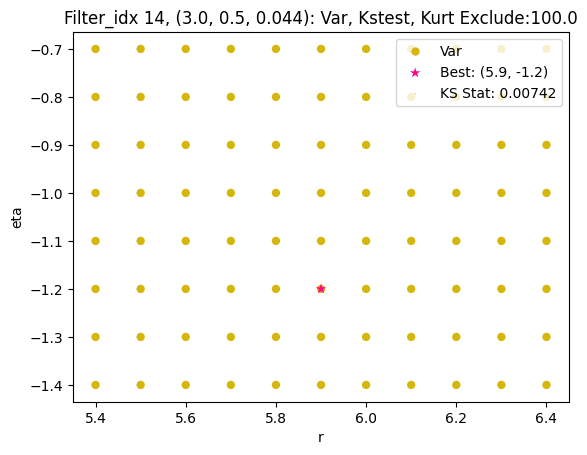

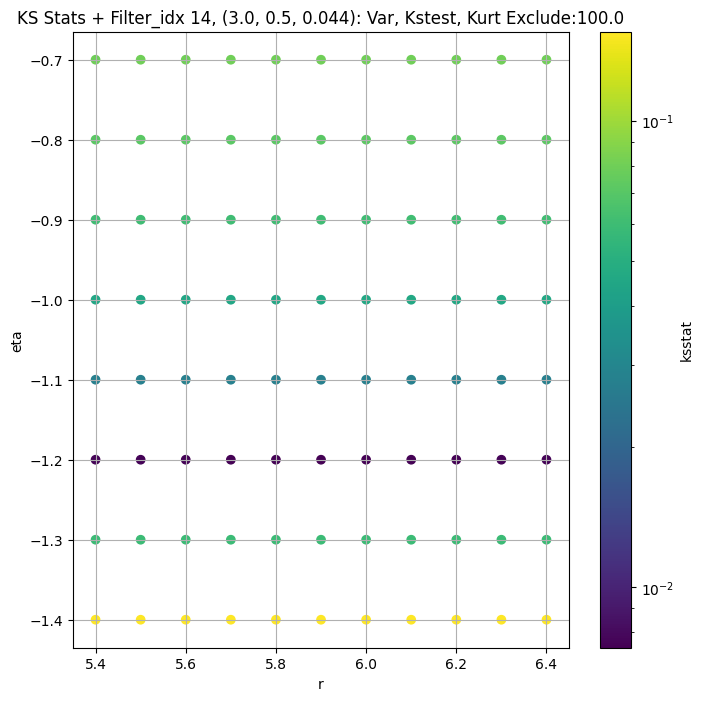

####
Filter_idx, 15: (3.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 0 0.01049710844330437 35.85106


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 50 0.010388418255055876 32.835175


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 100 0.010848327356654641 31.441814


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 200 0.01060488912946711 29.443243
Number of samples: 100000, Without approximation : 160000000.0


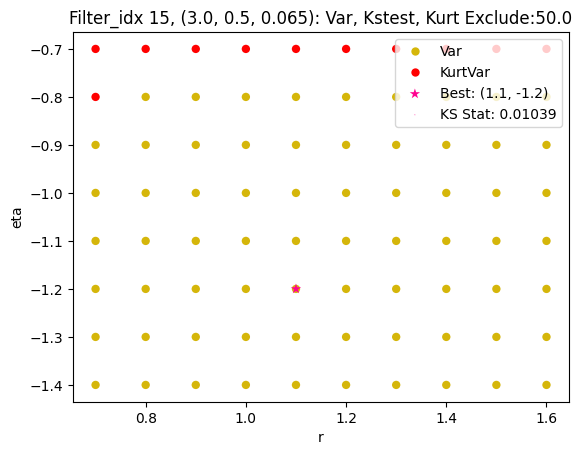

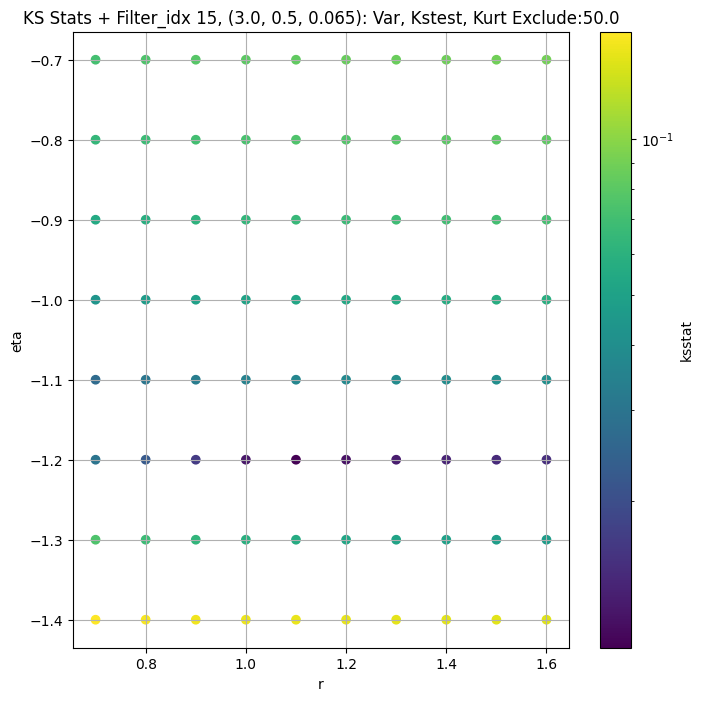

####
Filter_idx, 16: (3.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 0 0.010152278286341576 17.204351


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 50 0.010135377966436376 15.3988285


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 100 0.009777589476742676 14.628785


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 200 0.009958734563178973 13.551835
Number of samples: 100000, Without approximation : 160000000.0


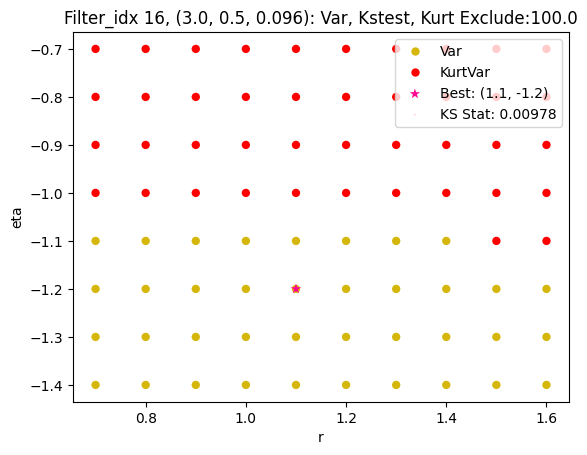

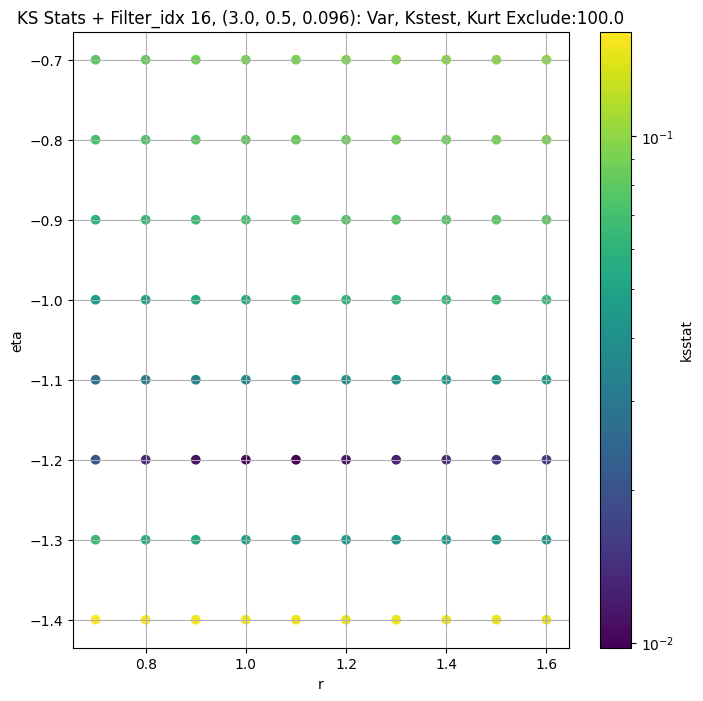

####
Filter_idx, 17: (3.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 0 0.008383139455356736 6.772909


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 50 0.009905655856217499 5.9146247


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 100 0.01160773185414865 5.5868926


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 200 0.008459289962387914 5.138746
Number of samples: 100000, Without approximation : 160000000.0


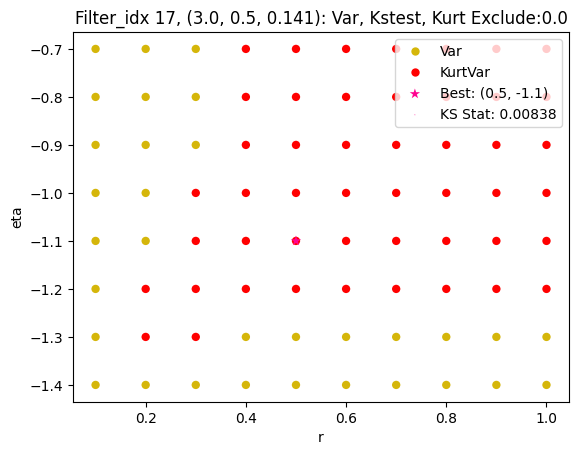

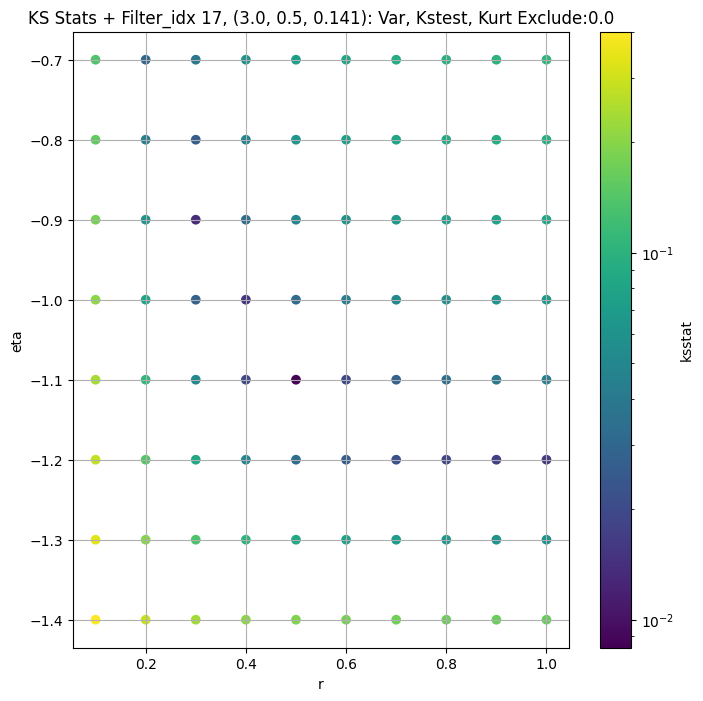

####
Filter_idx, 18: (3.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 0 0.010053456345994083 2.6080043


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 50 0.008848942459669162 2.2114675


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 100 0.011189246401078767 2.073529


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 200 0.012085896641477856 1.8907872
Number of samples: 100000, Without approximation : 160000000.0


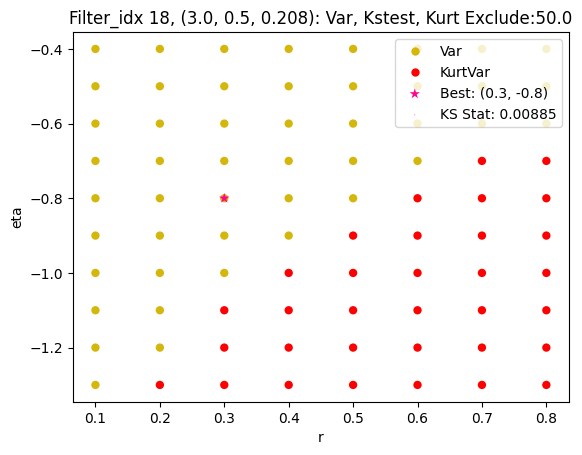

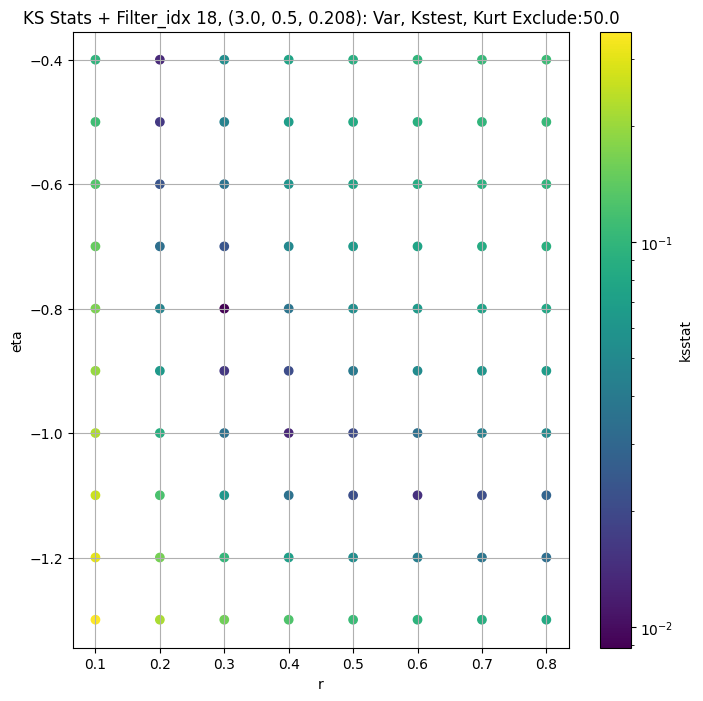

####
Filter_idx, 19: (3.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 0 0.004018946558002889 0.75800353


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 50 0.0067562612036629055 0.6196868


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 100 0.005259370736060087 0.57967573


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 200 0.007938414141297367 0.5274004
Number of samples: 100000, Without approximation : 160000000.0


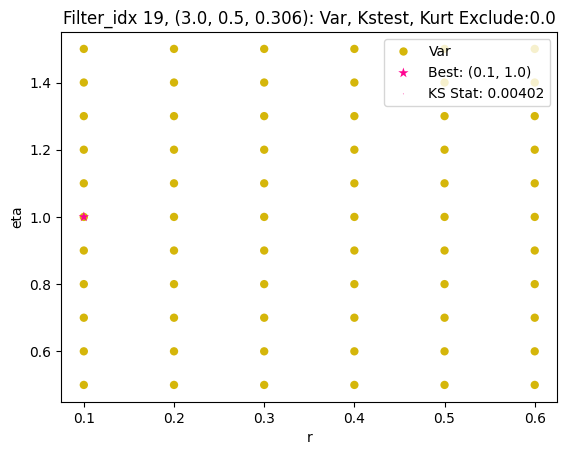

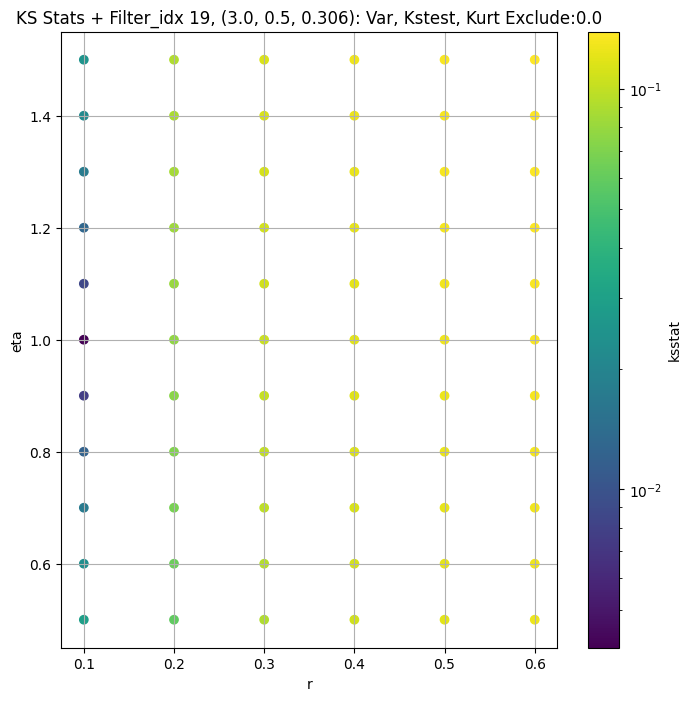

####
Filter_idx, 20: (3.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 0 0.006780838397276279 0.33051336


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 50 0.0022400739904543387 0.24568498


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 100 0.0037799984610374926 0.22946972


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 200 0.004163254430761487 0.20928091
Number of samples: 100000, Without approximation : 160000000.0


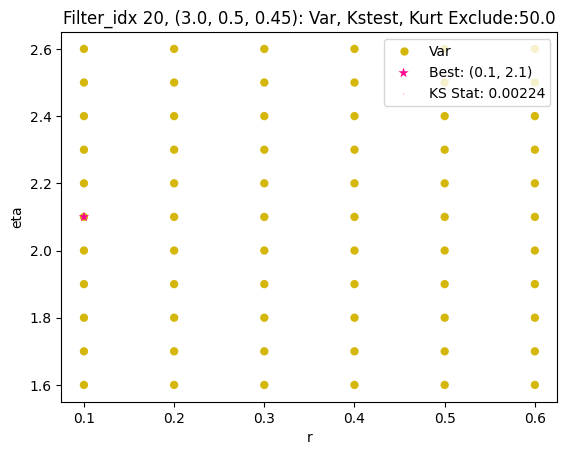

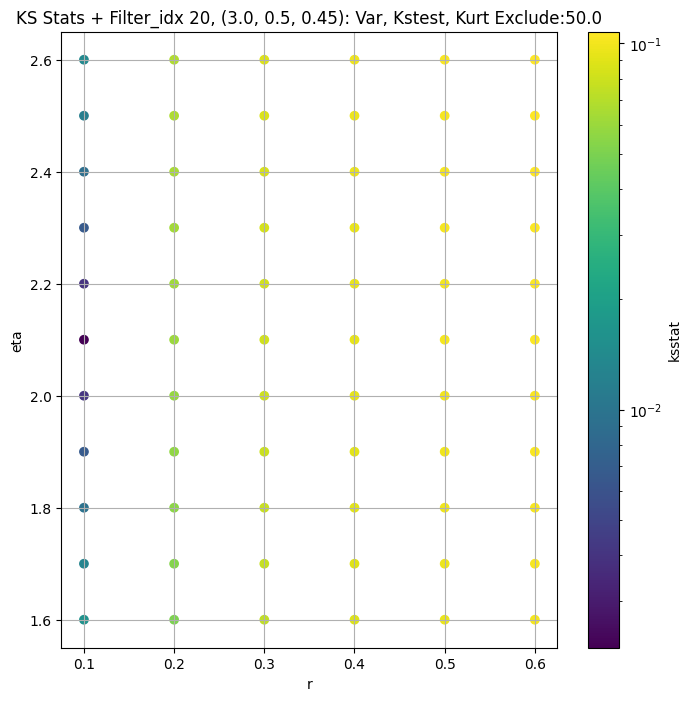

####
Filter_idx, 21: (3.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 0 0.008639202070457874 110.84923


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 50 0.007240070609730753 99.95447


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 100 0.006629439000039664 95.59925


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 200 0.006967271279867071 89.51931
Number of samples: 100000, Without approximation : 160000000.0


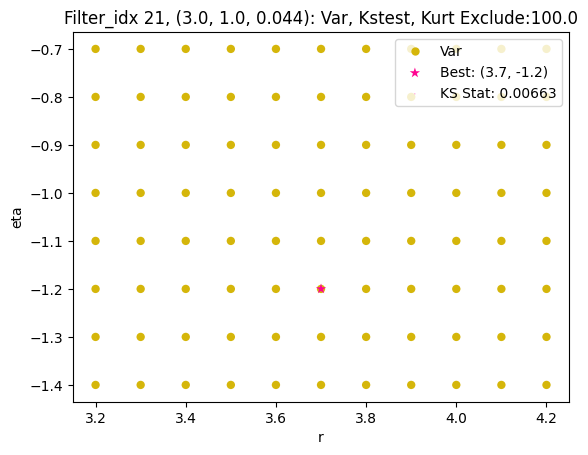

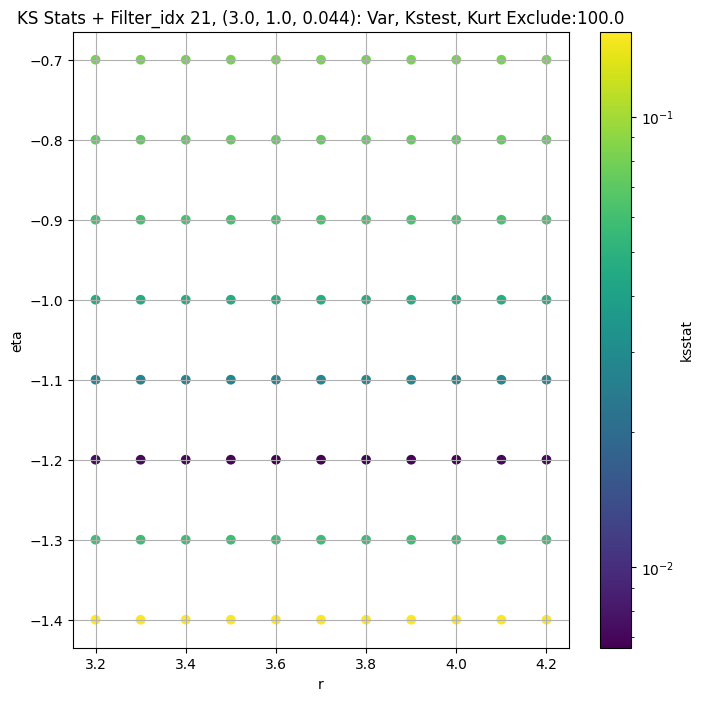

####
Filter_idx, 22: (3.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 0 0.007580826548206465 43.04992


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 50 0.007133822293092895 39.828938


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 100 0.007028083489569681 38.223896


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 200 0.00694770685802093 35.89865
Number of samples: 100000, Without approximation : 160000000.0


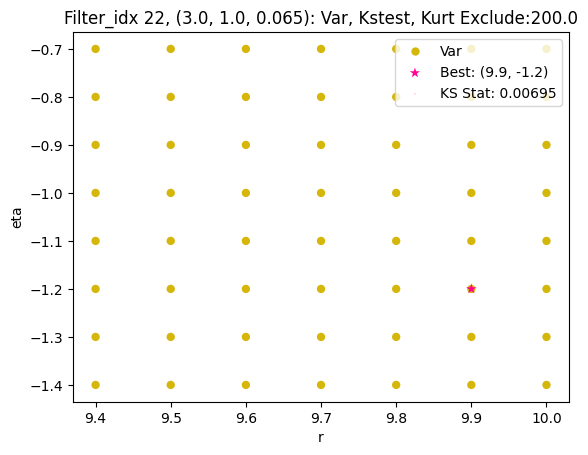

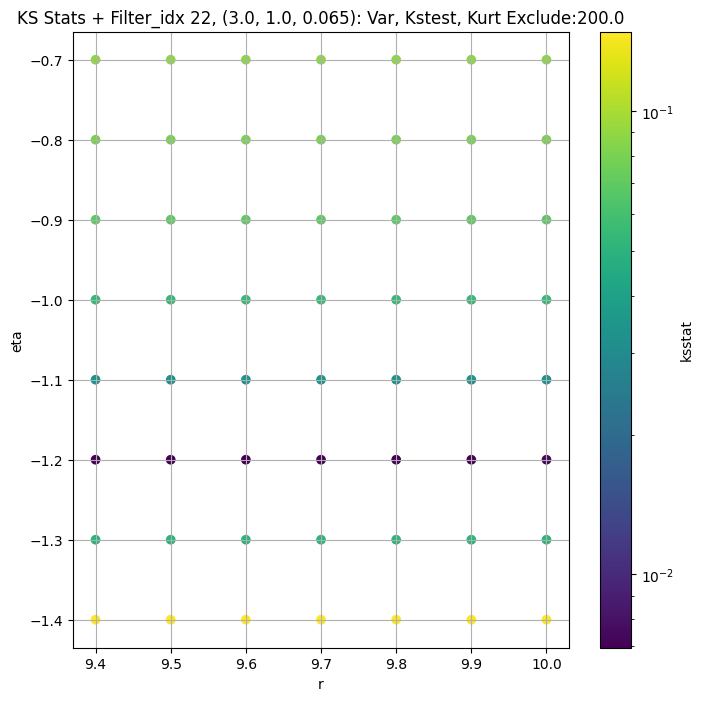

####
Filter_idx, 23: (3.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 0 0.009666906248326224 20.301582


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 50 0.009419735780908156 18.428185


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 100 0.00924071541318039 17.553553


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 200 0.008928852120894504 16.315397
Number of samples: 100000, Without approximation : 160000000.0


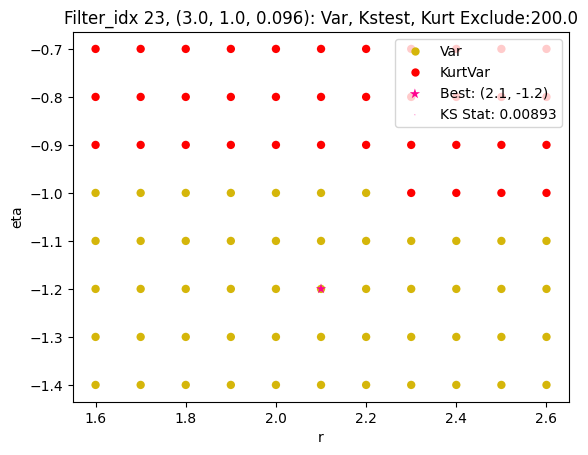

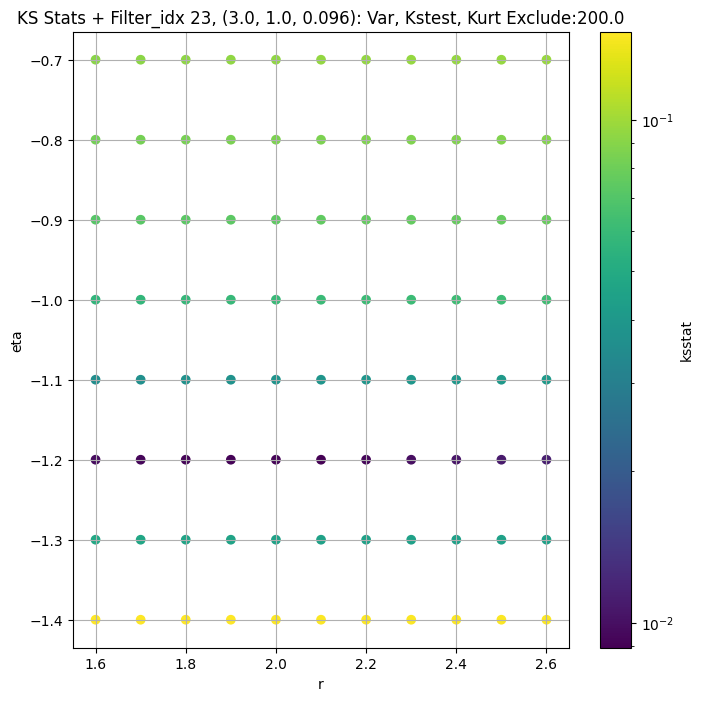

####
Filter_idx, 24: (3.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 0 0.011311687853230001 8.39048


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 50 0.008105973823414492 7.3050447


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 100 0.010126635044683363 6.889969


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 200 0.012192102472041333 6.3234982
Number of samples: 100000, Without approximation : 160000000.0


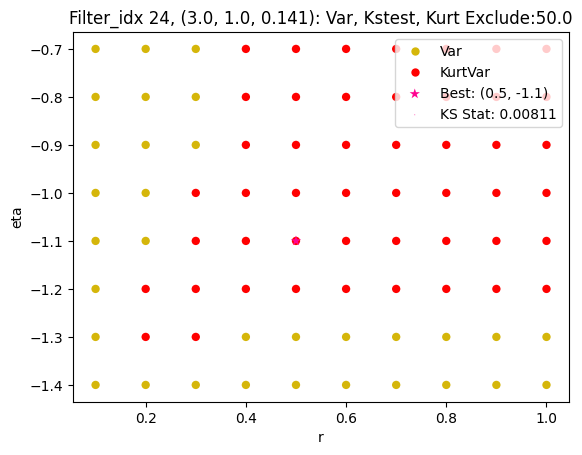

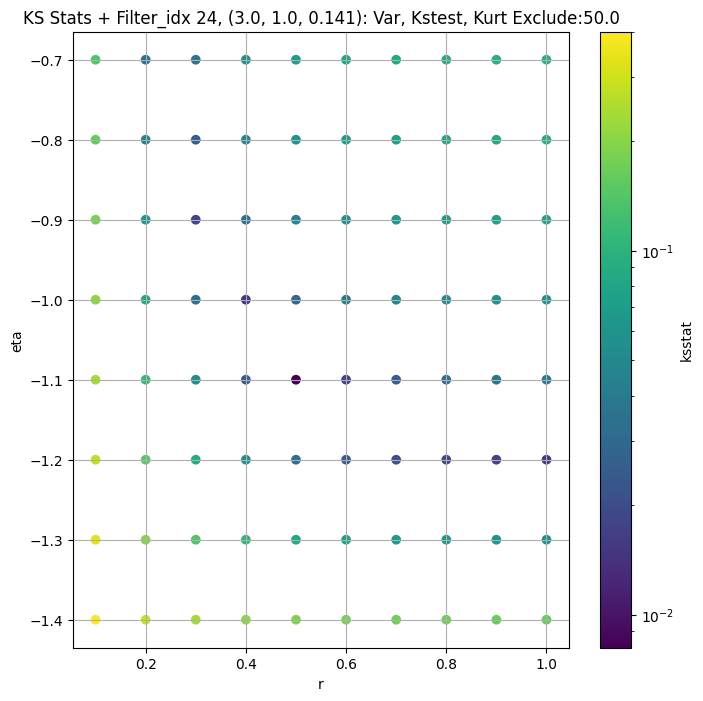

####
Filter_idx, 25: (3.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 0 0.008032805105446683 3.0158486


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 50 0.010058230196355877 2.5564888


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 100 0.011175580122423034 2.3995745


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 200 0.012953344111162834 2.188946
Number of samples: 100000, Without approximation : 160000000.0


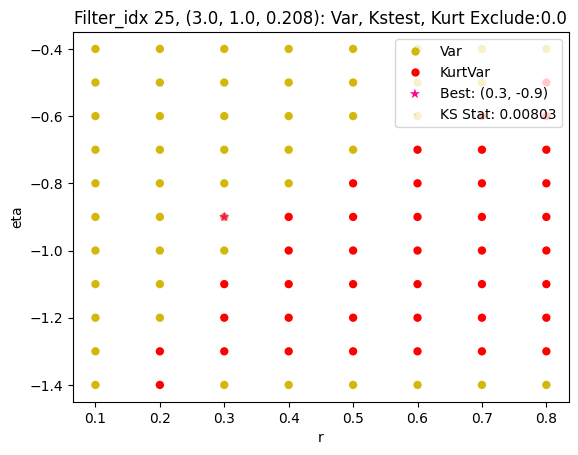

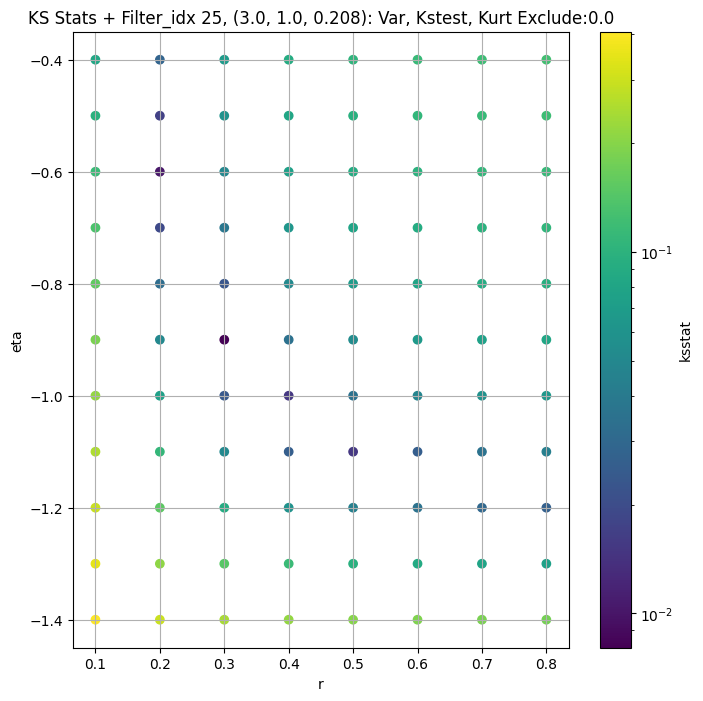

####
Filter_idx, 26: (3.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 0 0.004831083900064814 1.0902603


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 50 0.006100394521083519 0.9143978


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 100 0.006828551899252355 0.8509559


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 200 0.006915282610132301 0.76860005
Number of samples: 100000, Without approximation : 160000000.0


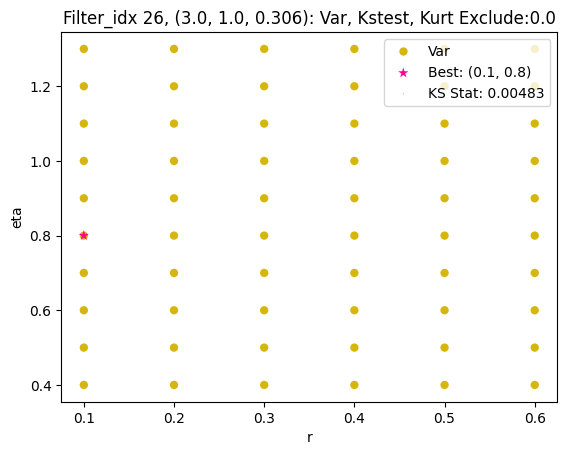

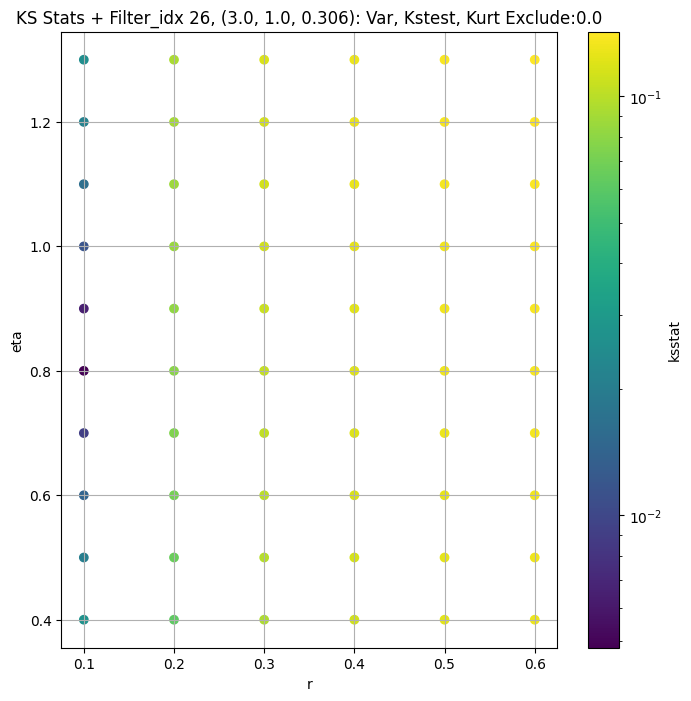

####
Filter_idx, 27: (3.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 0 0.007446356452437436 0.35595542


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 50 0.0024958412258425655 0.25617138


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 100 0.0036563084877110352 0.2393588


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 200 0.004199005448949911 0.21839833
Number of samples: 100000, Without approximation : 160000000.0


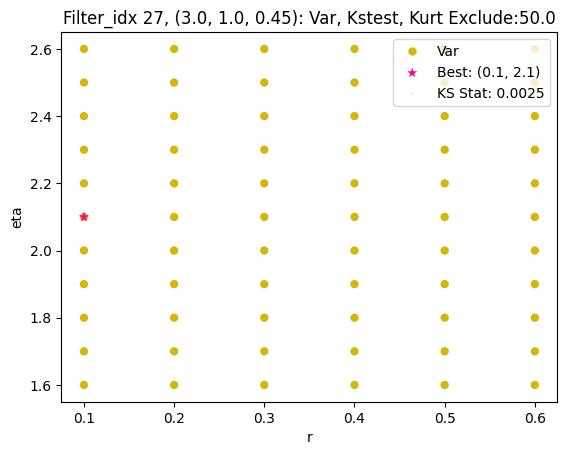

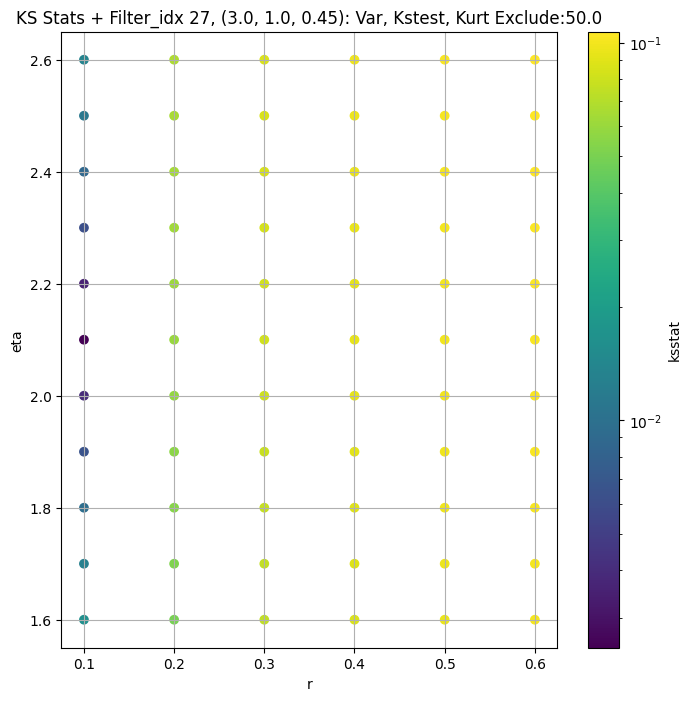

####
Filter_idx, 28: (4.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 0 0.01035188093283651 88.3371


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 50 0.012310323527727707 82.17091


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 100 0.013905876748867452 79.15649


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 200 0.014072902862656278 74.760124
Number of samples: 100000, Without approximation : 160000000.0


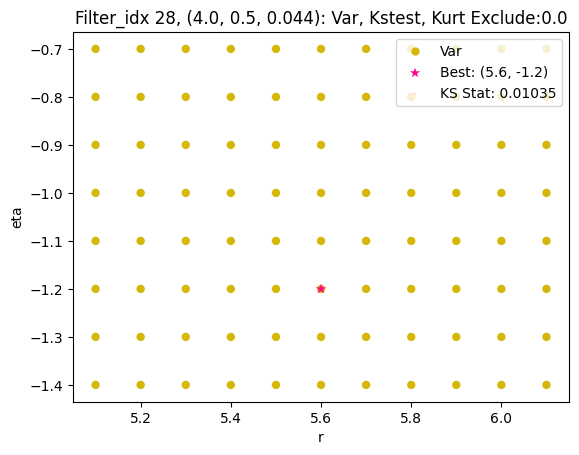

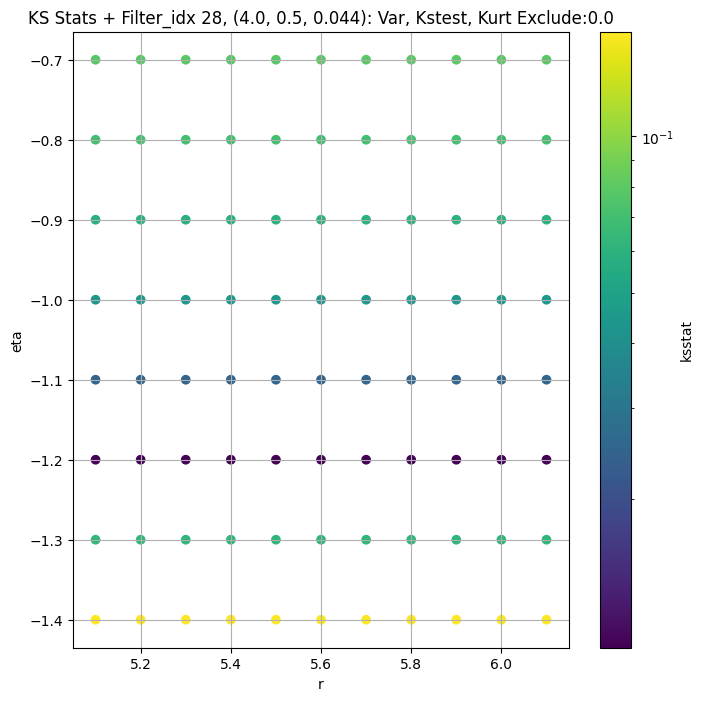

####
Filter_idx, 29: (4.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 0 0.008486514326159211 37.178387


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 50 0.007700837967674179 33.730972


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 100 0.0075506016742433735 32.26687


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 200 0.007740533717504494 30.212444
Number of samples: 100000, Without approximation : 160000000.0


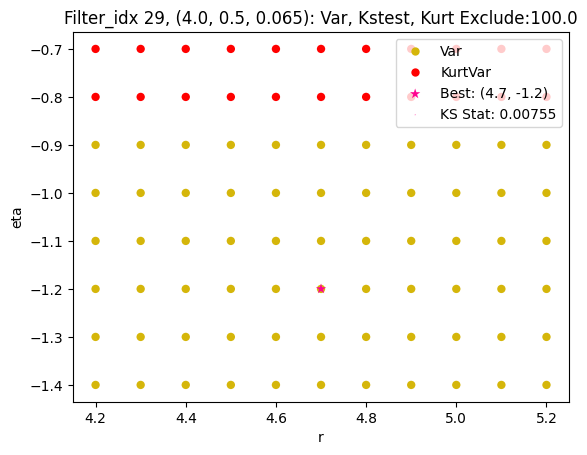

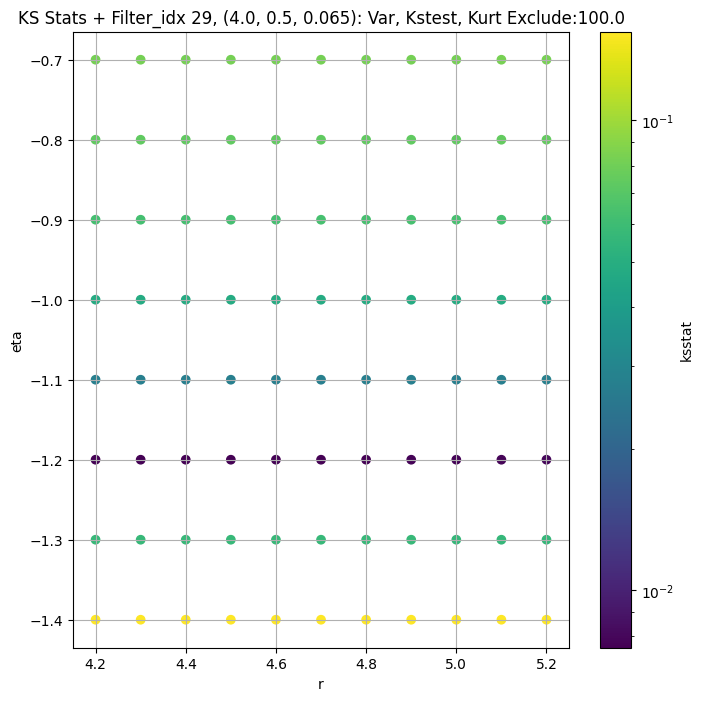

####
Filter_idx, 30: (4.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 0 0.010203621643578575 15.86944


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 50 0.009938565455156811 14.236755


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 100 0.010029765238396049 13.553629


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 200 0.010010558015282112 12.5959015
Number of samples: 100000, Without approximation : 160000000.0


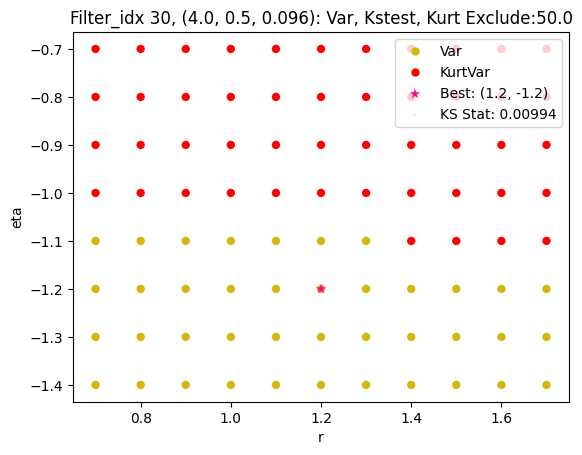

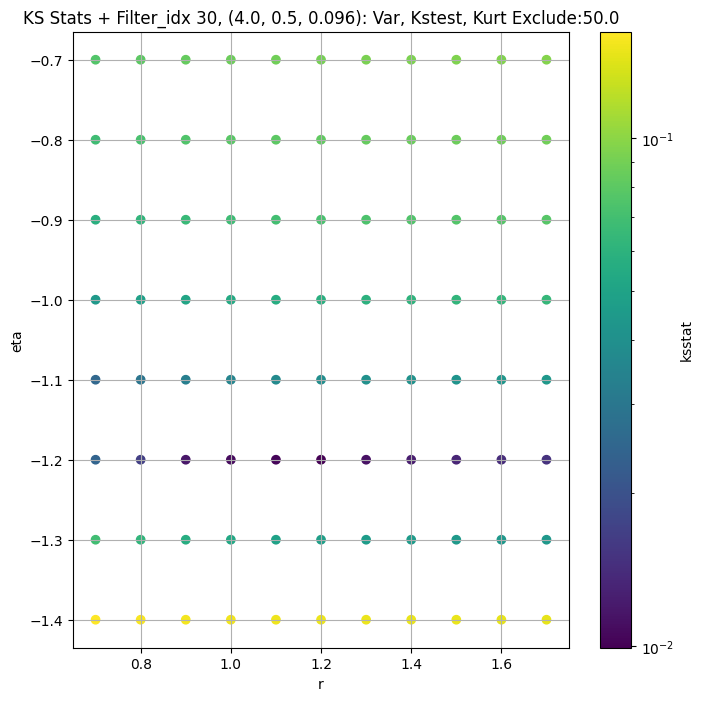

####
Filter_idx, 31: (4.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 0 0.009201922810405938 6.385866


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 50 0.0097095413473407 5.6715565


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 100 0.007812975952579793 5.378657


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 200 0.012080926048810614 4.9714174
Number of samples: 100000, Without approximation : 160000000.0


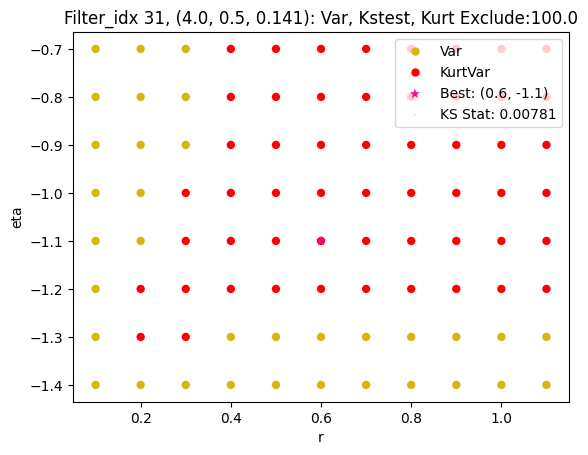

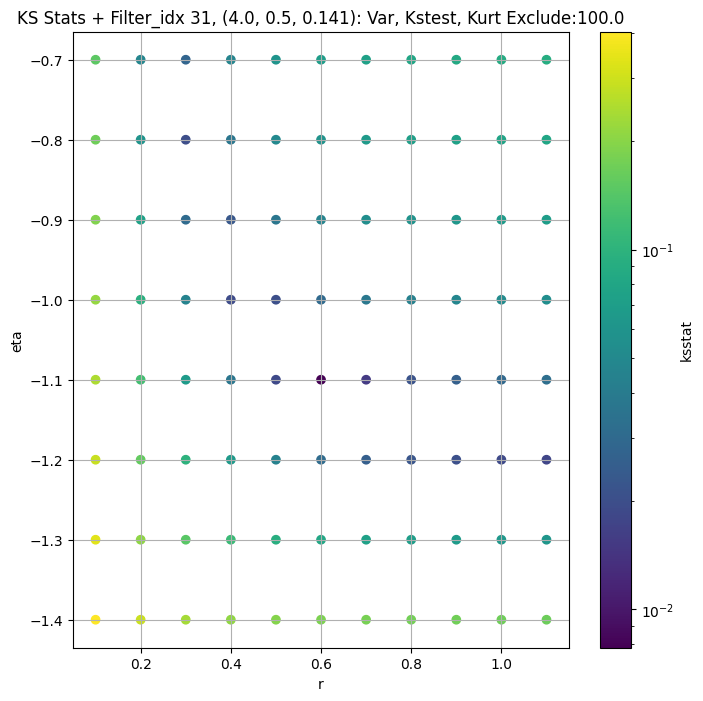

####
Filter_idx, 32: (4.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 0 0.009279140932316132 2.6509702


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 50 0.009053565791638851 2.2561753


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 100 0.01258639905250128 2.120077


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 200 0.010103298436609509 1.9380797
Number of samples: 100000, Without approximation : 160000000.0


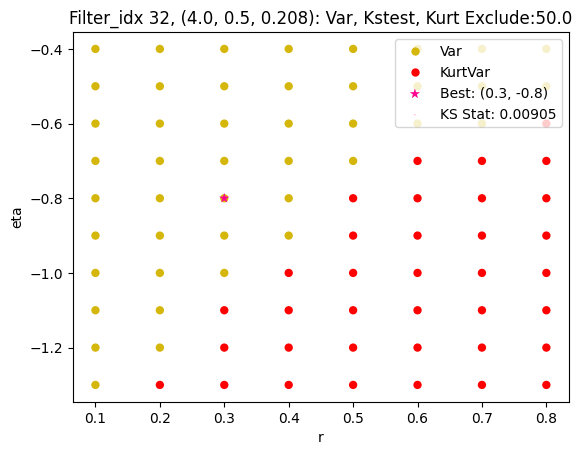

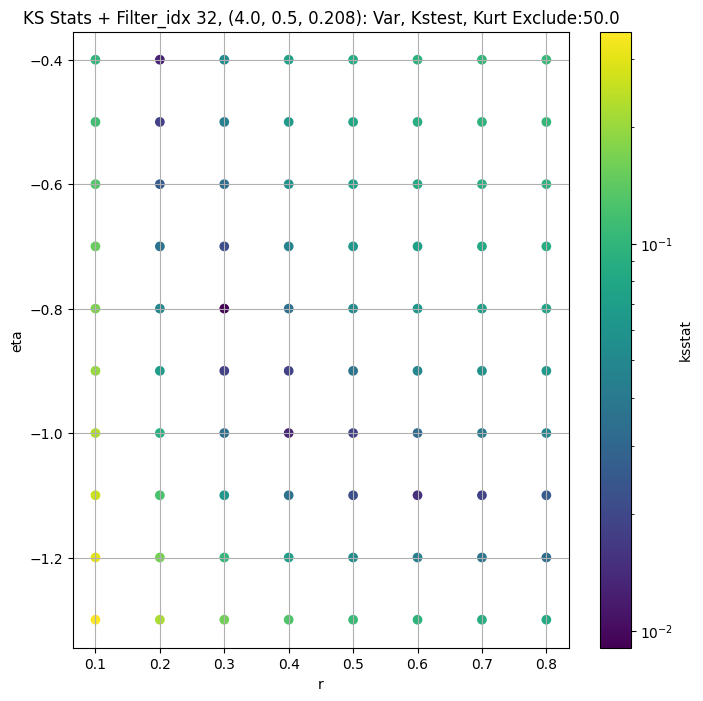

####
Filter_idx, 33: (4.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 0 0.003838543428284047 0.82752943


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 50 0.006482775819139752 0.6698969


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 100 0.005052653474808794 0.6249114


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 200 0.007254356101910886 0.567373
Number of samples: 100000, Without approximation : 160000000.0


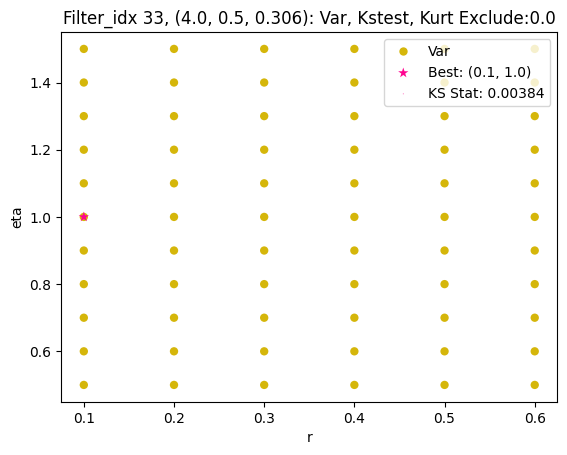

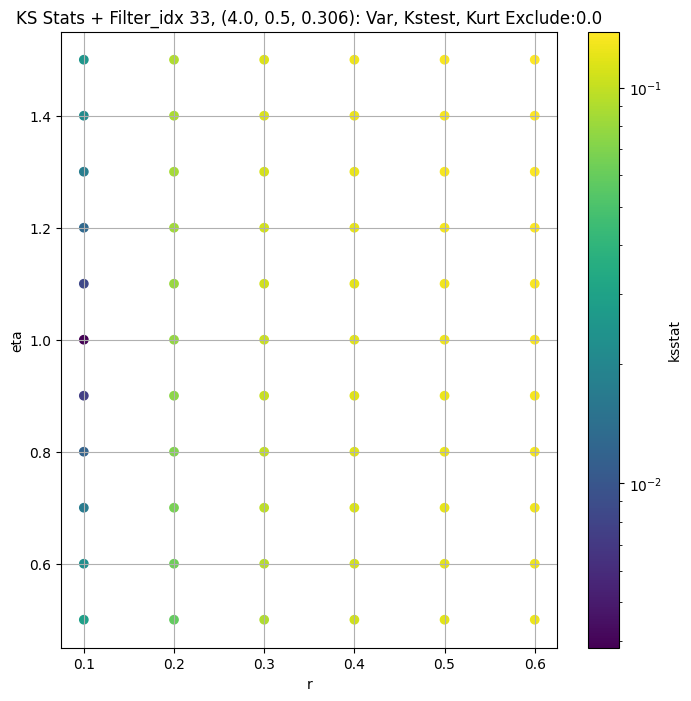

####
Filter_idx, 34: (4.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 0 0.0045079290799441285 0.21931684


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 50 0.002246722108521809 0.18147968


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 100 0.00277788485197452 0.17126872


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 200 0.004350694518241327 0.15801843
Number of samples: 100000, Without approximation : 160000000.0


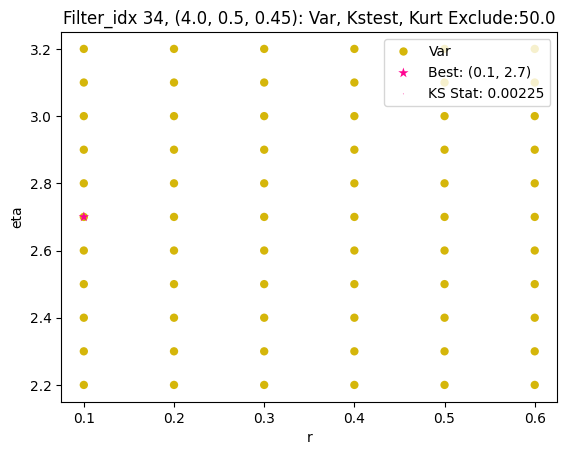

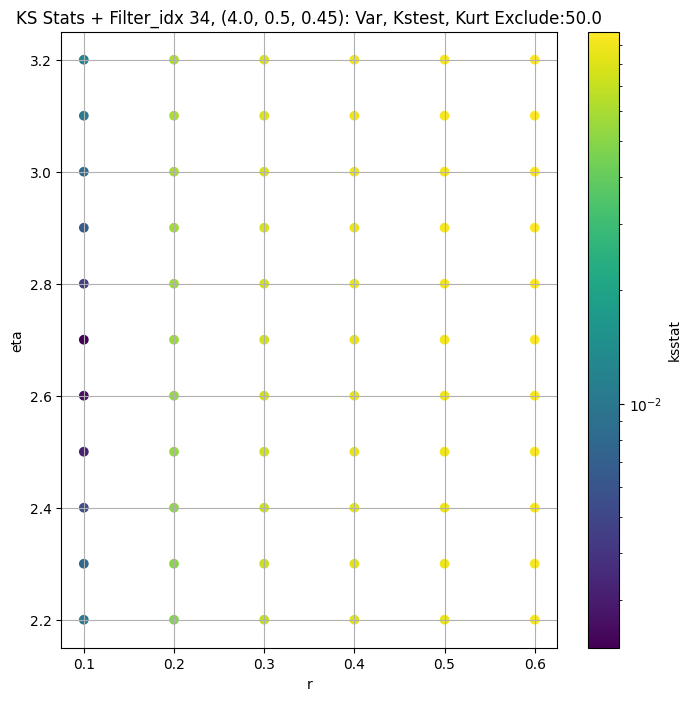

####
Filter_idx, 35: (4.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 0 0.007761184989328207 92.47971


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 50 0.007483662925622636 85.66437


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 100 0.0076178407998775954 82.20661


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 200 0.007653025537141311 77.231926
Number of samples: 100000, Without approximation : 160000000.0


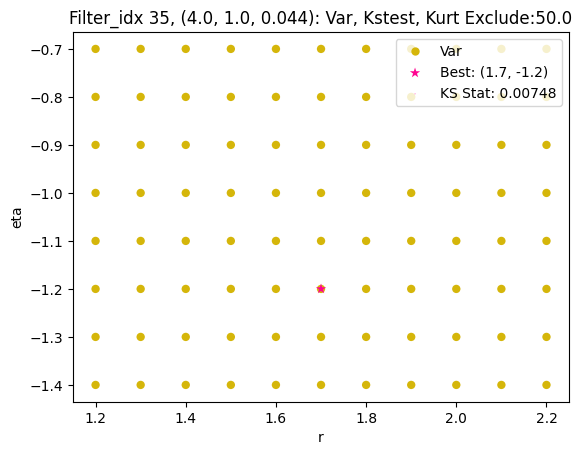

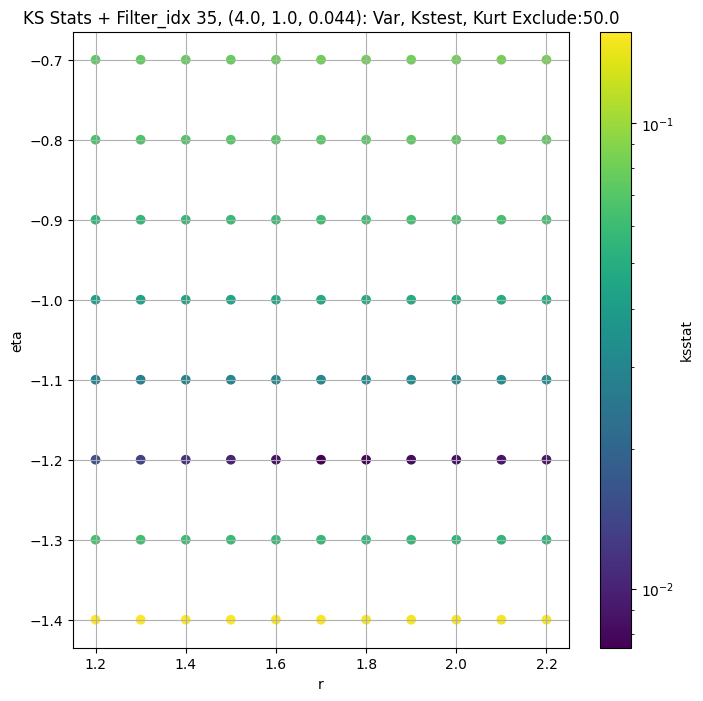

####
Filter_idx, 36: (4.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 0 0.007615433413510342 37.6041


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 50 0.007503940165904166 33.882614


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 100 0.007448766096619486 32.380245


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 200 0.007337791457718457 30.265472
Number of samples: 100000, Without approximation : 160000000.0


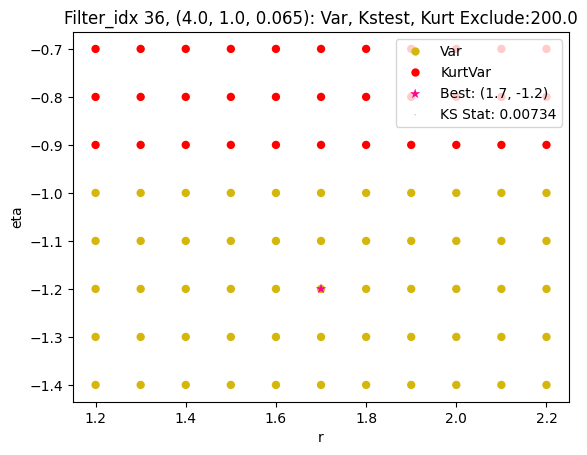

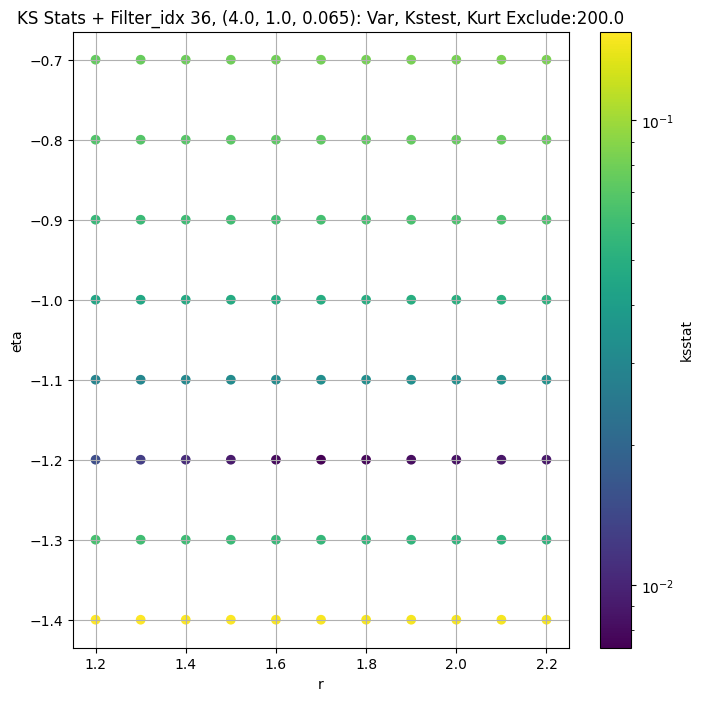

####
Filter_idx, 37: (4.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 0 0.009901609613327977 17.860968


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 50 0.009337569911128552 15.752489


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 100 0.009280206377900169 14.966462


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 200 0.009033104887511745 13.873773
Number of samples: 100000, Without approximation : 160000000.0


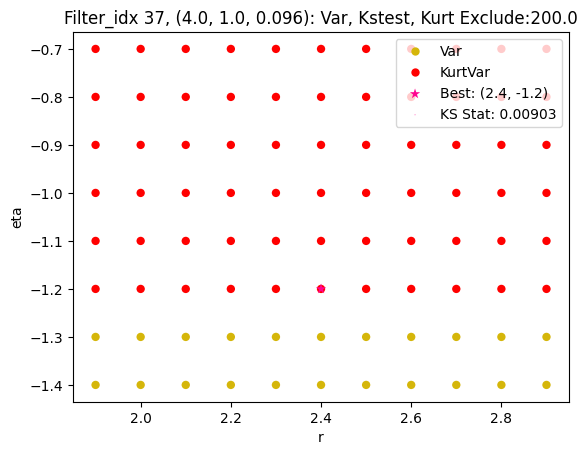

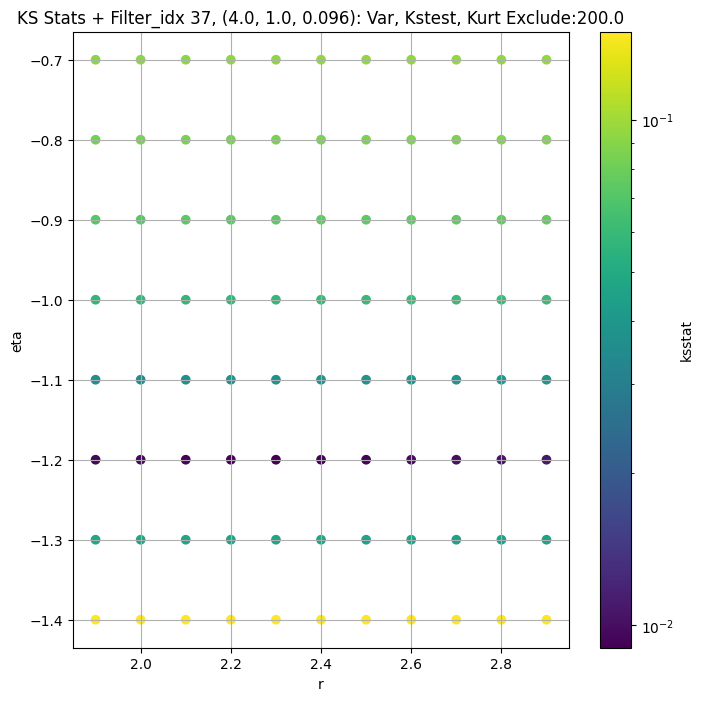

####
Filter_idx, 38: (4.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 0 0.010636326960072273 7.61391


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 50 0.00859256996092811 6.6257243


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 100 0.011643912509327808 6.2523136


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 200 0.011509124079461808 5.7429304
Number of samples: 100000, Without approximation : 160000000.0


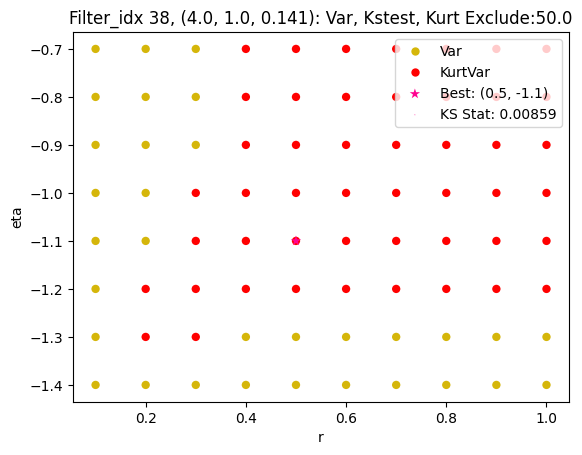

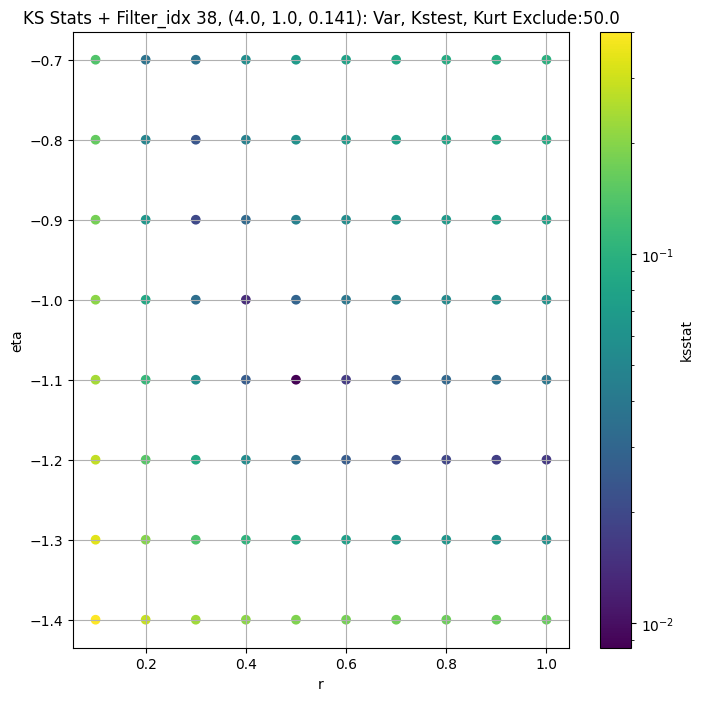

####
Filter_idx, 39: (4.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 0 0.008259044332016685 2.8589716


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 50 0.011124804077687123 2.3107495


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 100 0.009940893777440715 2.1613646


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 200 0.013984880818826761 1.9669842
Number of samples: 100000, Without approximation : 160000000.0


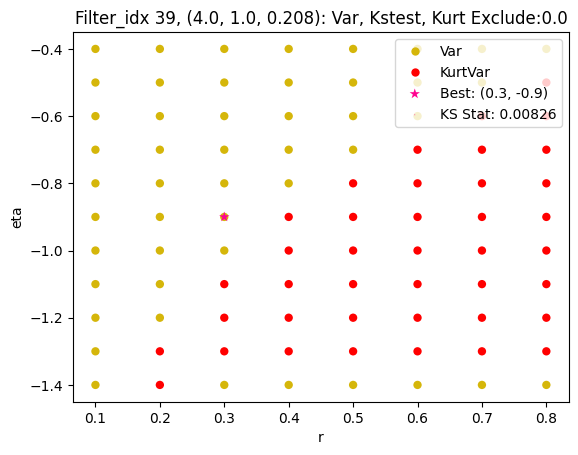

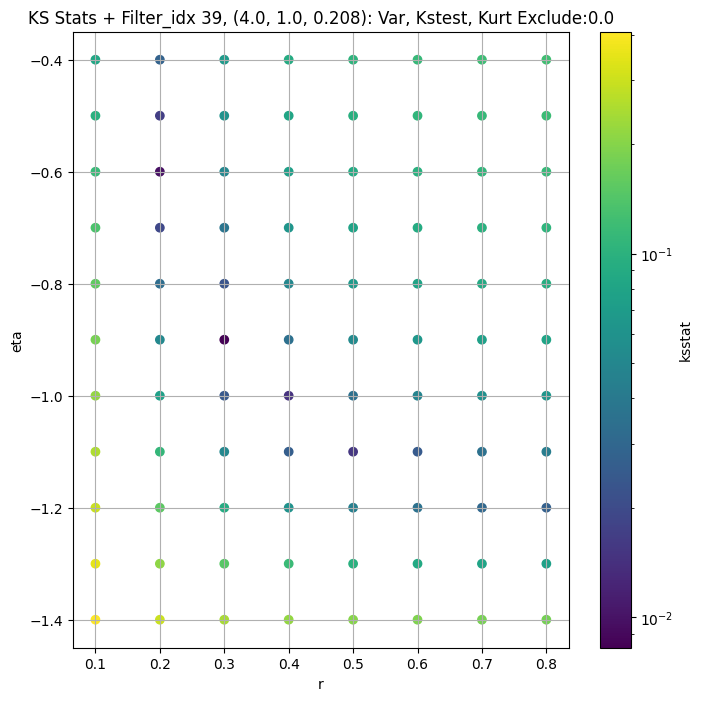

####
Filter_idx, 40: (4.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 0 0.004663395225467215 0.9422348


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 50 0.005031437042926301 0.74895394


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 100 0.0064940342445261034 0.6946562


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 200 0.0065947178723871555 0.6259773
Number of samples: 100000, Without approximation : 160000000.0


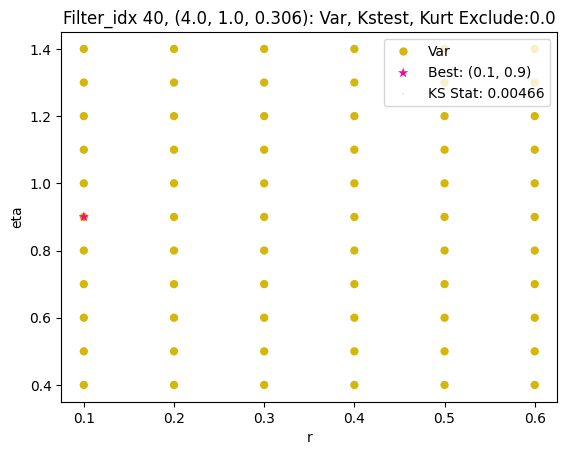

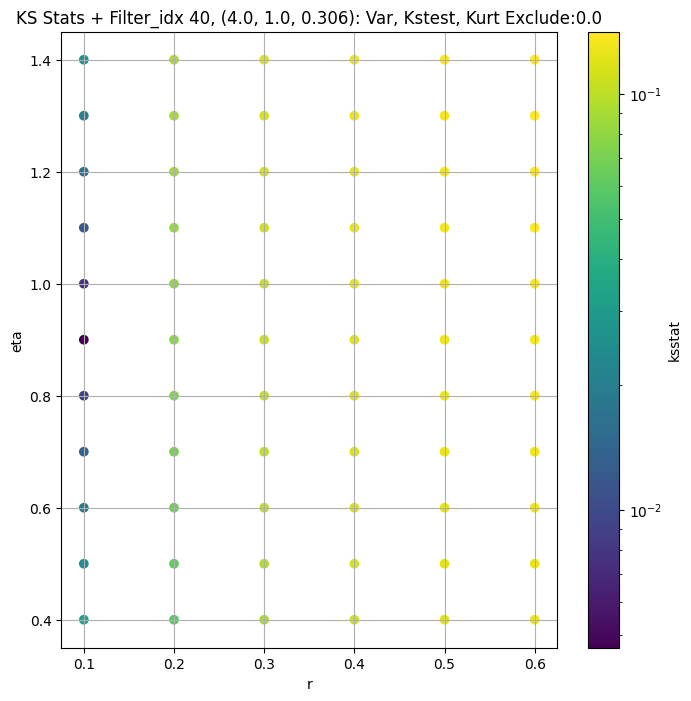

####
Filter_idx, 41: (4.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 0 0.007348273643194708 0.2931468


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 50 0.0025734452075596437 0.20962064


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 100 0.0030988824573610074 0.19574657


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 200 0.004956636004495155 0.17835863
Number of samples: 100000, Without approximation : 160000000.0


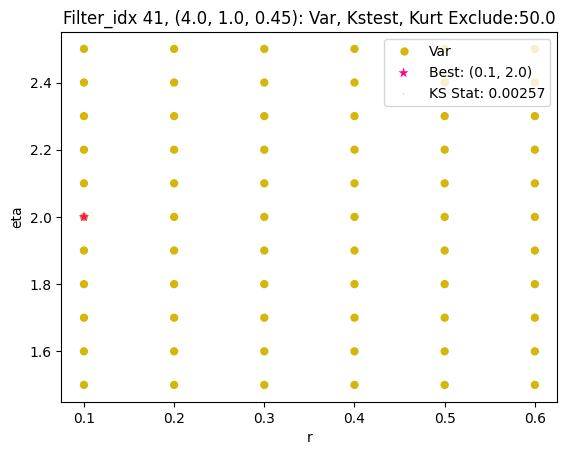

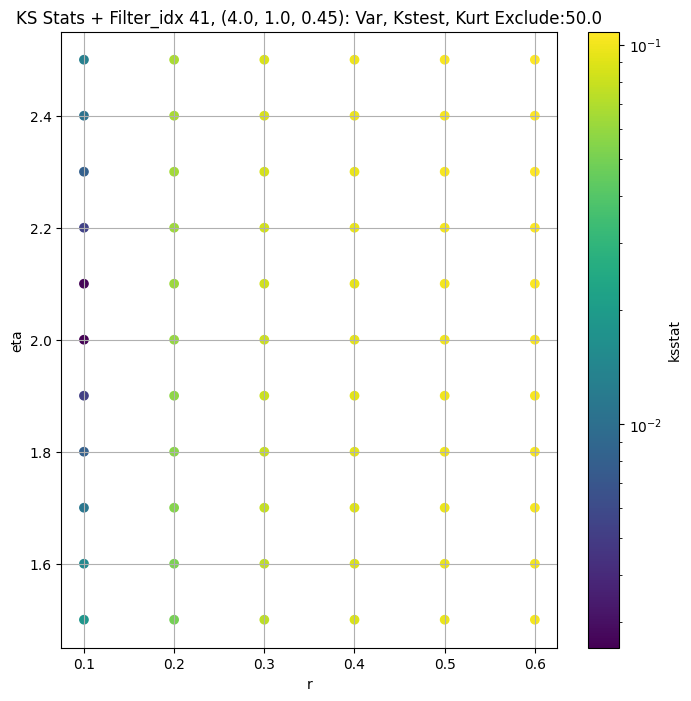

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,initial_r,initial_eta,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05
filter_idx,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",96.525920,70.528580,161.917770,19.178097,3.513101,155.585340,160000000.0,"(2.0, 0.5, 0.044)",0.010890,3.3,-1.2,4.500731e+02,0.0,96.525920,0.000107
1,"(2.0, 0.5, 0.065)",39.640656,29.082182,68.552986,24.873302,4.030701,218.632260,160000000.0,"(2.0, 0.5, 0.065)",0.009132,2.0,-1.2,1.617406e+02,50.0,36.007687,0.000107
2,"(2.0, 0.5, 0.096)",17.815247,12.593767,35.419140,39.990158,4.784158,295.938780,160000000.0,"(2.0, 0.5, 0.096)",0.008870,9.9,-1.2,6.333919e+01,200.0,13.963770,0.000107
3,"(2.0, 0.5, 0.141)",7.128089,4.933293,16.395422,52.462814,5.251441,315.332460,160000000.0,"(2.0, 0.5, 0.141)",0.007169,0.6,-1.1,8.106799e+00,0.0,7.128089,0.000107
4,"(2.0, 0.5, 0.208)",2.827215,1.798519,8.435795,99.624886,7.044568,497.418400,160000000.0,"(2.0, 0.5, 0.208)",0.008669,0.5,-1.0,1.030344e+00,200.0,2.060689,0.000107
5,"(2.0, 0.5, 0.306)",0.849095,0.525596,3.329293,202.204280,5.845236,593.344670,160000000.0,"(2.0, 0.5, 0.306)",0.004564,0.1,1.1,1.274587e-15,0.0,0.849095,0.000107
6,"(2.0, 0.5, 0.45)",0.509841,0.329509,1.785459,138.650010,5.808846,532.173160,160000000.0,"(2.0, 0.5, 0.45)",0.002769,0.1,1.5,2.209982e-16,0.0,0.509841,0.000107
7,"(2.0, 1.0, 0.044)",122.047100,91.589440,198.601530,18.166317,3.700830,162.124650,160000000.0,"(2.0, 1.0, 0.044)",0.013232,20.0,-1.2,5.426253e+02,0.0,122.047100,0.000107
8,"(2.0, 1.0, 0.065)",50.507060,36.873737,92.119070,23.864079,3.781666,200.233380,160000000.0,"(2.0, 1.0, 0.065)",0.008396,9.9,-1.2,2.080705e+02,50.0,45.871265,0.000107


In [17]:
master_df_combo_path = Path(os.path.join(CWD, "CSVs", "master_df_combo.csv"))
rEtaKsstats_dict_path = Path(os.path.join(CWD, "cache", "rEtaKsstats_dict.pickle"))

rEtaKsstats_dict = dict()

if RERUN or not master_df_combo_path.exists():
    sorted_params = sorted(all_cdfs)
    ksstats_dict = dict()

    for i, group in enumerate(GROUPS): # TODO For quick testing purposes
        print(f"####\n{GROUP.capitalize()}, {group}: {str(filter_group_map[group])}")
        sample = group_data_map[group]
        if len(sample) == 0:
            continue
        group_cdfs_df = all_cdfs_df.copy()
        master_df.loc[group, 'kstest_stat_initial'] = 1

        for j in range(len(EXCLUDE_CUTOFFS)):

            exclude_cutoff = EXCLUDE_CUTOFFS[j]
            exclude_cutoff = int(exclude_cutoff)

            if exclude_cutoff == 0:
                augmented_var = np.var(group_data_map[group]) 
            else:
                augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])
                if augmented_var == np.var(group_data_map[group]):
                    continue 
                
            group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
            ksstats, initial_param, min_stat = gridsearch(sample, all_cdfs, debug=True, scales=group_cdfs_df['scale'])
            augmented_var_df.loc[group, f"kstest_stat_{exclude_cutoff}"] = min_stat
            group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] = ksstats
            
            print(group, exclude_cutoff, min_stat, augmented_var)
            
            if (min_stat < master_df.loc[group, 'kstest_stat_initial']) and not np.isclose(min_stat, master_df.loc[group, 'kstest_stat_initial'], 1e-6):
                inital_min_stat = min_stat
                inital_best_param = initial_param
                master_df.loc[group, 'kstest_stat_initial'] = min_stat
                initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                master_df.loc[group, 'initial_r'], master_df.loc[group, 'initial_eta'] = initial_param
                master_df.loc[group, 'initial_scale'] = initial_scale
                master_df.loc[group, 'initial_exclude_cutoff'] = exclude_cutoff
                master_df.loc[group, 'best_augmented_var'] = augmented_var
        
        ksstats = group_cdfs_df[f"ksstat_exclude_{int(master_df.loc[group, 'initial_exclude_cutoff'])}"]
            
        print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
        
        cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
        master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

        best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

        group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
        group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

        group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

        group_dict = {'r' : group_cdfs_df['r'], 'eta' : group_cdfs_df['eta']}
        group_dict.update({f'ksstat_exclude_{exclude_cutoff}' : group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] for exclude_cutoff in EXCLUDE_CUTOFFS[:j+1]})
        rEtaKsstats_dict[group] = group_dict

        cols = ['pass_var', 'pass_kstest', 'pass_kurt']

        fig = combo_test_plot(group_cdfs_df, cols, 
                            plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: {', '.join([col[5:].capitalize() for col in cols])} Exclude:{master_df.loc[group, 'initial_exclude_cutoff']}", 
                            target_var = None,
                            best_param = inital_best_param,
                            best_ksstat=inital_min_stat
                            )
        
        fig.figure.savefig(os.path.join(CWD, "plots", f"full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)

        # Optional: 
        # Create plots of bootstrapped variance and kurtosis for varying confidence intervals
        # fig_var = create_ci_scatter_plot(group_cdfs_df, var_values_dict, metric='variance', group=group)
        # fig_kurt = create_ci_scatter_plot(group_cdfs_df, kurt_values_dict, metric='kurtosis', group=group)

        # fig_var.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_var)
        # fig_kurt.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_kurt)

    # new: add parameter information
    master_df.insert(0, 'params', master_df.index.map(filter_group_map))

    master_df.to_csv(master_df_combo_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)
    augmented_var_df.to_csv(augmented_var_df_path)

augmented_var_df = pd.read_csv(augmented_var_df_path, index_col=GROUP)
master_df = pd.read_csv(master_df_combo_path, index_col=GROUP)
rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df

## Optimization

In [18]:
master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
master_df[f'best_r'] = master_df['initial_r']
master_df[f'best_eta'] = master_df['initial_eta']
master_df[f'best_scale'] = master_df['initial_scale']
master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

Filter_idx 0, (2.0, 0.5, 0.044):


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 0, 0.0 + 100 = 100, ksstat: 0.014245116069428576, var: 84.58124542236328


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 0, 0.0 + 75 = 75, ksstat: 0.013285513655237224, var: 86.18563842773438


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 0, 0.0 + 50 = 50, ksstat: 0.012173461079116932, var: 88.10179901123047


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 0, 0.0 + 25 = 25, ksstat: 0.012584955630806804, var: 90.61355590820312


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 0, 0.0 + 0 = 0, ksstat: 0.010890107526111303, var: 96.52591705322266
Number of samples: 100000, Without approximation : 160000000.0


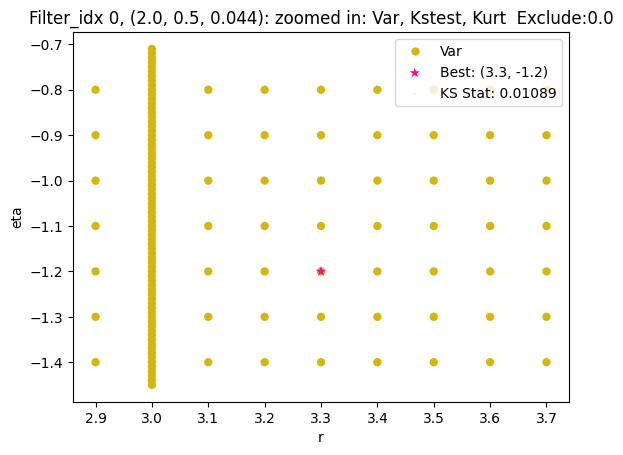

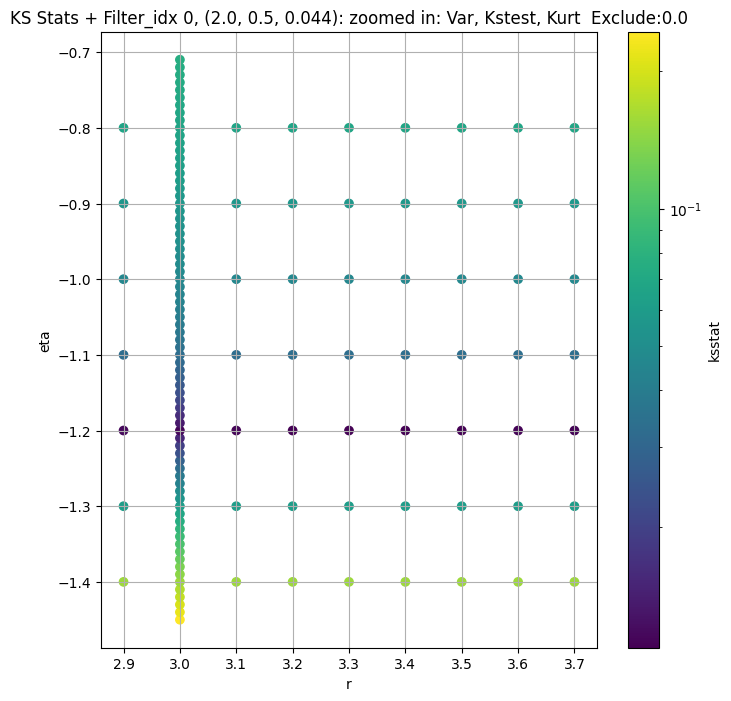

Filter_idx 1, (2.0, 0.5, 0.065):


  0%|          | 0/718 [00:00<?, ?it/s]

Finding Minimum after computing 718 CDFs
filter_idx 1, 50.0 + 100 = 150, ksstat: 0.01040879822354207, var: 33.30707550048828


  0%|          | 0/718 [00:00<?, ?it/s]

Finding Minimum after computing 718 CDFs
filter_idx 1, 50.0 + 75 = 125, ksstat: 0.0095768838147266, var: 33.863487243652344


  0%|          | 0/718 [00:00<?, ?it/s]

Finding Minimum after computing 718 CDFs
filter_idx 1, 50.0 + 50 = 100, ksstat: 0.009148786703455092, var: 34.480445861816406


  0%|          | 0/718 [00:00<?, ?it/s]

Finding Minimum after computing 718 CDFs
filter_idx 1, 50.0 + 25 = 75, ksstat: 0.009229970013051814, var: 35.180782318115234


  0%|          | 0/718 [00:00<?, ?it/s]

Finding Minimum after computing 718 CDFs
filter_idx 1, 50.0 + 0 = 50, ksstat: 0.009042561945208805, var: 36.007686614990234


  0%|          | 0/718 [00:00<?, ?it/s]

Finding Minimum after computing 718 CDFs
filter_idx 1, 50.0 + -25 = 25, ksstat: 0.009004280060146419, var: 37.06752014160156


  0%|          | 0/718 [00:00<?, ?it/s]

Finding Minimum after computing 718 CDFs
filter_idx 1, 50.0 + -50 = 0, ksstat: 0.00848204218885383, var: 39.640655517578125
Number of samples: 100000, Without approximation : 160000000.0


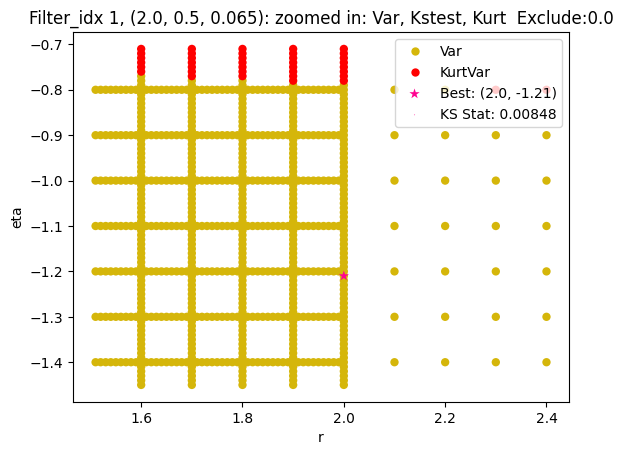

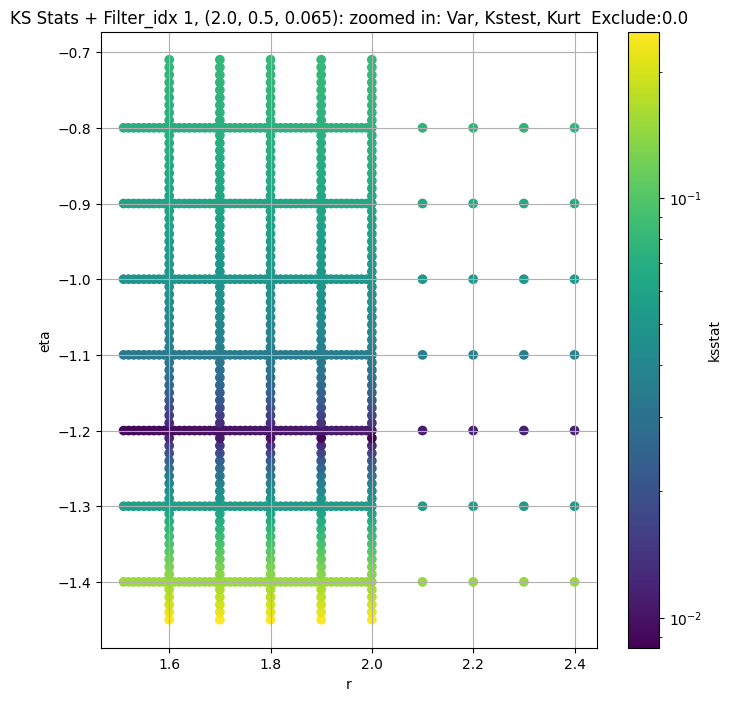

Filter_idx 2, (2.0, 0.5, 0.096):


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 2, 200.0 + 100 = 300, ksstat: 0.009244179904921879, var: 13.17940616607666


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 2, 200.0 + 75 = 275, ksstat: 0.009155836594267996, var: 13.358348846435547


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 2, 200.0 + 50 = 250, ksstat: 0.009064051312606458, var: 13.54759407043457


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 2, 200.0 + 25 = 225, ksstat: 0.008968334281324042, var: 13.748727798461914


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 2, 200.0 + 0 = 200, ksstat: 0.008869508885313238, var: 13.963769912719727


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 2, 200.0 + -25 = 175, ksstat: 0.009535160047992819, var: 14.195210456848145


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 2, 200.0 + -50 = 150, ksstat: 0.010665282375938334, var: 14.446712493896484


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 2, 200.0 + -75 = 125, ksstat: 0.011885907915887284, var: 14.723361015319824


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 2, 200.0 + -100 = 100, ksstat: 0.013224908670615432, var: 15.03294849395752
Number of samples: 100000, Without approximation : 160000000.0


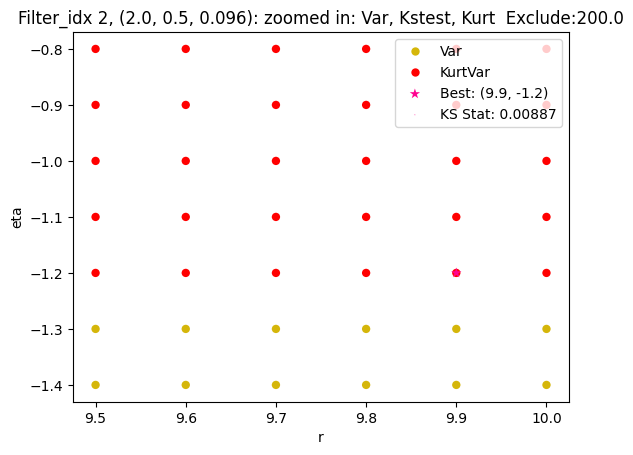

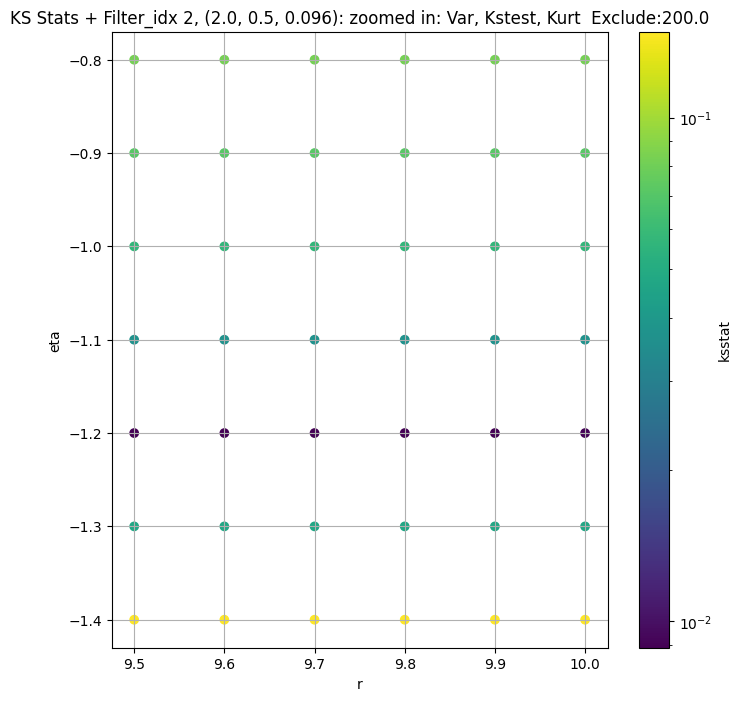

Filter_idx 3, (2.0, 0.5, 0.141):


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 3, 0.0 + 100 = 100, ksstat: 0.006907292193753717, var: 5.960586071014404


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 3, 0.0 + 75 = 75, ksstat: 0.006634279761972006, var: 6.106245517730713


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 3, 0.0 + 50 = 50, ksstat: 0.00672620108365396, var: 6.280857086181641


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 3, 0.0 + 25 = 25, ksstat: 0.006641596303979813, var: 6.5096540451049805


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 3, 0.0 + 0 = 0, ksstat: 0.006834506735504231, var: 7.128089427947998
Number of samples: 100000, Without approximation : 160000000.0


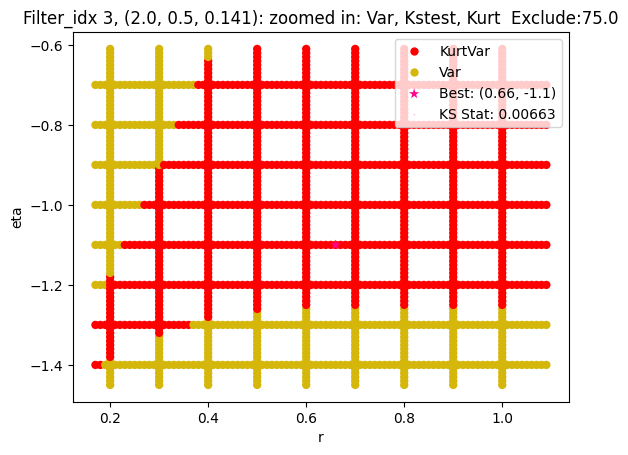

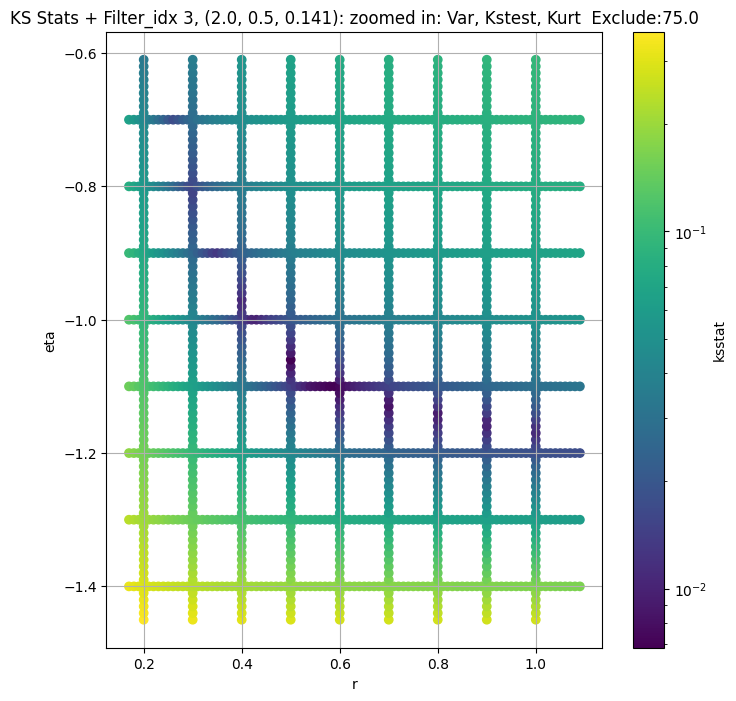

Filter_idx 4, (2.0, 0.5, 0.208):


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 200.0 + 100 = 300, ksstat: 0.00837704261445138, var: 1.9241002798080444


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 200.0 + 75 = 275, ksstat: 0.007898541176427298, var: 1.9549773931503296


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 200.0 + 50 = 250, ksstat: 0.007481616480204734, var: 1.9878017902374268


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 200.0 + 25 = 225, ksstat: 0.007753626363887323, var: 2.022899866104126


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 200.0 + 0 = 200, ksstat: 0.007416021301991704, var: 2.0606887340545654


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 200.0 + -25 = 175, ksstat: 0.007721359933843264, var: 2.1017138957977295


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 200.0 + -50 = 150, ksstat: 0.007985145435927543, var: 2.1467041969299316


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 200.0 + -75 = 125, ksstat: 0.0077197087874998765, var: 2.1966805458068848


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 4, 200.0 + -100 = 100, ksstat: 0.006940682740820603, var: 2.253248453140259
Number of samples: 100000, Without approximation : 160000000.0


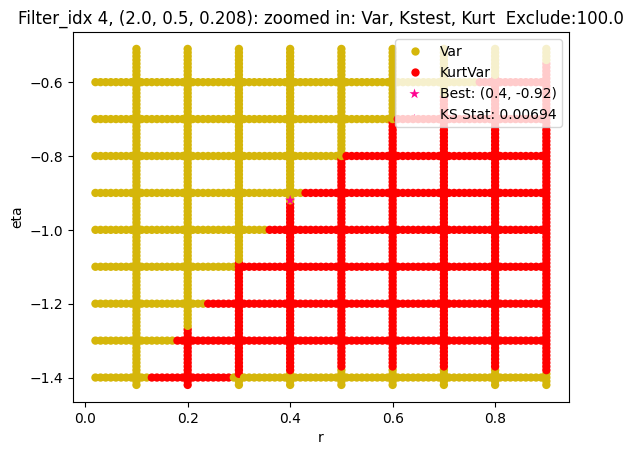

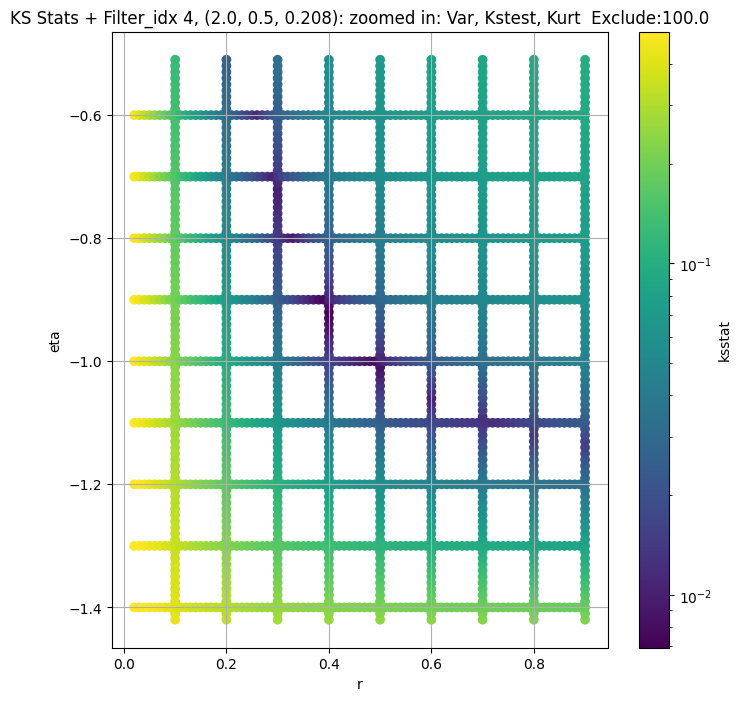

Filter_idx 5, (2.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 0.0 + 100 = 100, ksstat: 0.009365718959141067, var: 0.6612052917480469


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 0.0 + 75 = 75, ksstat: 0.008146947014876726, var: 0.6804423928260803


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 0.0 + 50 = 50, ksstat: 0.00781996469890478, var: 0.7039151787757874


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 0.0 + 25 = 25, ksstat: 0.007030881414721732, var: 0.7352924942970276


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 0.0 + 0 = 0, ksstat: 0.004564029011188325, var: 0.8490954637527466
Number of samples: 100000, Without approximation : 160000000.0


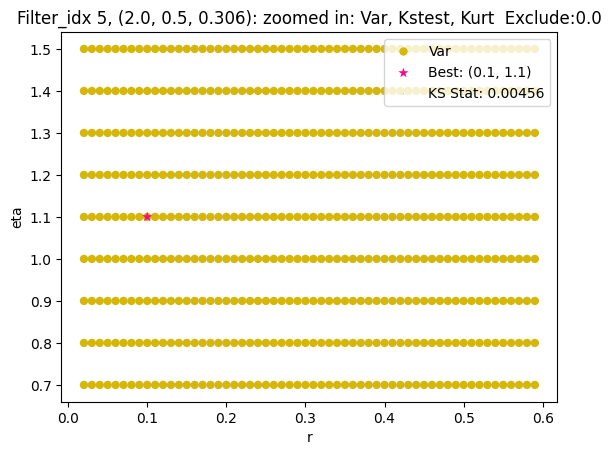

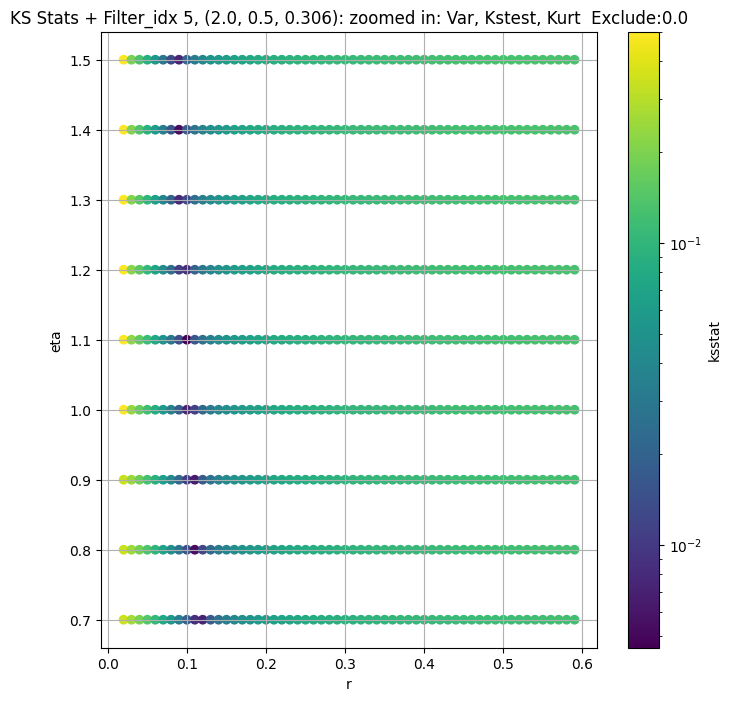

Filter_idx 6, (2.0, 0.5, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 0.0 + 100 = 100, ksstat: 0.007206978268536002, var: 0.40339380502700806


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 0.0 + 75 = 75, ksstat: 0.006452278150677726, var: 0.4145559072494507


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 0.0 + 50 = 50, ksstat: 0.005443813448366974, var: 0.42822006344795227


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 0.0 + 25 = 25, ksstat: 0.00476813287822031, var: 0.44668301939964294


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 6, 0.0 + 0 = 0, ksstat: 0.00245591956917135, var: 0.5098412036895752
Number of samples: 100000, Without approximation : 160000000.0


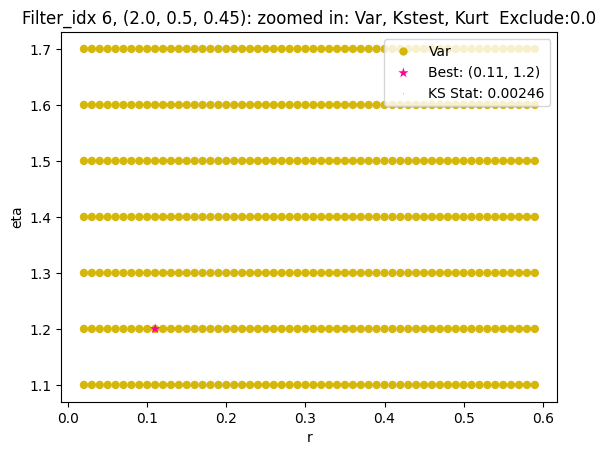

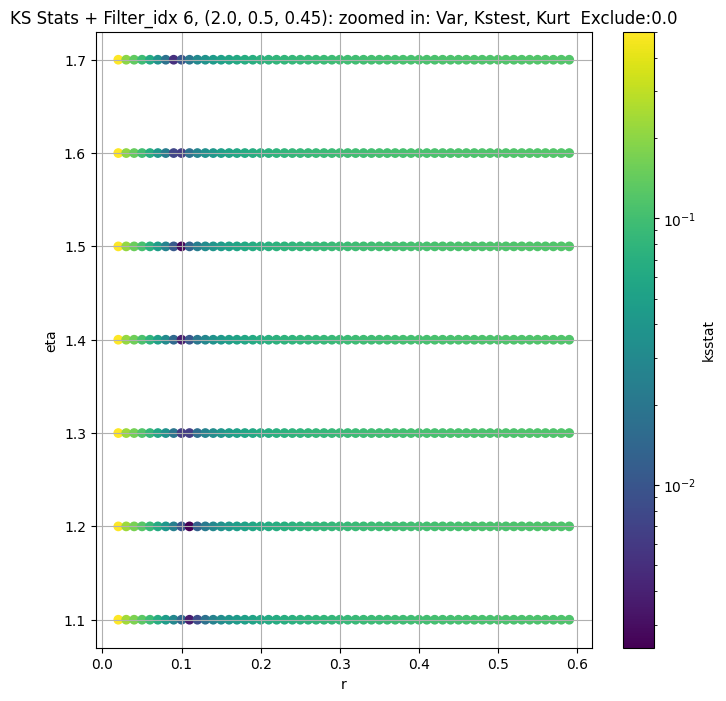

Filter_idx 7, (2.0, 1.0, 0.044):


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 7, 0.0 + 100 = 100, ksstat: 0.018785453601528446, var: 107.56945037841797


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 7, 0.0 + 75 = 75, ksstat: 0.017962342209706217, var: 109.54580688476562


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 7, 0.0 + 50 = 50, ksstat: 0.017016477693788667, var: 111.885986328125


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 7, 0.0 + 25 = 25, ksstat: 0.015836257536434917, var: 114.9184799194336


  0%|          | 0/7 [00:00<?, ?it/s]

Finding Minimum after computing 7 CDFs
filter_idx 7, 0.0 + 0 = 0, ksstat: 0.013232202562039386, var: 122.0470962524414
Number of samples: 100000, Without approximation : 160000000.0


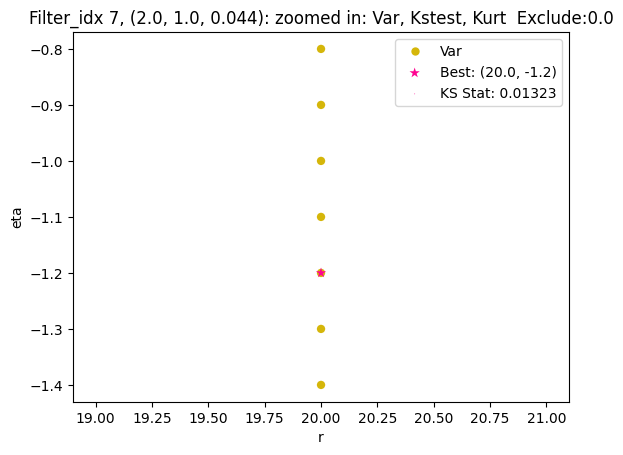

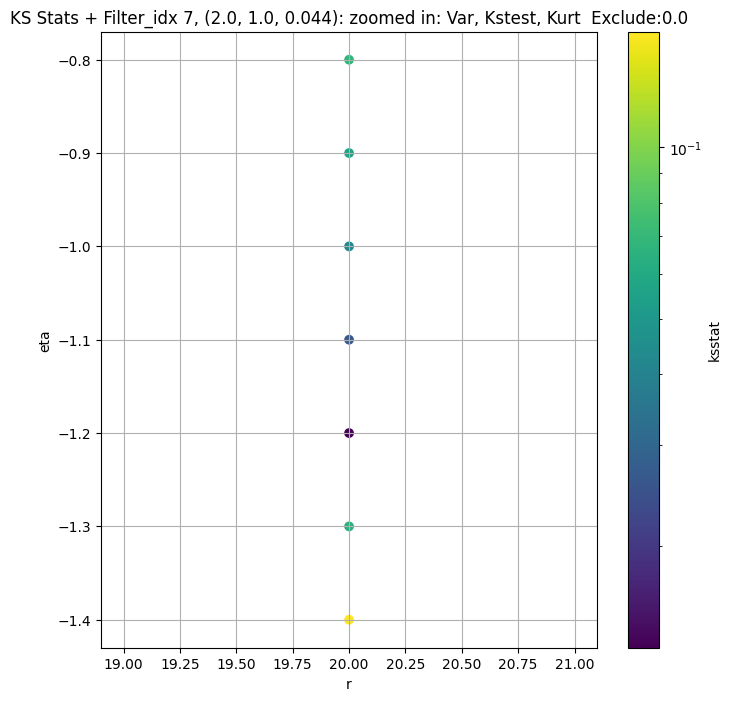

Filter_idx 8, (2.0, 1.0, 0.065):


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 8, 50.0 + 100 = 150, ksstat: 0.011720673276056748, var: 42.52666091918945


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 8, 50.0 + 75 = 125, ksstat: 0.011009174909547115, var: 43.208858489990234


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 8, 50.0 + 50 = 100, ksstat: 0.01023385020186418, var: 43.968631744384766


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 8, 50.0 + 25 = 75, ksstat: 0.009375144102821809, var: 44.83694076538086


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 8, 50.0 + 0 = 50, ksstat: 0.008395879391196265, var: 45.87126541137695


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 8, 50.0 + -25 = 25, ksstat: 0.010157475036709496, var: 47.21523666381836


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 8, 50.0 + -50 = 0, ksstat: 0.014389793838178275, var: 50.50706100463867
Number of samples: 100000, Without approximation : 160000000.0


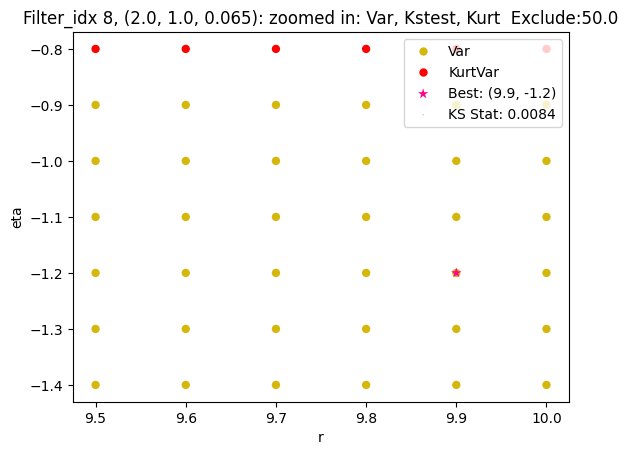

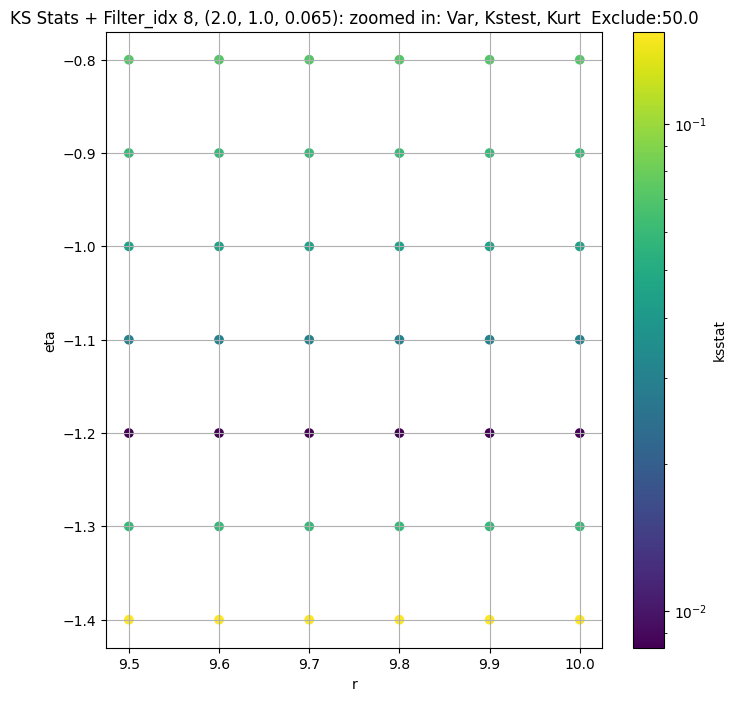

Filter_idx 9, (2.0, 1.0, 0.096):


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 9, 200.0 + 100 = 300, ksstat: 0.008192502901986476, var: 17.09225845336914


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 9, 200.0 + 75 = 275, ksstat: 0.008115842845334731, var: 17.319129943847656


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 9, 200.0 + 50 = 250, ksstat: 0.008036364392822404, var: 17.55916404724121


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 9, 200.0 + 25 = 225, ksstat: 0.007953365483180153, var: 17.814342498779297


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 9, 200.0 + 0 = 200, ksstat: 0.007866777424395122, var: 18.087139129638672


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 9, 200.0 + -25 = 175, ksstat: 0.008322993698477277, var: 18.380992889404297


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 9, 200.0 + -50 = 150, ksstat: 0.009421612732961826, var: 18.700851440429688


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 9, 200.0 + -75 = 125, ksstat: 0.010612058982689049, var: 19.053373336791992


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 9, 200.0 + -100 = 100, ksstat: 0.01192378924590054, var: 19.44875717163086
Number of samples: 100000, Without approximation : 160000000.0


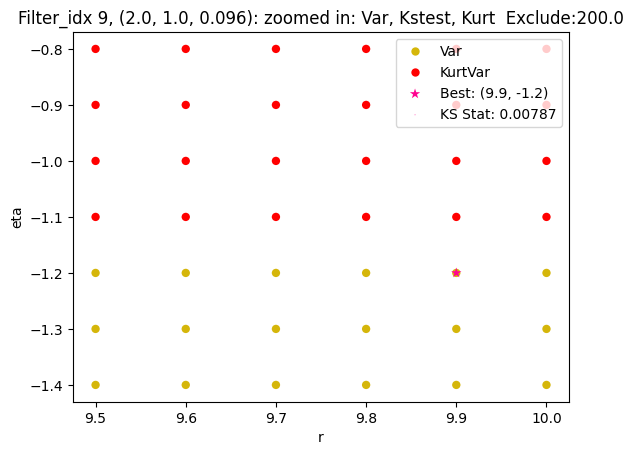

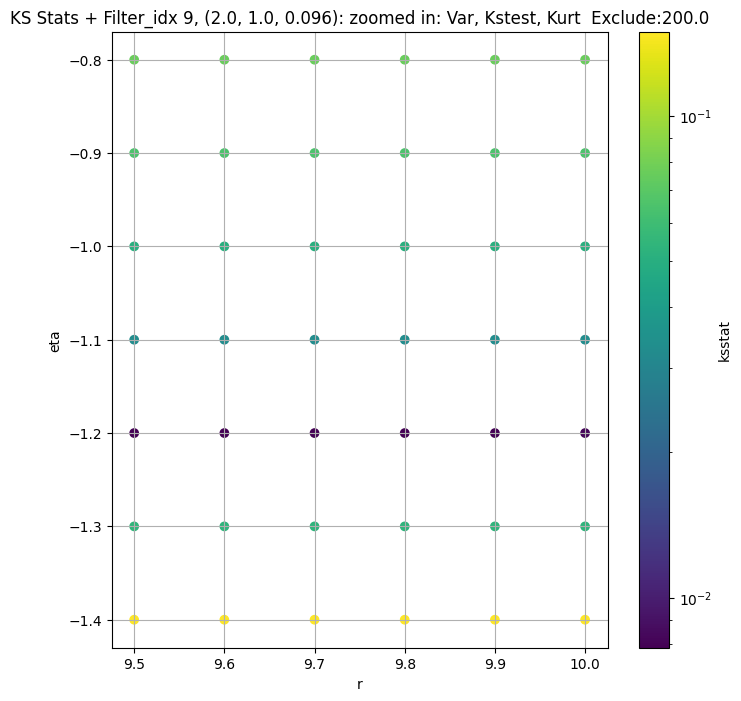

Filter_idx 10, (2.0, 1.0, 0.141):


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 50.0 + 100 = 150, ksstat: 0.007093948619167401, var: 7.401625633239746


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 50.0 + 75 = 125, ksstat: 0.007212444555953129, var: 7.552154064178467


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 50.0 + 50 = 100, ksstat: 0.006611416850347163, var: 7.720470428466797


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 50.0 + 25 = 75, ksstat: 0.006891102573155172, var: 7.913414478302002


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 50.0 + 0 = 50, ksstat: 0.0070544132975313145, var: 8.143867492675781


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 50.0 + -25 = 25, ksstat: 0.006810775264904478, var: 8.444064140319824


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 10, 50.0 + -50 = 0, ksstat: 0.006072124735765738, var: 9.308574676513672
Number of samples: 100000, Without approximation : 160000000.0


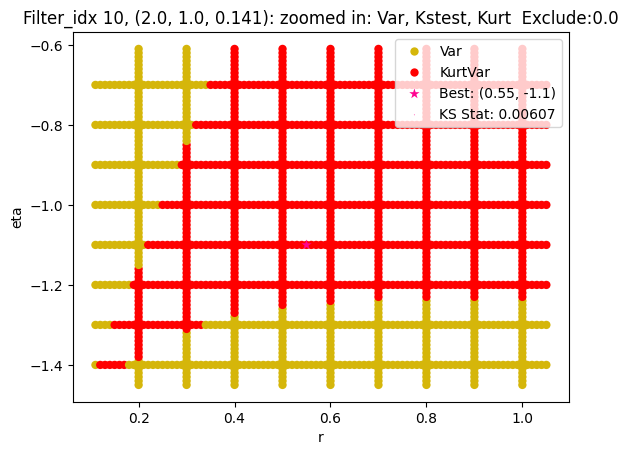

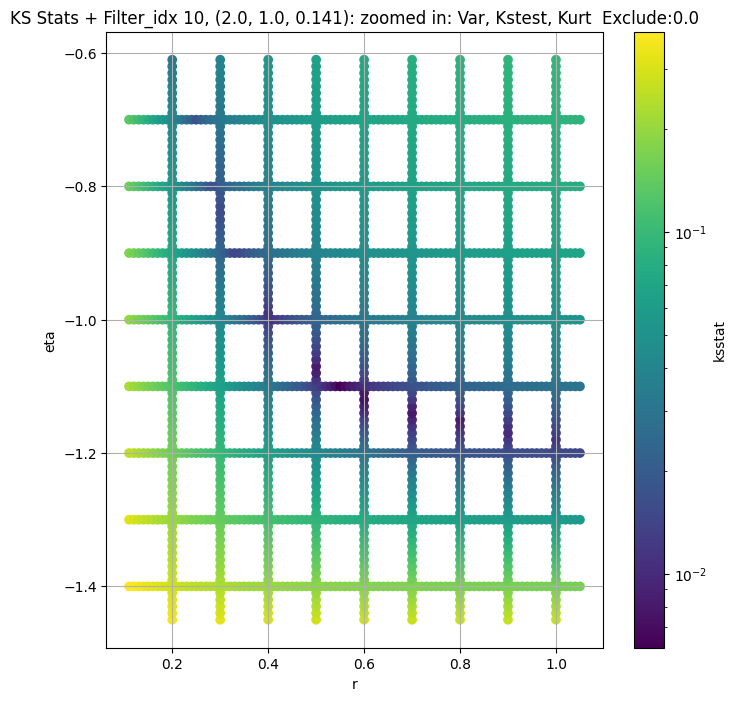

Filter_idx 11, (2.0, 1.0, 0.208):


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 100.0 + 100 = 200, ksstat: 0.006932514104706966, var: 2.878579616546631


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 100.0 + 75 = 175, ksstat: 0.006559985679219116, var: 2.932978630065918


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 100.0 + 50 = 150, ksstat: 0.006158096364677207, var: 2.9924466609954834


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 100.0 + 25 = 125, ksstat: 0.005707662599442664, var: 3.0583133697509766


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 100.0 + 0 = 100, ksstat: 0.005762372295863405, var: 3.1326138973236084


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 100.0 + -25 = 75, ksstat: 0.005928418102288502, var: 3.2187438011169434


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 100.0 + -50 = 50, ksstat: 0.006056610286553354, var: 3.323148727416992


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 100.0 + -75 = 25, ksstat: 0.006047336659839808, var: 3.462141752243042


  0%|          | 0/1656 [00:00<?, ?it/s]

Finding Minimum after computing 1656 CDFs
filter_idx 11, 100.0 + -100 = 0, ksstat: 0.004792525811357251, var: 3.860949754714966
Number of samples: 100000, Without approximation : 160000000.0


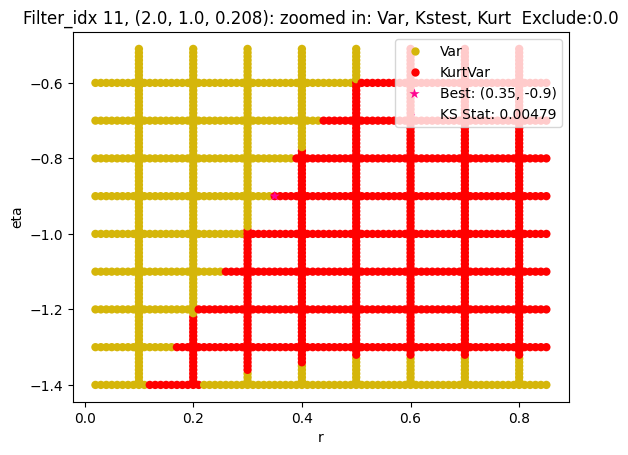

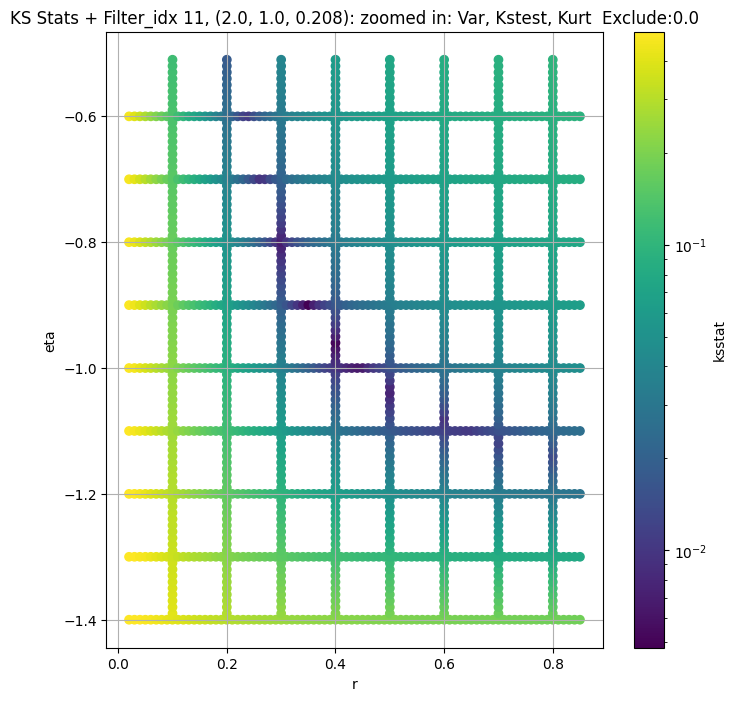

Filter_idx 12, (2.0, 1.0, 0.306):


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 12, 200.0 + 100 = 300, ksstat: 0.007442040780960335, var: 0.8991720676422119


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 12, 200.0 + 75 = 275, ksstat: 0.00715740208796134, var: 0.9139503240585327


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 12, 200.0 + 50 = 250, ksstat: 0.006488646779320963, var: 0.9296727180480957


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 12, 200.0 + 25 = 225, ksstat: 0.006246198104389089, var: 0.946485698223114


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 12, 200.0 + 0 = 200, ksstat: 0.006283835534367455, var: 0.9645806550979614


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 12, 200.0 + -25 = 175, ksstat: 0.006136380314940848, var: 0.9842111468315125


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 12, 200.0 + -50 = 150, ksstat: 0.006026147083721178, var: 1.0057185888290405


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 12, 200.0 + -75 = 125, ksstat: 0.00535764448449072, var: 1.0296155214309692


  0%|          | 0/1512 [00:00<?, ?it/s]

Finding Minimum after computing 1512 CDFs
filter_idx 12, 200.0 + -100 = 100, ksstat: 0.005052340830739577, var: 1.0566483736038208
Number of samples: 100000, Without approximation : 160000000.0


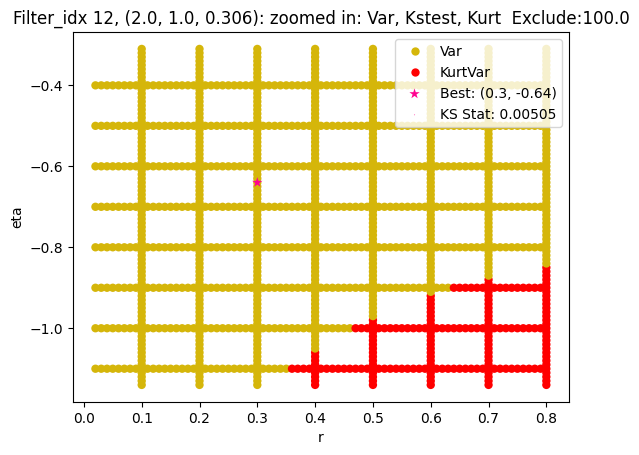

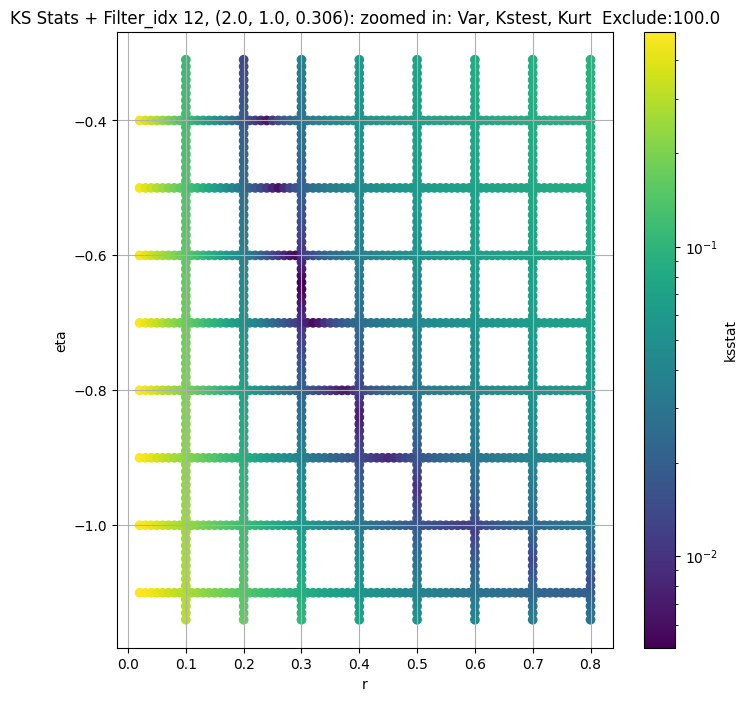

Filter_idx 13, (2.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 0.0 + 100 = 100, ksstat: 0.00564427395735656, var: 0.37814992666244507


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 0.0 + 75 = 75, ksstat: 0.005218402394472299, var: 0.38881924748420715


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 0.0 + 50 = 50, ksstat: 0.004399701954341362, var: 0.4018467366695404


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 0.0 + 25 = 25, ksstat: 0.003612376952651708, var: 0.41941747069358826


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 0.0 + 0 = 0, ksstat: 0.0019553202601598763, var: 0.47919532656669617
Number of samples: 100000, Without approximation : 160000000.0


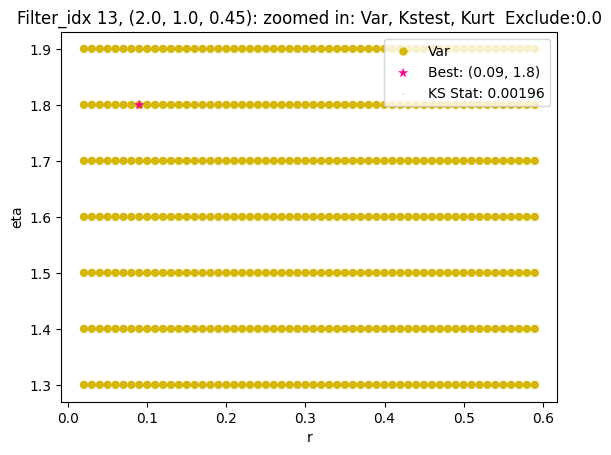

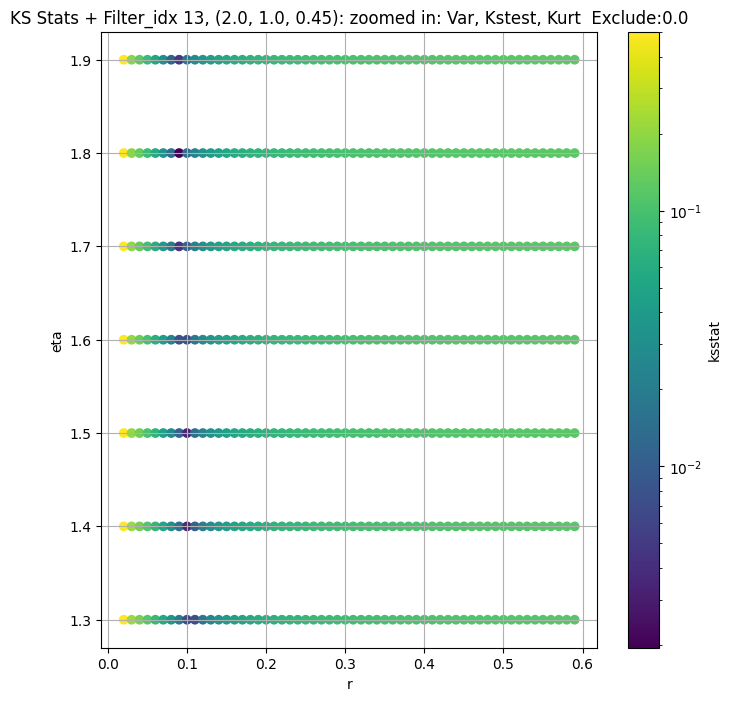

Filter_idx 14, (3.0, 0.5, 0.044):


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 14, 100.0 + 100 = 200, ksstat: 0.006343306729793552, var: 75.24993896484375


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 14, 100.0 + 75 = 175, ksstat: 0.006573159788983762, var: 76.33185577392578


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 14, 100.0 + 50 = 150, ksstat: 0.006818063852479739, var: 77.4986801147461


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 14, 100.0 + 25 = 125, ksstat: 0.0074058029591849706, var: 78.77133178710938


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 14, 100.0 + 0 = 100, ksstat: 0.007415191680576472, var: 80.17852020263672


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 14, 100.0 + -25 = 75, ksstat: 0.008458260940644197, var: 81.77007293701172


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 14, 100.0 + -50 = 50, ksstat: 0.009653484470142804, var: 83.641357421875


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 14, 100.0 + -75 = 25, ksstat: 0.010673821684892726, var: 86.0323486328125


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 14, 100.0 + -100 = 0, ksstat: 0.012884292607012932, var: 90.89836120605469
Number of samples: 100000, Without approximation : 160000000.0


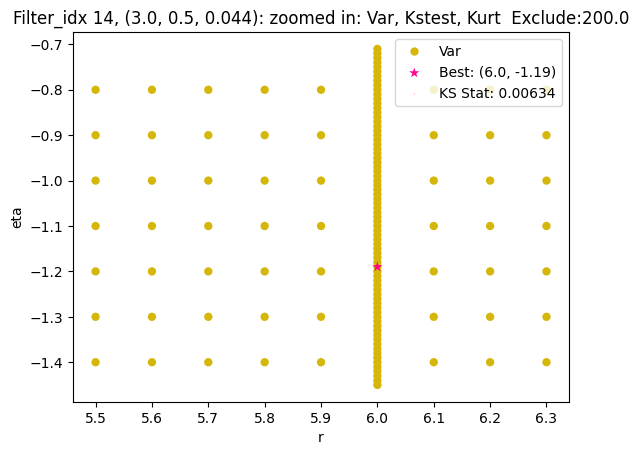

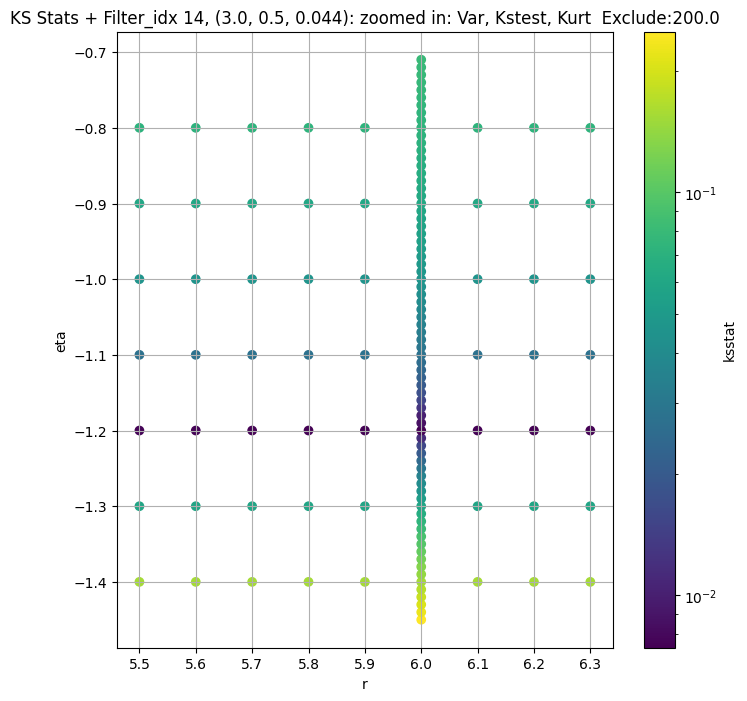

Filter_idx 15, (3.0, 0.5, 0.065):


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 15, 50.0 + 100 = 150, ksstat: 0.00903840165573222, var: 30.357437133789062


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 15, 50.0 + 75 = 125, ksstat: 0.008969951332940429, var: 30.872861862182617


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 15, 50.0 + 50 = 100, ksstat: 0.00910358311791104, var: 31.441814422607422


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 15, 50.0 + 25 = 75, ksstat: 0.00898889822701232, var: 32.08399200439453


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 15, 50.0 + 0 = 50, ksstat: 0.009178854664488867, var: 32.835174560546875


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 15, 50.0 + -25 = 25, ksstat: 0.00901681170076063, var: 33.78150177001953


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 15, 50.0 + -50 = 0, ksstat: 0.009075064270440247, var: 35.85105895996094
Number of samples: 100000, Without approximation : 160000000.0


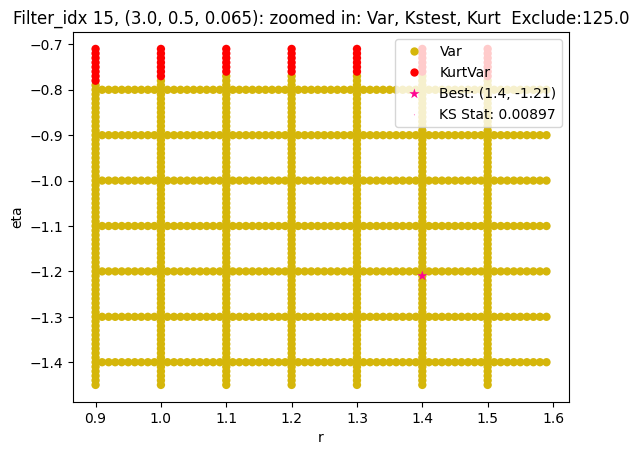

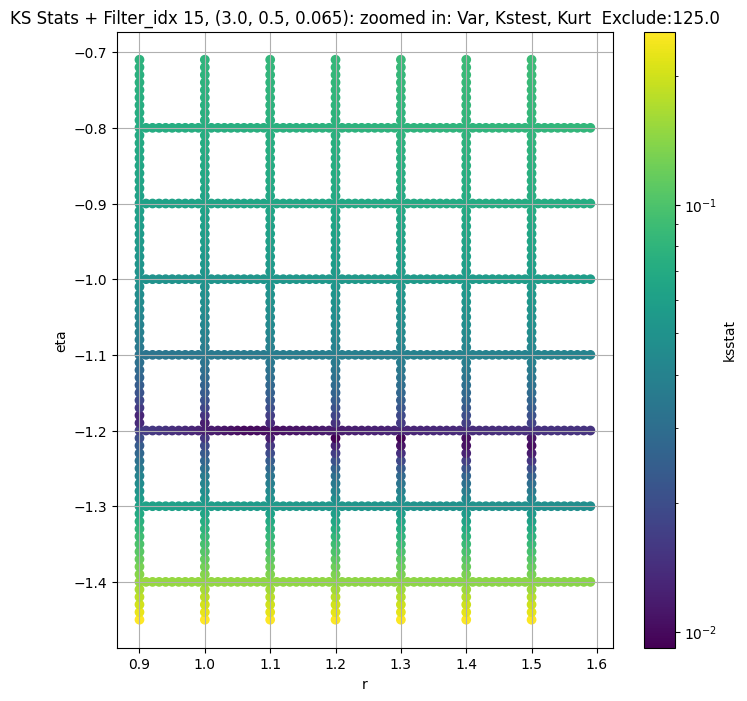

Filter_idx 16, (3.0, 0.5, 0.096):


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 16, 100.0 + 100 = 200, ksstat: 0.009268841304068853, var: 13.551835060119629


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 16, 100.0 + 75 = 175, ksstat: 0.009660572019479008, var: 13.786531448364258


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 16, 100.0 + 50 = 150, ksstat: 0.009519321379886758, var: 14.040712356567383


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 16, 100.0 + 25 = 125, ksstat: 0.009021838823294465, var: 14.3191499710083


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 16, 100.0 + 0 = 100, ksstat: 0.008667184500070813, var: 14.628785133361816


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 16, 100.0 + -25 = 75, ksstat: 0.009217744989392151, var: 14.981419563293457


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 16, 100.0 + -50 = 50, ksstat: 0.009274233238593443, var: 15.398828506469727


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 16, 100.0 + -75 = 25, ksstat: 0.00964328961540506, var: 15.933484077453613


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 16, 100.0 + -100 = 0, ksstat: 0.008722743510783892, var: 17.2043514251709
Number of samples: 100000, Without approximation : 160000000.0


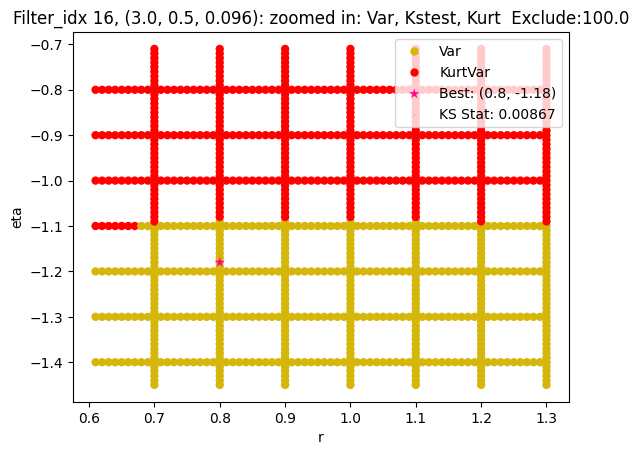

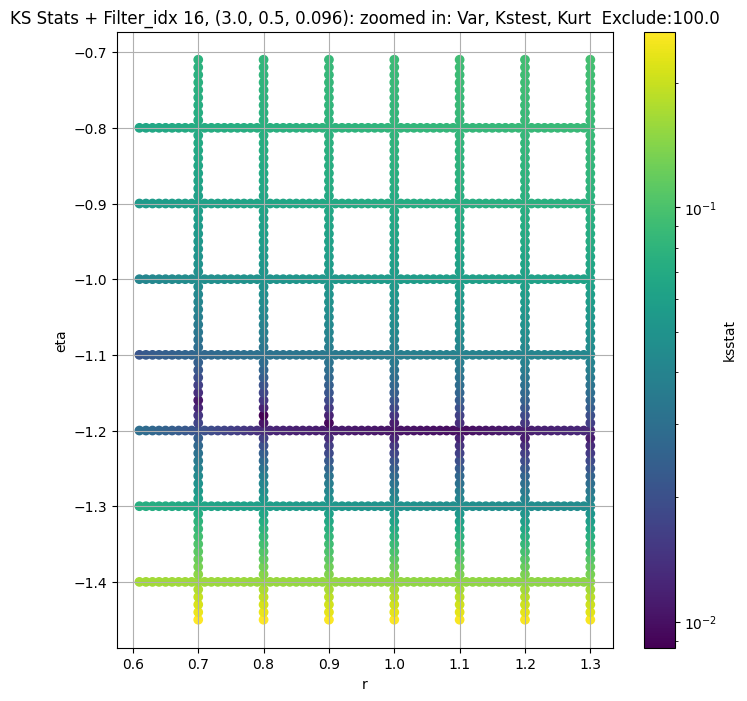

Filter_idx 17, (3.0, 0.5, 0.141):


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 17, 0.0 + 100 = 100, ksstat: 0.007957712742416523, var: 5.586892604827881


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 17, 0.0 + 75 = 75, ksstat: 0.00804717907149799, var: 5.736001968383789


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 17, 0.0 + 50 = 50, ksstat: 0.007717047918702313, var: 5.9146246910095215


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 17, 0.0 + 25 = 25, ksstat: 0.007975078995061669, var: 6.147827625274658


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 17, 0.0 + 0 = 0, ksstat: 0.008304332158192235, var: 6.772909164428711
Number of samples: 100000, Without approximation : 160000000.0


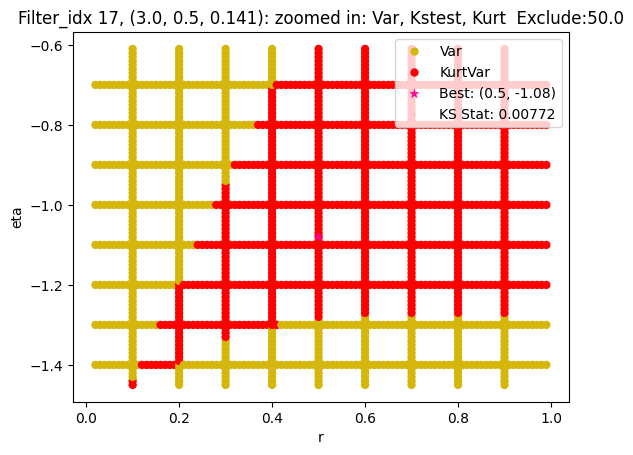

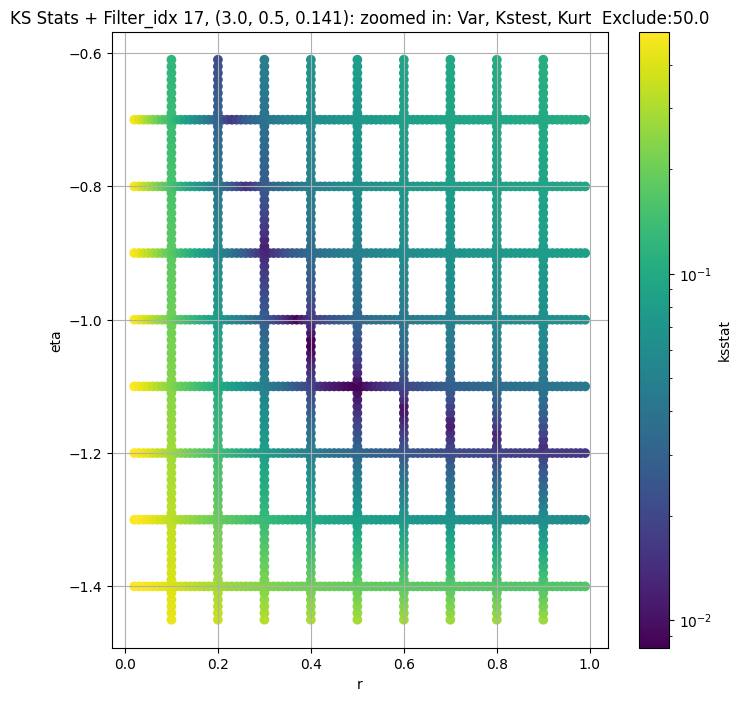

Filter_idx 18, (3.0, 0.5, 0.208):


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 50.0 + 100 = 150, ksstat: 0.008008244438202583, var: 1.9725019931793213


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 50.0 + 75 = 125, ksstat: 0.008095294022837596, var: 2.019912004470825


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 50.0 + 50 = 100, ksstat: 0.0077638290368233775, var: 2.073529005050659


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 50.0 + 25 = 75, ksstat: 0.007591365144350992, var: 2.135819435119629


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 50.0 + 0 = 50, ksstat: 0.00784810529946689, var: 2.2114675045013428


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 50.0 + -25 = 25, ksstat: 0.007215158777974295, var: 2.312011241912842


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 18, 50.0 + -50 = 0, ksstat: 0.006260912780873262, var: 2.608004331588745
Number of samples: 100000, Without approximation : 160000000.0


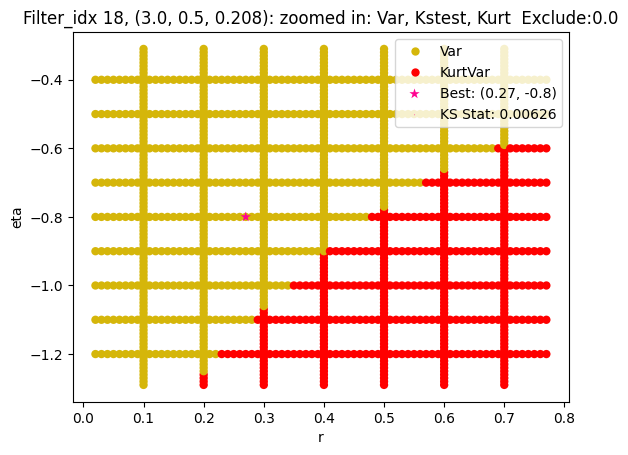

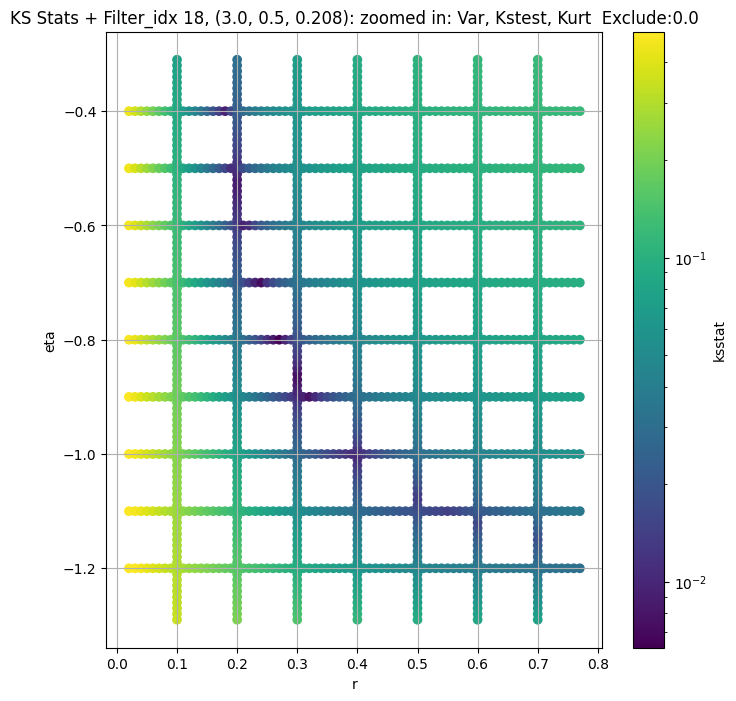

Filter_idx 19, (3.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 0.0 + 100 = 100, ksstat: 0.006957441696110123, var: 0.5796757340431213


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 0.0 + 75 = 75, ksstat: 0.0062269265707523, var: 0.5976675152778625


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 0.0 + 50 = 50, ksstat: 0.005915180124427155, var: 0.6196867823600769


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 0.0 + 25 = 25, ksstat: 0.005122744900786125, var: 0.6493195295333862


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 0.0 + 0 = 0, ksstat: 0.003665383144612455, var: 0.7580035328865051
Number of samples: 100000, Without approximation : 160000000.0


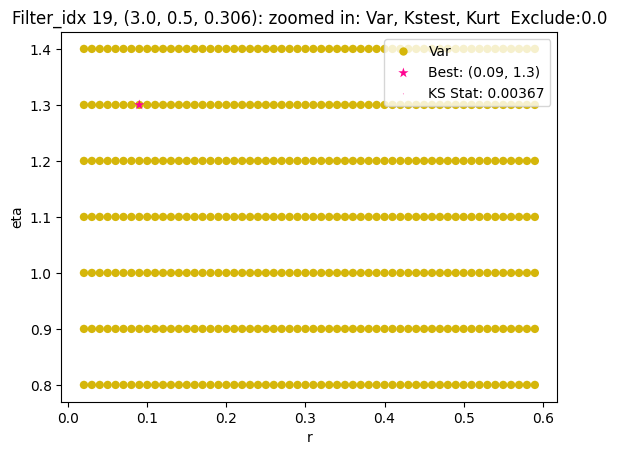

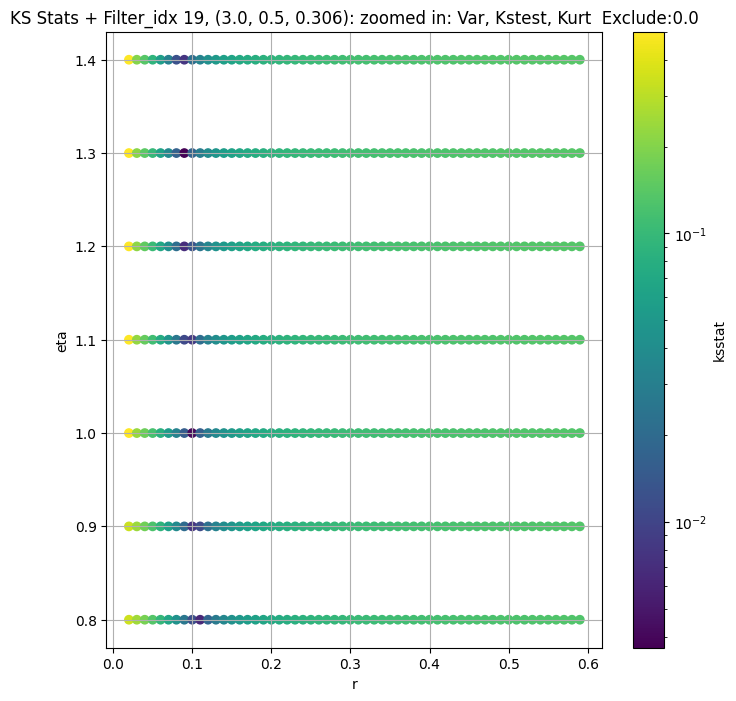

Filter_idx 20, (3.0, 0.5, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 50.0 + 100 = 150, ksstat: 0.004993753722289496, var: 0.21817906200885773


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 50.0 + 75 = 125, ksstat: 0.0042690146663469375, var: 0.22343100607395172


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 50.0 + 50 = 100, ksstat: 0.0034791239357986337, var: 0.22946971654891968


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 50.0 + 25 = 75, ksstat: 0.0028669778249738043, var: 0.23665137588977814


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 50.0 + 0 = 50, ksstat: 0.0022400739904543387, var: 0.24568498134613037


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 50.0 + -25 = 25, ksstat: 0.002110585036788626, var: 0.25846508145332336


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 50.0 + -50 = 0, ksstat: 0.005684029951591785, var: 0.3305133581161499
Number of samples: 100000, Without approximation : 160000000.0


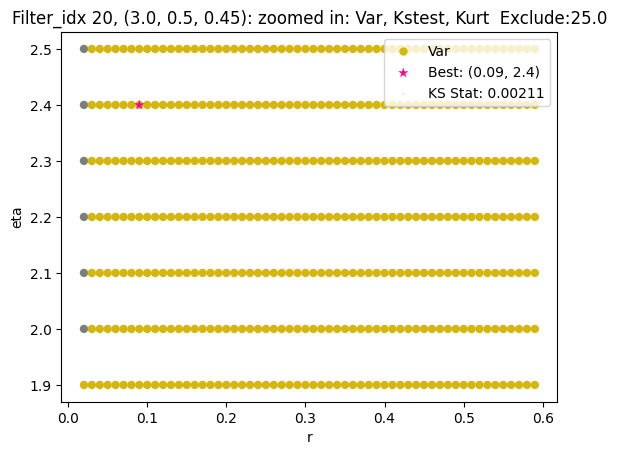

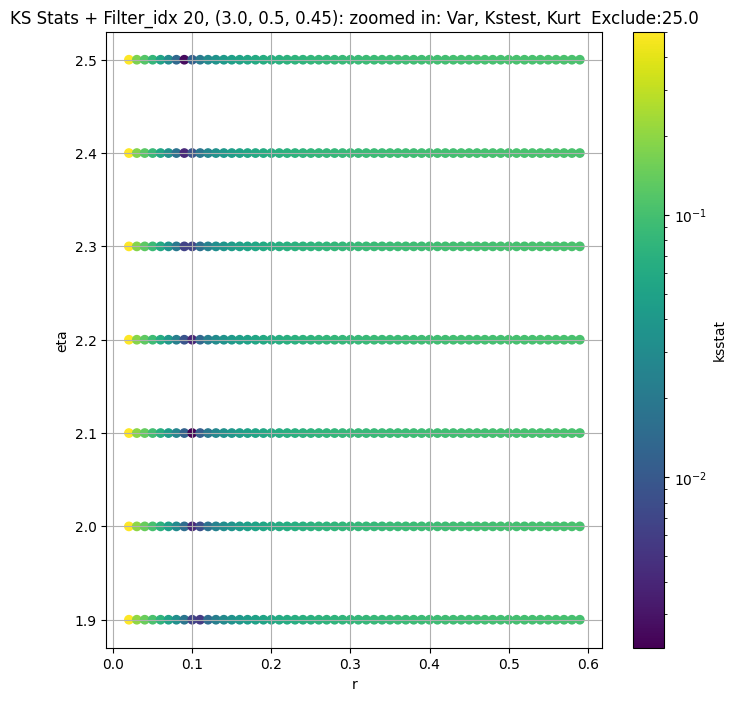

Filter_idx 21, (3.0, 1.0, 0.044):


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 21, 100.0 + 100 = 200, ksstat: 0.0061784243945822714, var: 89.5193099975586


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 21, 100.0 + 75 = 175, ksstat: 0.006421671647867666, var: 90.8495101928711


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 21, 100.0 + 50 = 150, ksstat: 0.006680010959981497, var: 92.28662872314453


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 21, 100.0 + 25 = 125, ksstat: 0.006934855815006191, var: 93.85601043701172


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 21, 100.0 + 0 = 100, ksstat: 0.006629439000039664, var: 95.59925079345703


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 21, 100.0 + -25 = 75, ksstat: 0.007342683179737408, var: 97.58702087402344


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 21, 100.0 + -50 = 50, ksstat: 0.008555194080323236, var: 99.9544677734375


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 21, 100.0 + -75 = 25, ksstat: 0.010396711840261585, var: 103.04660034179688


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 21, 100.0 + -100 = 0, ksstat: 0.013113409917910657, var: 110.84922790527344
Number of samples: 100000, Without approximation : 160000000.0


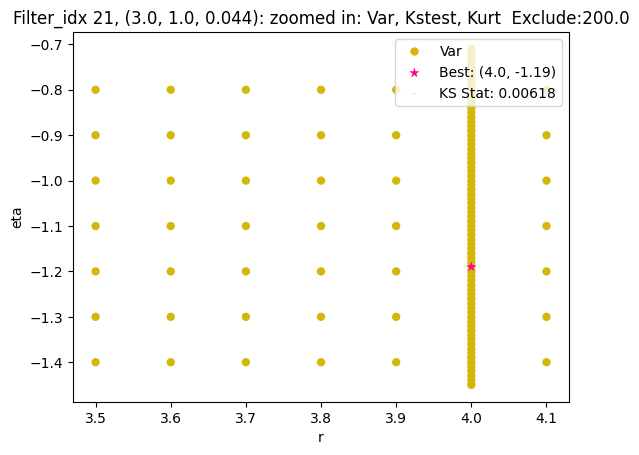

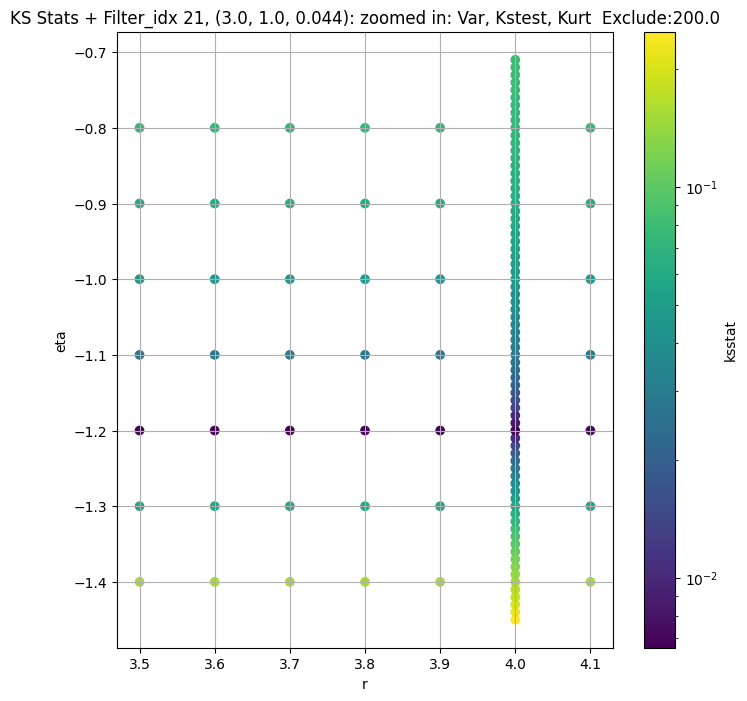

Filter_idx 22, (3.0, 1.0, 0.065):


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 200.0 + 100 = 300, ksstat: 0.00719935450486664, var: 34.1201057434082


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 200.0 + 75 = 275, ksstat: 0.007139074059959172, var: 34.530853271484375


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 200.0 + 50 = 250, ksstat: 0.007077646062262022, var: 34.962154388427734


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 200.0 + 25 = 225, ksstat: 0.00701397433980383, var: 35.416908264160156


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 200.0 + 0 = 200, ksstat: 0.00694770685802093, var: 35.898651123046875


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 200.0 + -25 = 175, ksstat: 0.007329212292216392, var: 36.412200927734375


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 200.0 + -50 = 150, ksstat: 0.008297321745656672, var: 36.964176177978516


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 200.0 + -75 = 125, ksstat: 0.009332517753157132, var: 37.5637092590332


  0%|          | 0/42 [00:00<?, ?it/s]

Finding Minimum after computing 42 CDFs
filter_idx 22, 200.0 + -100 = 100, ksstat: 0.010453365665933467, var: 38.22389602661133
Number of samples: 100000, Without approximation : 160000000.0


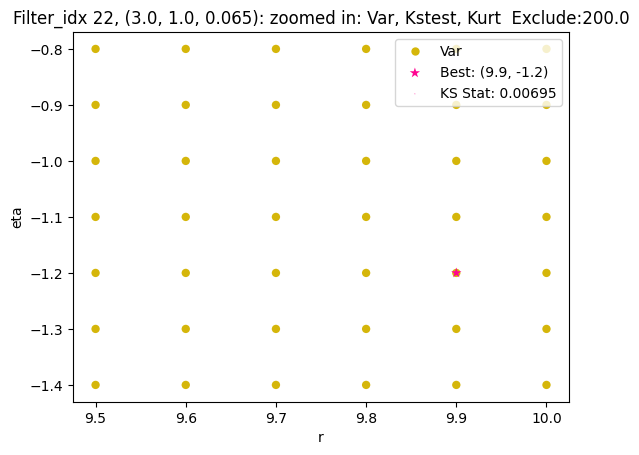

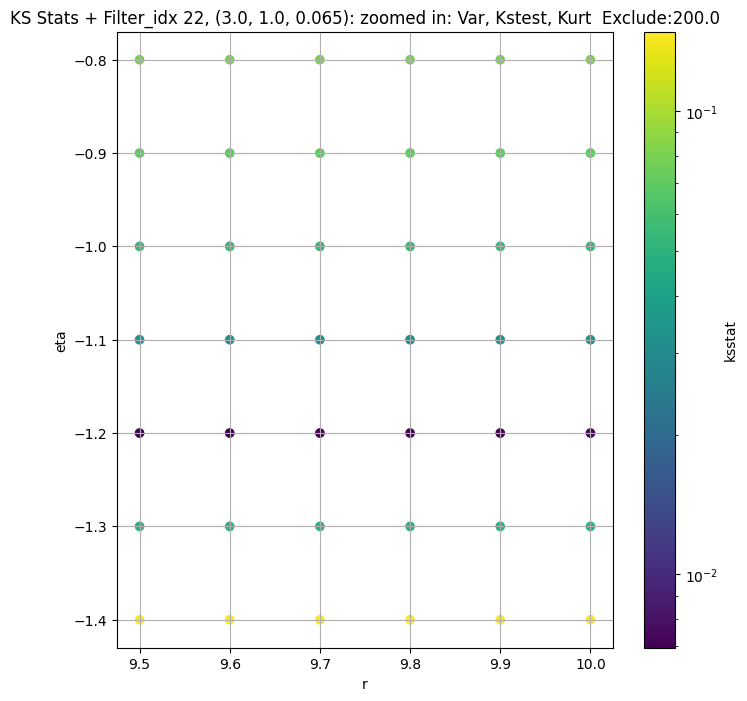

Filter_idx 23, (3.0, 1.0, 0.096):


  0%|          | 0/587 [00:00<?, ?it/s]

Finding Minimum after computing 587 CDFs
filter_idx 23, 200.0 + 100 = 300, ksstat: 0.008907011349181482, var: 15.387503623962402


  0%|          | 0/587 [00:00<?, ?it/s]

Finding Minimum after computing 587 CDFs
filter_idx 23, 200.0 + 75 = 275, ksstat: 0.008882071700907046, var: 15.600247383117676


  0%|          | 0/587 [00:00<?, ?it/s]

Finding Minimum after computing 587 CDFs
filter_idx 23, 200.0 + 50 = 250, ksstat: 0.008860873638069422, var: 15.824630737304688


  0%|          | 0/587 [00:00<?, ?it/s]

Finding Minimum after computing 587 CDFs
filter_idx 23, 200.0 + 25 = 225, ksstat: 0.008868308502335609, var: 16.062339782714844


  0%|          | 0/587 [00:00<?, ?it/s]

Finding Minimum after computing 587 CDFs
filter_idx 23, 200.0 + 0 = 200, ksstat: 0.008928852120894504, var: 16.315397262573242


  0%|          | 0/587 [00:00<?, ?it/s]

Finding Minimum after computing 587 CDFs
filter_idx 23, 200.0 + -25 = 175, ksstat: 0.008858946593813144, var: 16.586559295654297


  0%|          | 0/587 [00:00<?, ?it/s]

Finding Minimum after computing 587 CDFs
filter_idx 23, 200.0 + -50 = 150, ksstat: 0.008878049983106262, var: 16.879369735717773


  0%|          | 0/587 [00:00<?, ?it/s]

Finding Minimum after computing 587 CDFs
filter_idx 23, 200.0 + -75 = 125, ksstat: 0.008910722075955169, var: 17.199159622192383


  0%|          | 0/587 [00:00<?, ?it/s]

Finding Minimum after computing 587 CDFs
filter_idx 23, 200.0 + -100 = 100, ksstat: 0.008959940464501881, var: 17.553552627563477
Number of samples: 100000, Without approximation : 160000000.0


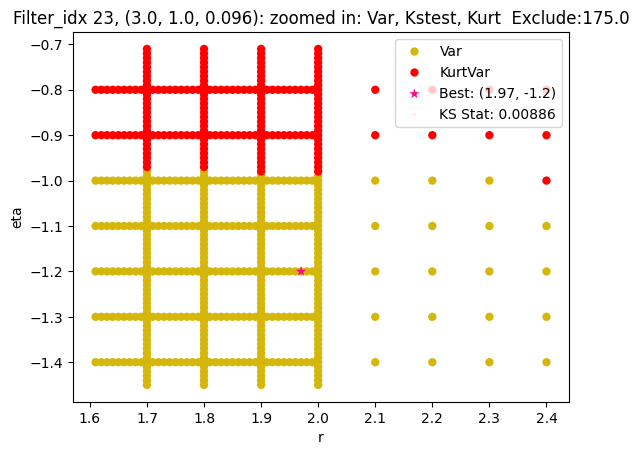

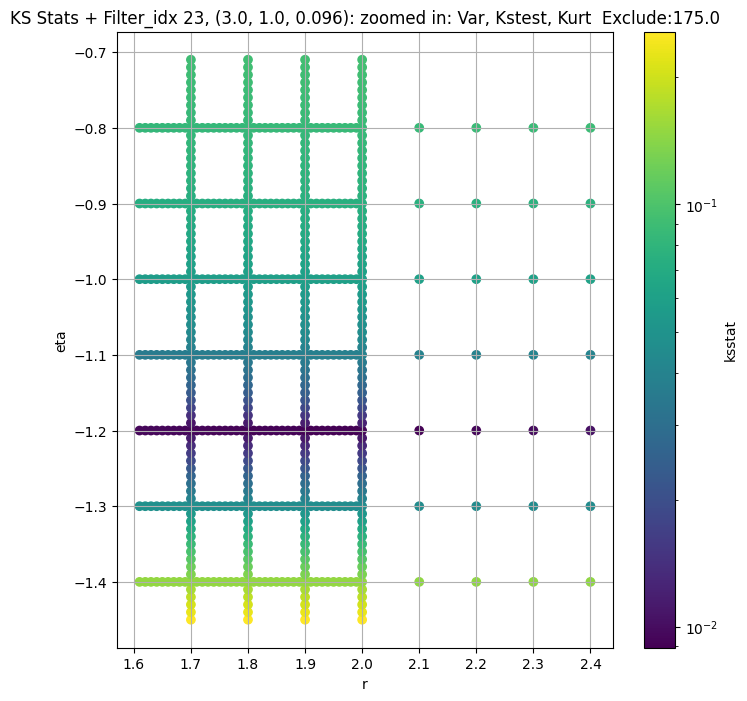

Filter_idx 24, (3.0, 1.0, 0.141):


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 24, 50.0 + 100 = 150, ksstat: 0.00835689080203117, var: 6.578923225402832


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 24, 50.0 + 75 = 125, ksstat: 0.008068727867145853, var: 6.725584030151367


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 24, 50.0 + 50 = 100, ksstat: 0.007850264011353691, var: 6.8899688720703125


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 24, 50.0 + 25 = 75, ksstat: 0.007814594277733955, var: 7.078873157501221


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 24, 50.0 + 0 = 50, ksstat: 0.007687732519046642, var: 7.305044651031494


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 24, 50.0 + -25 = 25, ksstat: 0.007792066500435069, var: 7.59976863861084


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 24, 50.0 + -50 = 0, ksstat: 0.008137062765666947, var: 8.390480041503906
Number of samples: 100000, Without approximation : 160000000.0


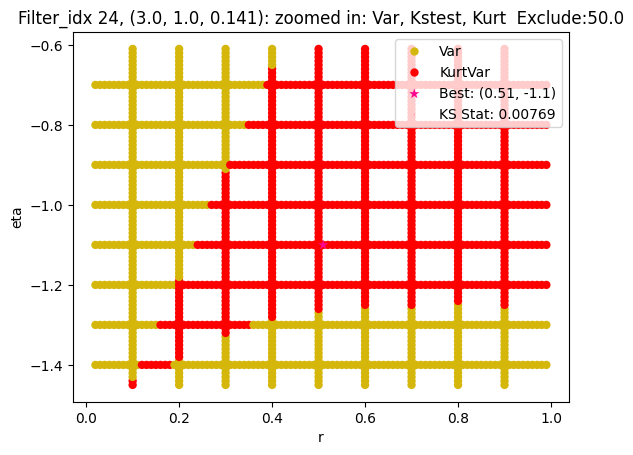

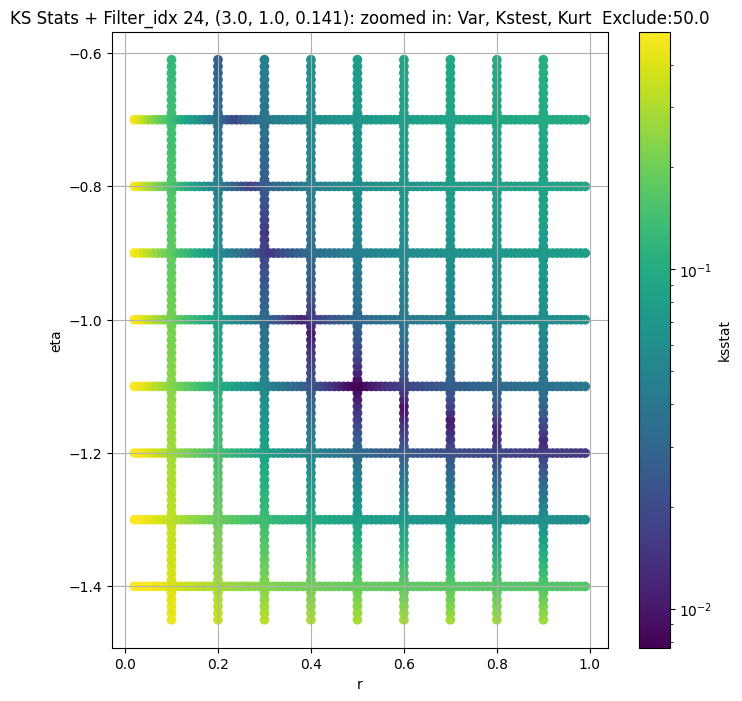

Filter_idx 25, (3.0, 1.0, 0.208):


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 25, 0.0 + 100 = 100, ksstat: 0.008025925988950924, var: 2.3995745182037354


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 25, 0.0 + 75 = 75, ksstat: 0.008020839978395644, var: 2.470656633377075


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 25, 0.0 + 50 = 50, ksstat: 0.007394804739442096, var: 2.5564887523651123


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 25, 0.0 + 25 = 25, ksstat: 0.006690652644919748, var: 2.6698710918426514


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 25, 0.0 + 0 = 0, ksstat: 0.0068816363898801525, var: 3.0158486366271973
Number of samples: 100000, Without approximation : 160000000.0


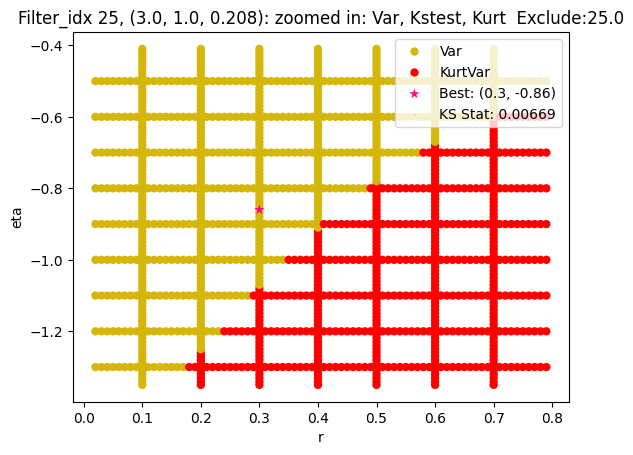

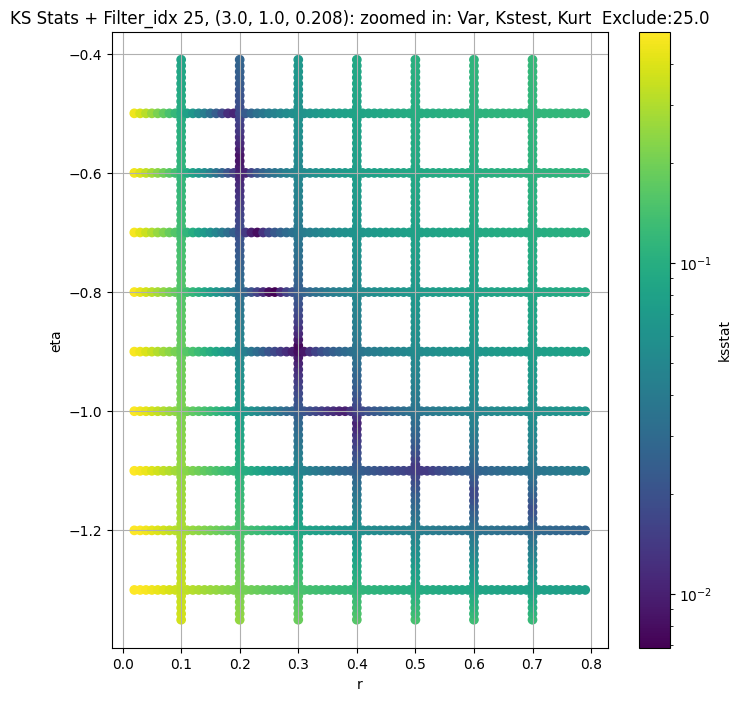

Filter_idx 26, (3.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 0.0 + 100 = 100, ksstat: 0.0065097292440357, var: 0.8509559035301208


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 0.0 + 75 = 75, ksstat: 0.006250779984251623, var: 0.8794472217559814


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 0.0 + 50 = 50, ksstat: 0.0061528997295281496, var: 0.9143977761268616


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 0.0 + 25 = 25, ksstat: 0.004548057783925863, var: 0.9615307450294495


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 0.0 + 0 = 0, ksstat: 0.003705984600925305, var: 1.0902602672576904
Number of samples: 100000, Without approximation : 160000000.0


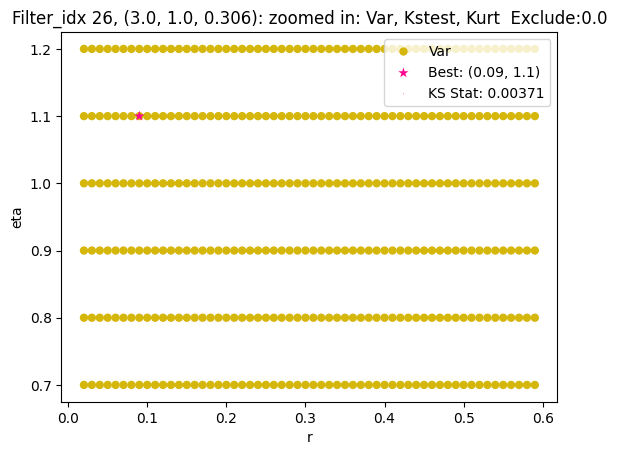

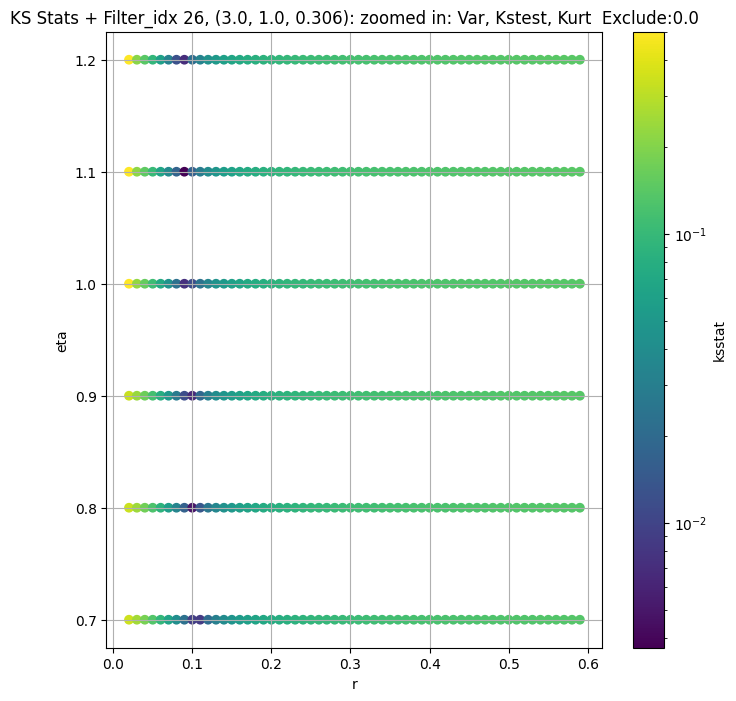

Filter_idx 27, (3.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + 100 = 150, ksstat: 0.005018380215028206, var: 0.2276402711868286


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + 75 = 125, ksstat: 0.004317042136533292, var: 0.23309187591075897


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + 50 = 100, ksstat: 0.0036521219599165017, var: 0.2393587976694107


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + 25 = 75, ksstat: 0.003055318788190986, var: 0.24680815637111664


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + 0 = 50, ksstat: 0.002296503159864627, var: 0.2561713755130768


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + -25 = 25, ksstat: 0.0016932537673139958, var: 0.2693934738636017


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 50.0 + -50 = 0, ksstat: 0.006333283254770783, var: 0.35595542192459106
Number of samples: 100000, Without approximation : 160000000.0


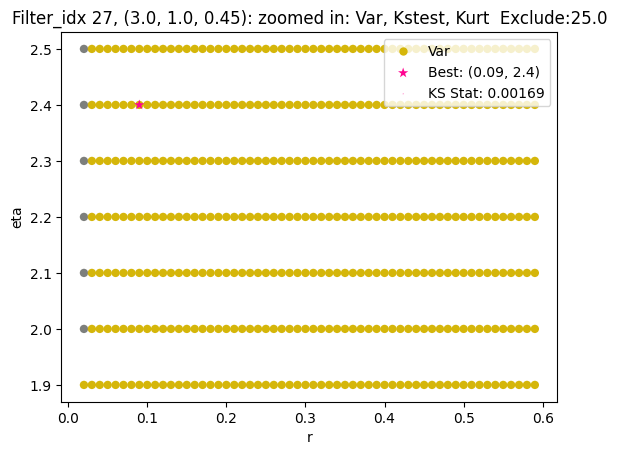

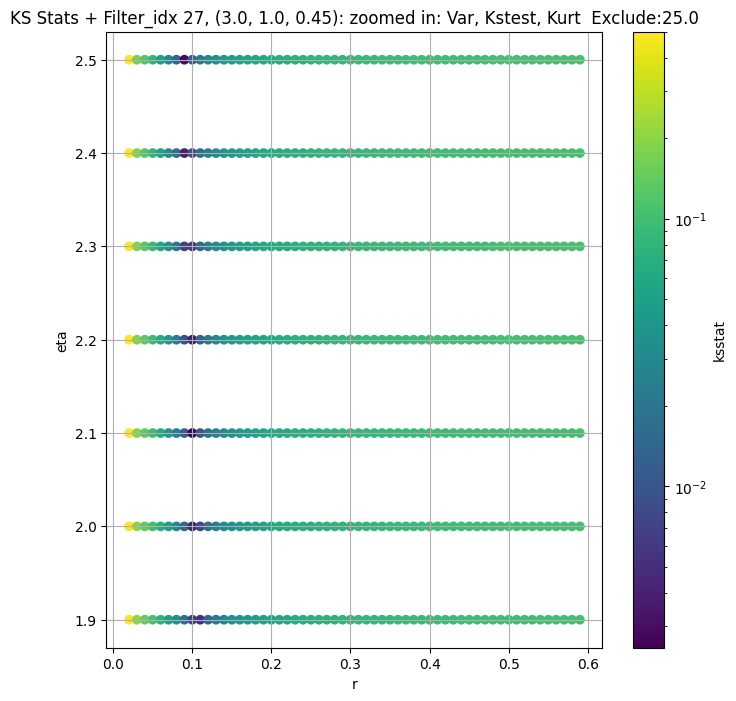

Filter_idx 28, (4.0, 0.5, 0.044):


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 28, 0.0 + 100 = 100, ksstat: 0.007368853917747664, var: 79.15648651123047


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 28, 0.0 + 75 = 75, ksstat: 0.006661304151309819, var: 80.55265808105469


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 28, 0.0 + 50 = 50, ksstat: 0.00793492860546896, var: 82.17091369628906


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 28, 0.0 + 25 = 25, ksstat: 0.008476996752158739, var: 84.1908187866211


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 28, 0.0 + 0 = 0, ksstat: 0.01035188093283651, var: 88.33709716796875
Number of samples: 100000, Without approximation : 160000000.0


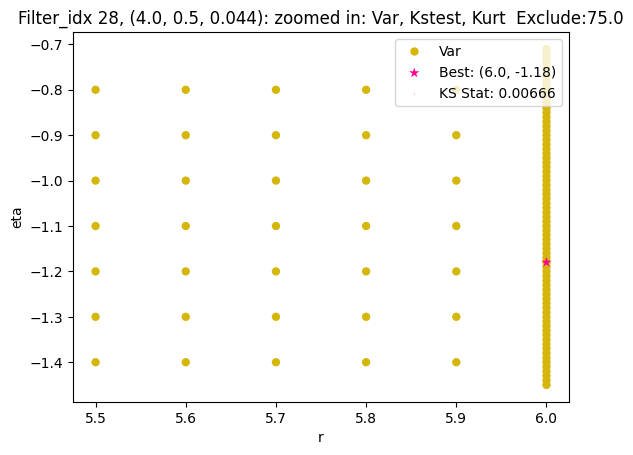

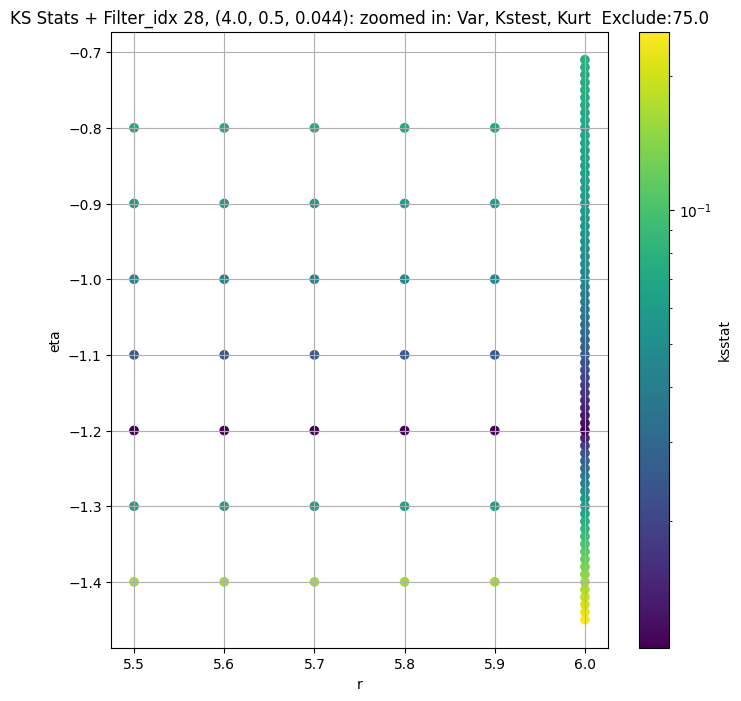

Filter_idx 29, (4.0, 0.5, 0.065):


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + 100 = 200, ksstat: 0.006707814354915076, var: 30.212444305419922


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + 75 = 175, ksstat: 0.0066365478489198715, var: 30.662107467651367


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + 50 = 150, ksstat: 0.0066828965906891025, var: 31.147708892822266


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + 25 = 125, ksstat: 0.007618439142539402, var: 31.67796516418457


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + 0 = 100, ksstat: 0.0075506016742433735, var: 32.266868591308594


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + -25 = 75, ksstat: 0.008536743434334082, var: 32.93693161010742


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + -50 = 50, ksstat: 0.009410260059254272, var: 33.73097229003906


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + -75 = 25, ksstat: 0.011132060066388033, var: 34.7532958984375


  0%|          | 0/131 [00:00<?, ?it/s]

Finding Minimum after computing 131 CDFs
filter_idx 29, 100.0 + -100 = 0, ksstat: 0.01297589561688528, var: 37.17838668823242
Number of samples: 100000, Without approximation : 160000000.0


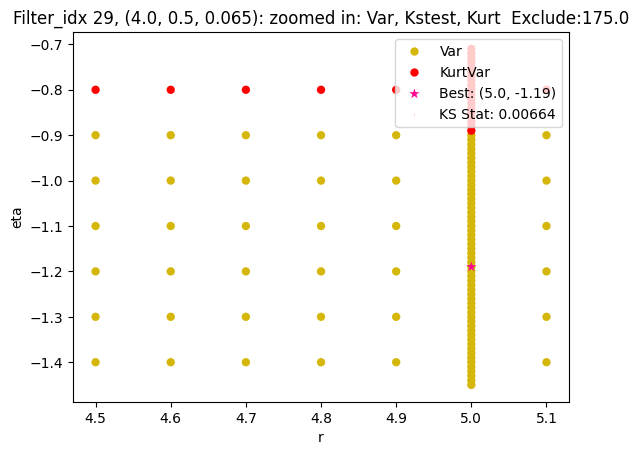

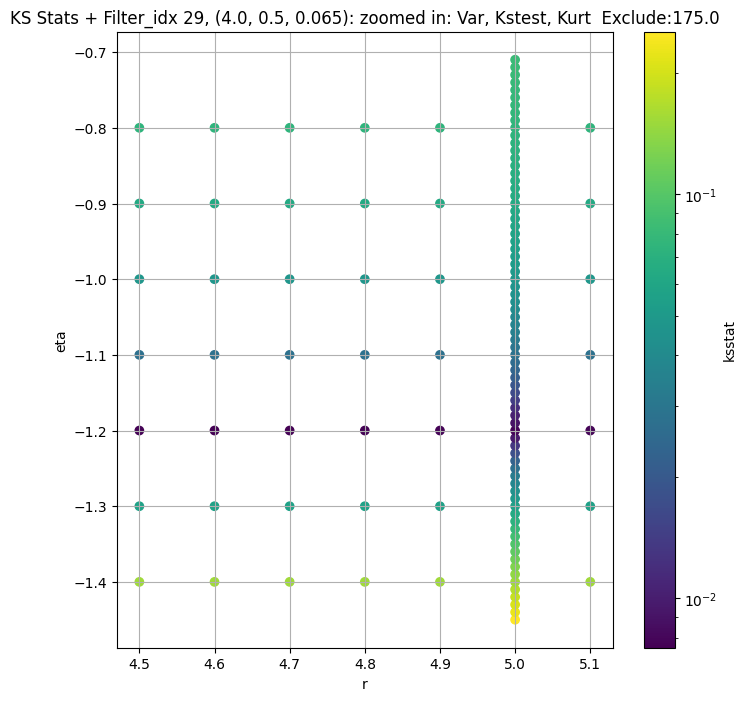

Filter_idx 30, (4.0, 0.5, 0.096):


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 30, 50.0 + 100 = 150, ksstat: 0.009578064870793379, var: 13.031105995178223


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 30, 50.0 + 75 = 125, ksstat: 0.00944368246203875, var: 13.278641700744629


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 30, 50.0 + 50 = 100, ksstat: 0.00933816299296586, var: 13.553628921508789


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 30, 50.0 + 25 = 75, ksstat: 0.009221276932551037, var: 13.866564750671387


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 30, 50.0 + 0 = 50, ksstat: 0.009740057943651237, var: 14.23675537109375


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 30, 50.0 + -25 = 25, ksstat: 0.008949734840514756, var: 14.713249206542969


  0%|          | 0/1305 [00:00<?, ?it/s]

Finding Minimum after computing 1305 CDFs
filter_idx 30, 50.0 + -50 = 0, ksstat: 0.009875121876686599, var: 15.869440078735352
Number of samples: 100000, Without approximation : 160000000.0


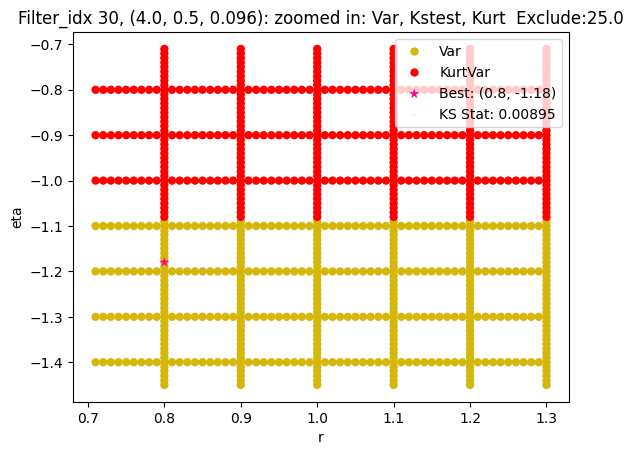

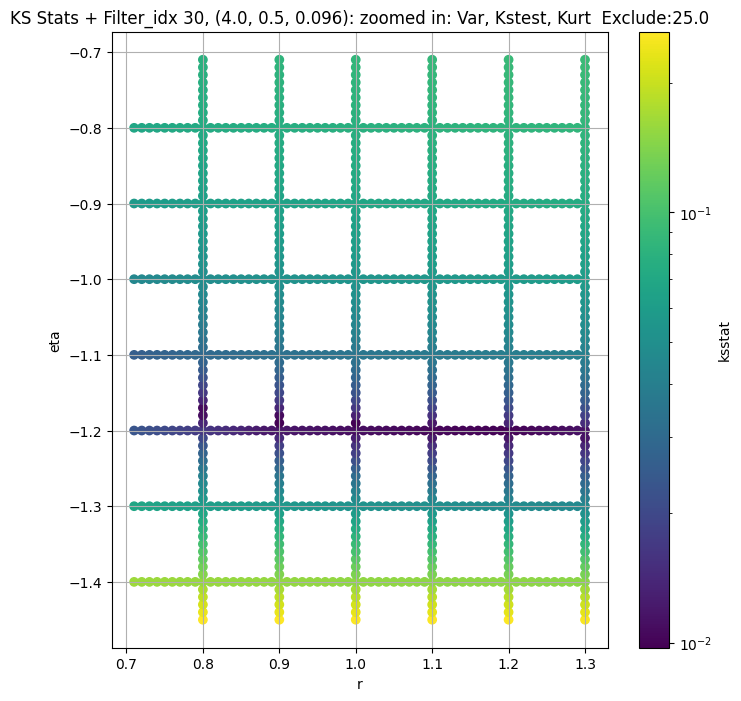

Filter_idx 31, (4.0, 0.5, 0.141):


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + 100 = 200, ksstat: 0.00840790733335861, var: 4.971417427062988


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + 75 = 175, ksstat: 0.00824163962380775, var: 5.059839248657227


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + 50 = 150, ksstat: 0.00827848883741844, var: 5.155830383300781


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + 25 = 125, ksstat: 0.007915104071211043, var: 5.261178970336914


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + 0 = 100, ksstat: 0.007812975952579793, var: 5.37865686416626


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + -25 = 75, ksstat: 0.0076189957029015876, var: 5.5127129554748535


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + -50 = 50, ksstat: 0.007659295065101601, var: 5.67155647277832


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + -75 = 25, ksstat: 0.007646537667239772, var: 5.875337600708008


  0%|          | 0/1485 [00:00<?, ?it/s]

Finding Minimum after computing 1485 CDFs
filter_idx 31, 100.0 + -100 = 0, ksstat: 0.00776758041808201, var: 6.385866165161133
Number of samples: 100000, Without approximation : 160000000.0


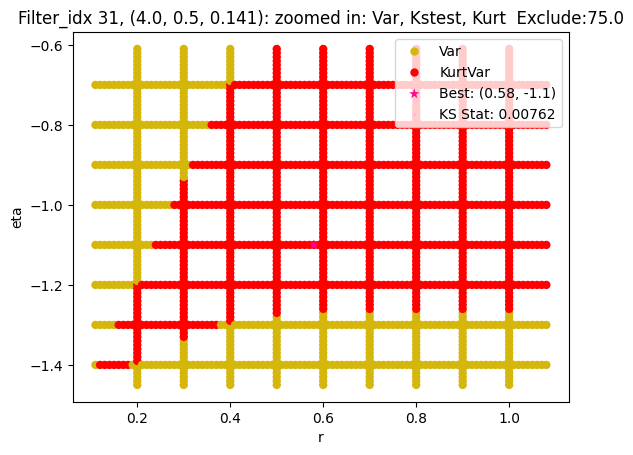

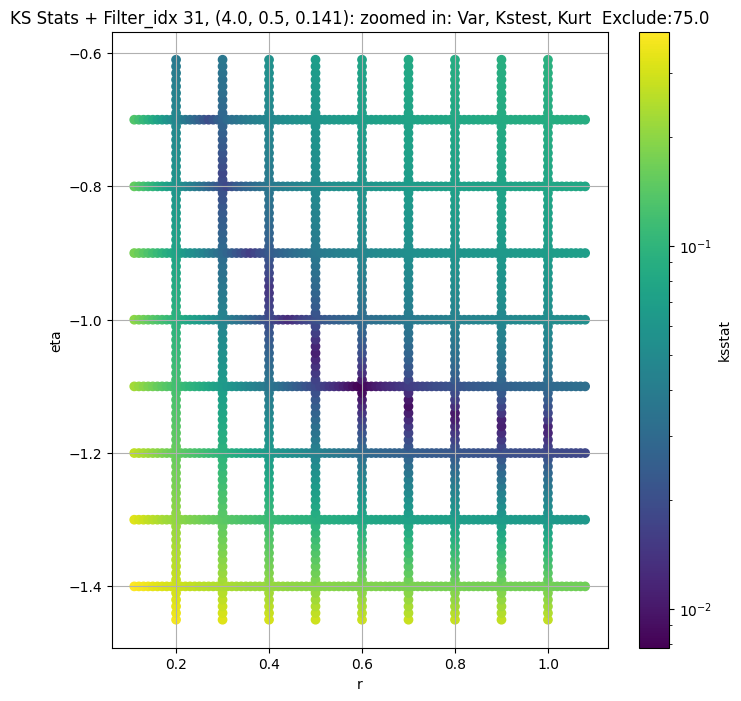

Filter_idx 32, (4.0, 0.5, 0.208):


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 32, 50.0 + 100 = 150, ksstat: 0.008354342360260003, var: 2.0196800231933594


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 32, 50.0 + 75 = 125, ksstat: 0.007734813977428923, var: 2.0668625831604004


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 32, 50.0 + 50 = 100, ksstat: 0.00783461766981186, var: 2.120076894760132


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 32, 50.0 + 25 = 75, ksstat: 0.007335318748399017, var: 2.1816909313201904


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 32, 50.0 + 0 = 50, ksstat: 0.0070173228699697, var: 2.2561752796173096


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 32, 50.0 + -25 = 25, ksstat: 0.007305986001825693, var: 2.35492205619812


  0%|          | 0/1332 [00:00<?, ?it/s]

Finding Minimum after computing 1332 CDFs
filter_idx 32, 50.0 + -50 = 0, ksstat: 0.0069253482131871325, var: 2.650970220565796
Number of samples: 100000, Without approximation : 160000000.0


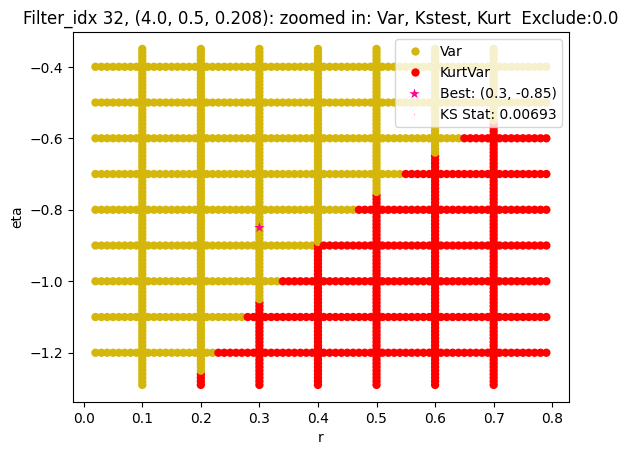

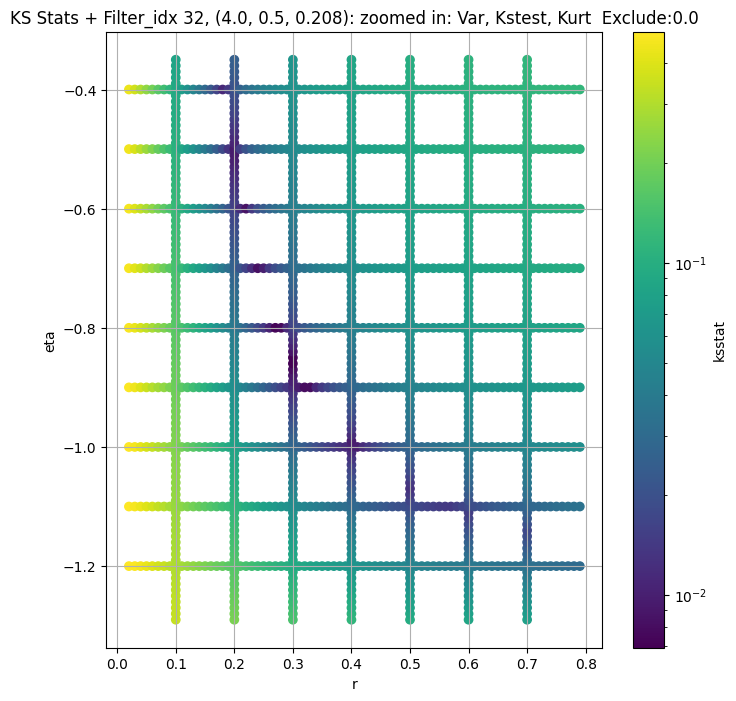

Filter_idx 33, (4.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 0.0 + 100 = 100, ksstat: 0.00631889623127746, var: 0.6249114274978638


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 0.0 + 75 = 75, ksstat: 0.0061079392217007755, var: 0.6450113654136658


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 0.0 + 50 = 50, ksstat: 0.0057033626441441165, var: 0.6698969006538391


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 0.0 + 25 = 25, ksstat: 0.004627492271419731, var: 0.7040224075317383


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 0.0 + 0 = 0, ksstat: 0.0034849543266158856, var: 0.8275294303894043
Number of samples: 100000, Without approximation : 160000000.0


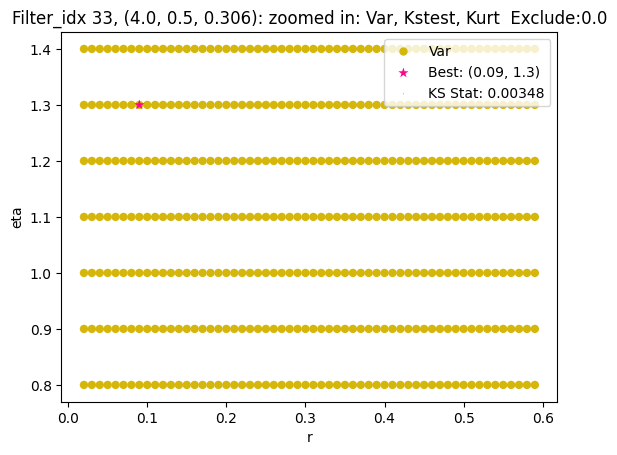

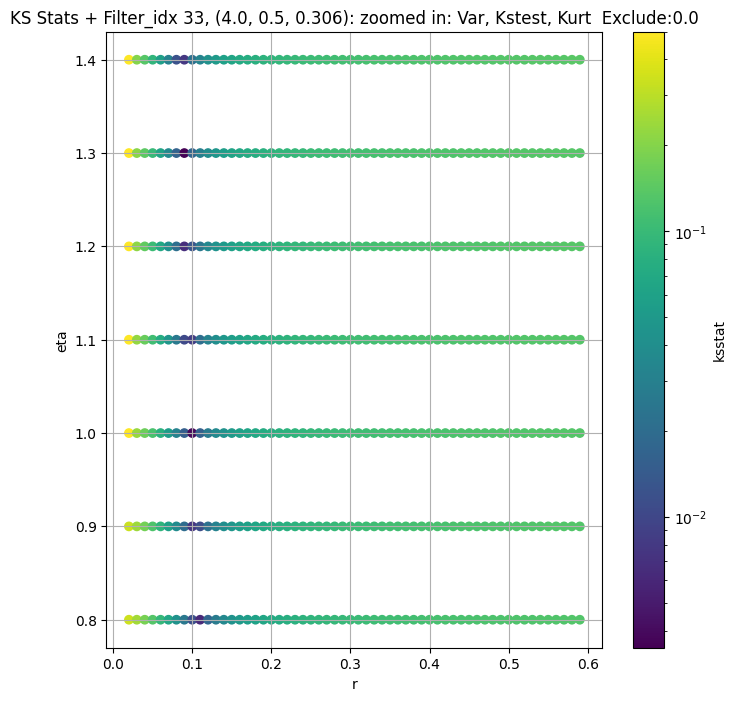

Filter_idx 34, (4.0, 0.5, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + 100 = 150, ksstat: 0.004802519528785298, var: 0.16392293572425842


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + 75 = 125, ksstat: 0.004198406152054468, var: 0.1673615425825119


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + 50 = 100, ksstat: 0.0038371515703858883, var: 0.17126871645450592


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + 25 = 75, ksstat: 0.003046043191045511, var: 0.1758439540863037


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + 0 = 50, ksstat: 0.002246722108521809, var: 0.18147967755794525


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + -25 = 25, ksstat: 0.0012993773510880102, var: 0.18921257555484772


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 34, 50.0 + -50 = 0, ksstat: 0.0033434888622865255, var: 0.21931684017181396
Number of samples: 100000, Without approximation : 160000000.0


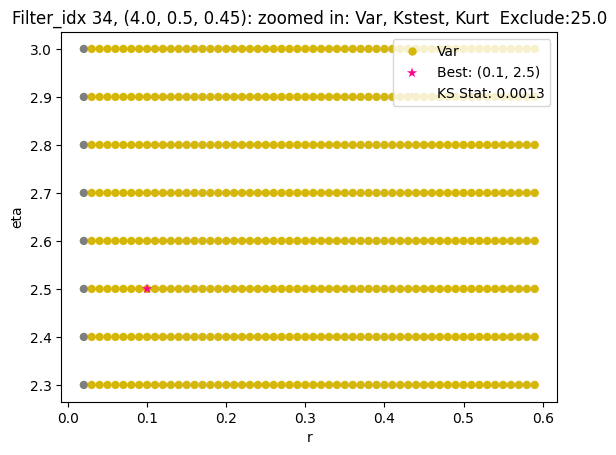

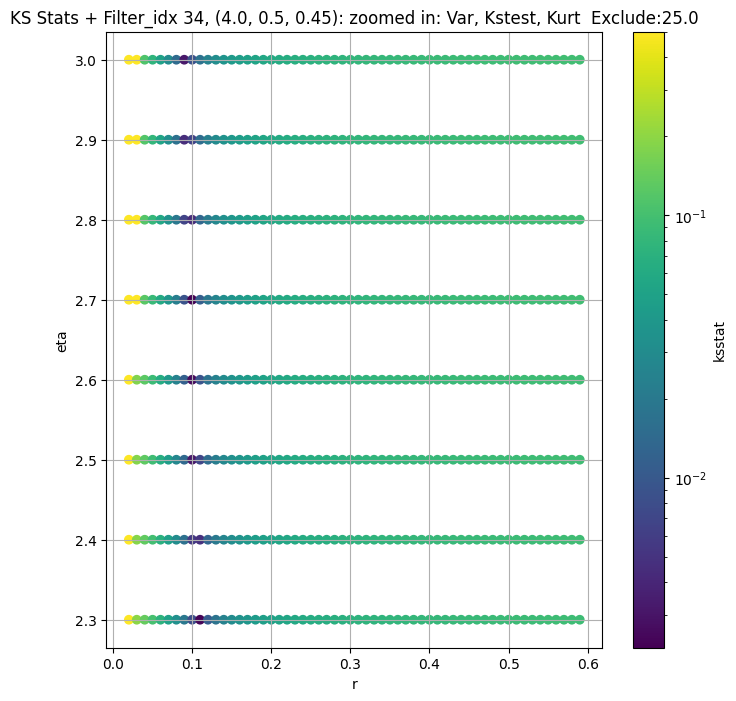

Filter_idx 35, (4.0, 1.0, 0.044):


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 35, 50.0 + 100 = 150, ksstat: 0.007813638363757092, var: 79.51078033447266


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 35, 50.0 + 75 = 125, ksstat: 0.007702342114020766, var: 80.7927017211914


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 35, 50.0 + 50 = 100, ksstat: 0.007538804458245174, var: 82.20661163330078


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 35, 50.0 + 25 = 75, ksstat: 0.0075050686199130134, var: 83.8011245727539


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 35, 50.0 + 0 = 50, ksstat: 0.007483662925622636, var: 85.66436767578125


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 35, 50.0 + -25 = 25, ksstat: 0.0074526099329548234, var: 88.0001220703125


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 35, 50.0 + -50 = 0, ksstat: 0.007377060916227474, var: 92.4797134399414
Number of samples: 100000, Without approximation : 160000000.0


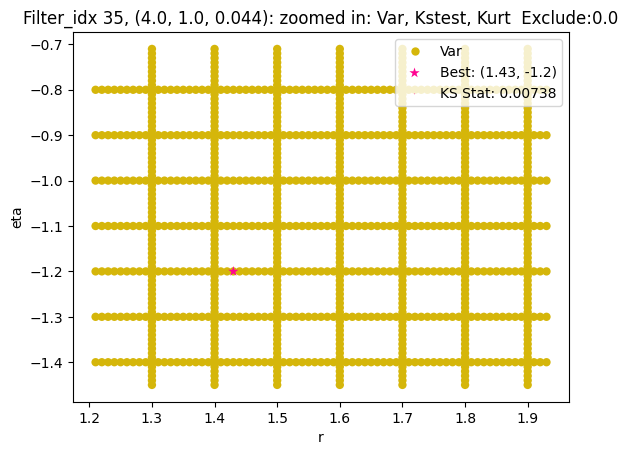

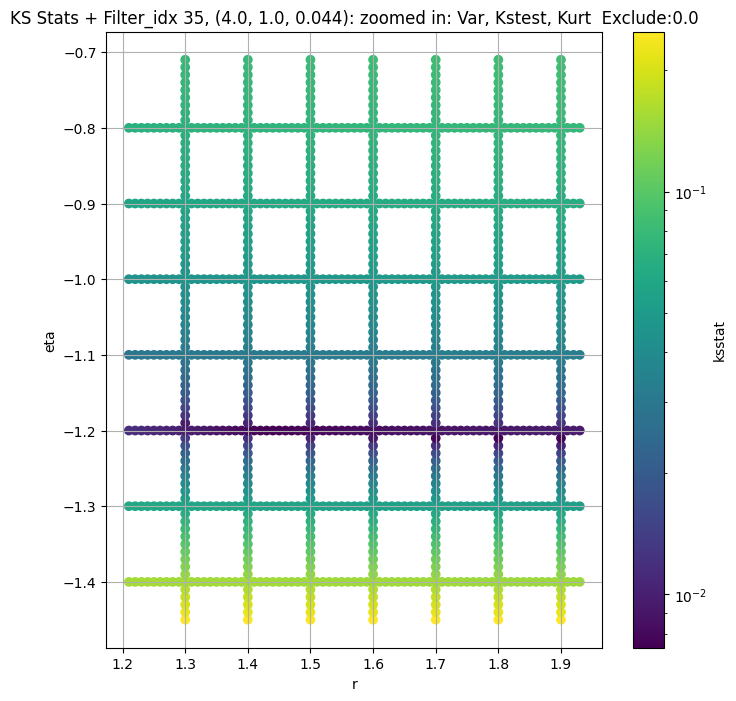

Filter_idx 36, (4.0, 1.0, 0.065):


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 36, 200.0 + 100 = 300, ksstat: 0.0073173117356004624, var: 28.674652099609375


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 36, 200.0 + 75 = 275, ksstat: 0.0073222241627201035, var: 29.040287017822266


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 36, 200.0 + 50 = 250, ksstat: 0.007322576144329851, var: 29.425369262695312


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 36, 200.0 + 25 = 225, ksstat: 0.007324435765091841, var: 29.832582473754883


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 36, 200.0 + 0 = 200, ksstat: 0.007324799336640098, var: 30.265472412109375


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 36, 200.0 + -25 = 175, ksstat: 0.007328198942884889, var: 30.728803634643555


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 36, 200.0 + -50 = 150, ksstat: 0.007334742241553394, var: 31.228857040405273


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 36, 200.0 + -75 = 125, ksstat: 0.00733846413146505, var: 31.774581909179688


  0%|          | 0/1111 [00:00<?, ?it/s]

Finding Minimum after computing 1111 CDFs
filter_idx 36, 200.0 + -100 = 100, ksstat: 0.007337552807007874, var: 32.380245208740234
Number of samples: 100000, Without approximation : 160000000.0


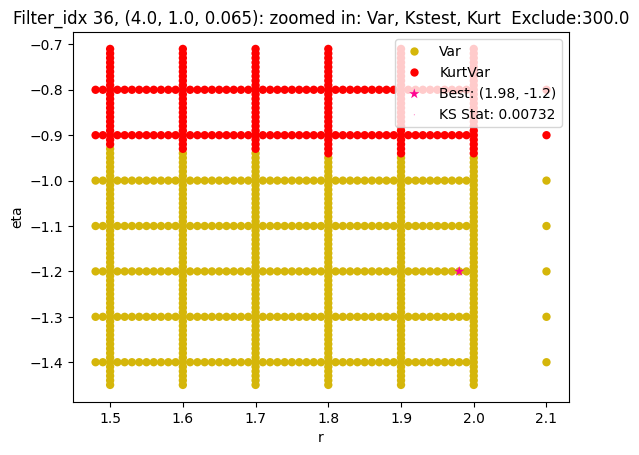

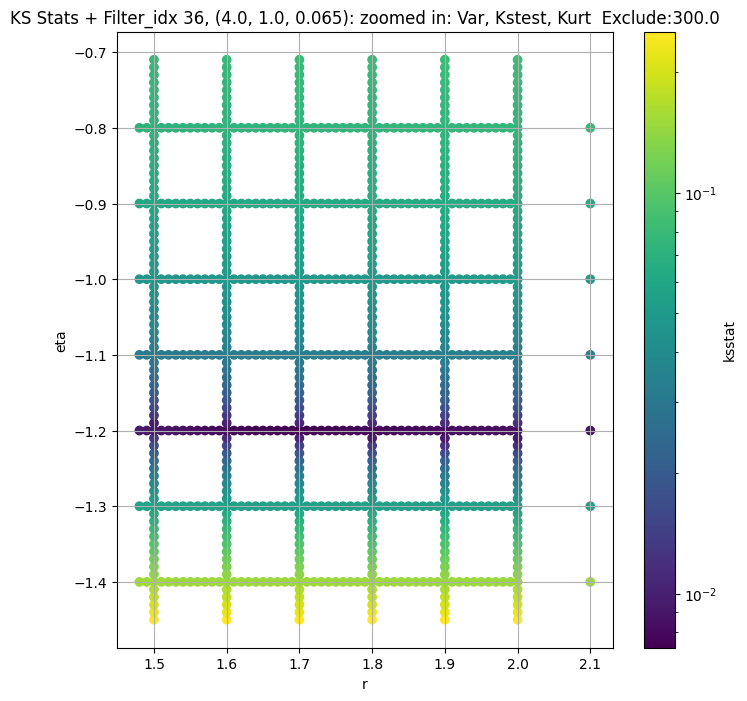

Filter_idx 37, (4.0, 1.0, 0.096):


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + 100 = 300, ksstat: 0.008727810090489563, var: 13.065200805664062


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + 75 = 275, ksstat: 0.00906763203319405, var: 13.250099182128906


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + 50 = 250, ksstat: 0.009019756387592115, var: 13.445415496826172


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + 25 = 225, ksstat: 0.00901792842689364, var: 13.6526460647583


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + 0 = 200, ksstat: 0.009033104887511745, var: 13.873772621154785


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + -25 = 175, ksstat: 0.009071777862851349, var: 14.111377716064453


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + -50 = 150, ksstat: 0.009154285880535018, var: 14.369036674499512


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + -75 = 125, ksstat: 0.009123730423581167, var: 14.651569366455078


  0%|          | 0/194 [00:00<?, ?it/s]

Finding Minimum after computing 194 CDFs
filter_idx 37, 200.0 + -100 = 100, ksstat: 0.010454439530443727, var: 14.966462135314941
Number of samples: 100000, Without approximation : 160000000.0


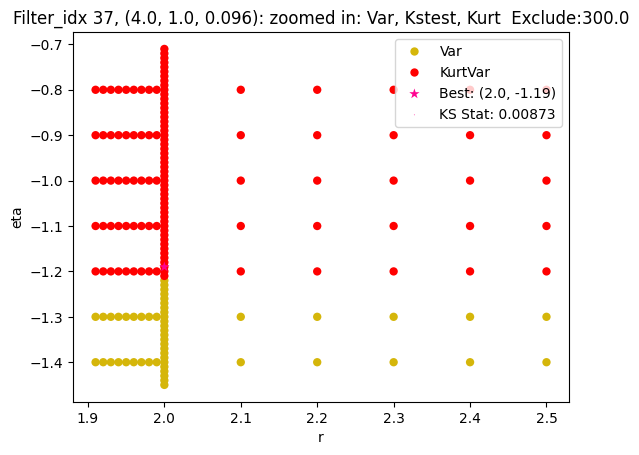

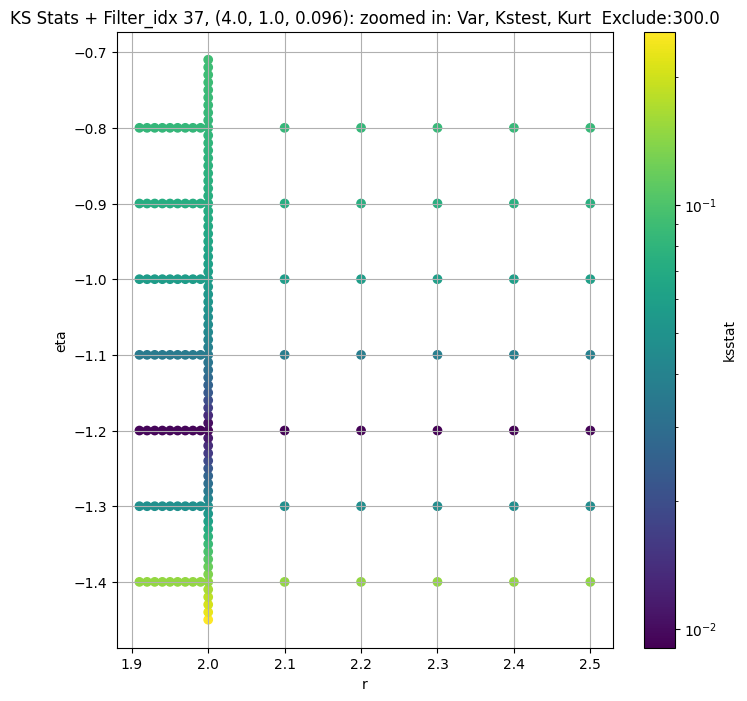

Filter_idx 38, (4.0, 1.0, 0.141):


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 38, 50.0 + 100 = 150, ksstat: 0.008645644168372685, var: 5.972678184509277


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 38, 50.0 + 75 = 125, ksstat: 0.008357907940810594, var: 6.1045966148376465


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 38, 50.0 + 50 = 100, ksstat: 0.008009534659192574, var: 6.252313613891602


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 38, 50.0 + 25 = 75, ksstat: 0.00805380435651526, var: 6.4220757484436035


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 38, 50.0 + 0 = 50, ksstat: 0.008155062172034544, var: 6.6257243156433105


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 38, 50.0 + -25 = 25, ksstat: 0.00819226691577496, var: 6.892583847045898


  0%|          | 0/1477 [00:00<?, ?it/s]

Finding Minimum after computing 1477 CDFs
filter_idx 38, 50.0 + -50 = 0, ksstat: 0.008120887332361937, var: 7.61391019821167
Number of samples: 100000, Without approximation : 160000000.0


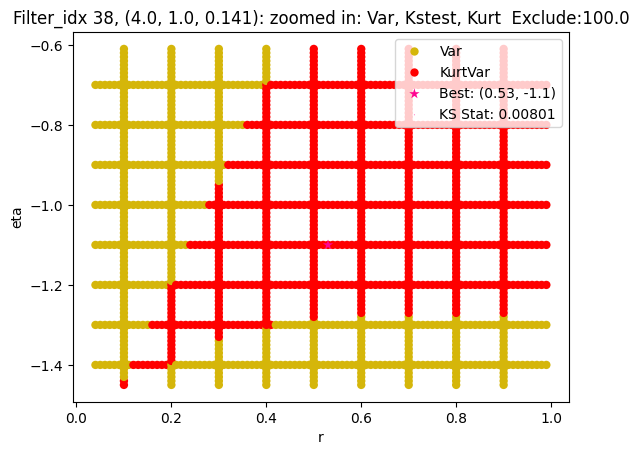

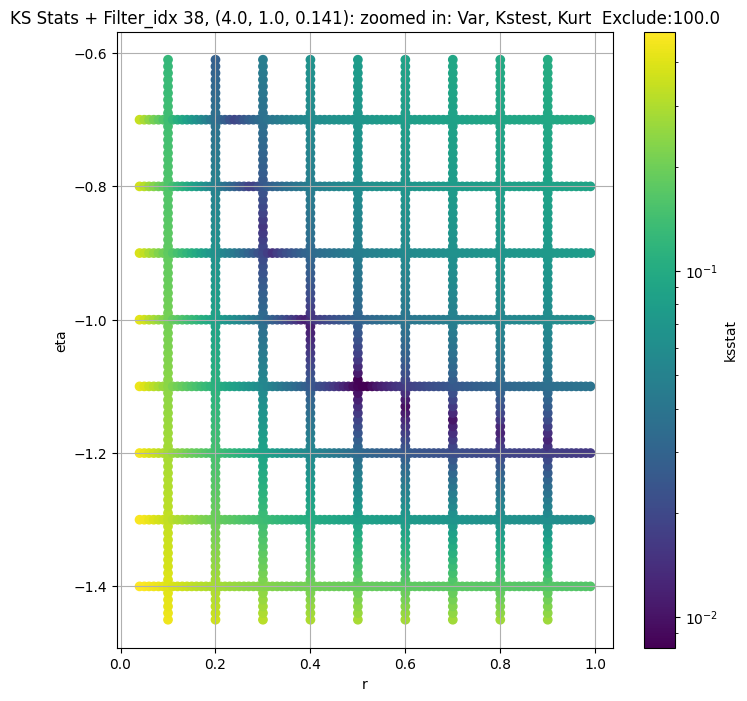

Filter_idx 39, (4.0, 1.0, 0.208):


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 39, 0.0 + 100 = 100, ksstat: 0.007944847004245234, var: 2.1613645553588867


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 39, 0.0 + 75 = 75, ksstat: 0.007879706772370806, var: 2.228320598602295


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 39, 0.0 + 50 = 50, ksstat: 0.007664464964925788, var: 2.3107495307922363


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 39, 0.0 + 25 = 25, ksstat: 0.00708087272737129, var: 2.4243431091308594


  0%|          | 0/1410 [00:00<?, ?it/s]

Finding Minimum after computing 1410 CDFs
filter_idx 39, 0.0 + 0 = 0, ksstat: 0.006563876433035187, var: 2.85897159576416
Number of samples: 100000, Without approximation : 160000000.0


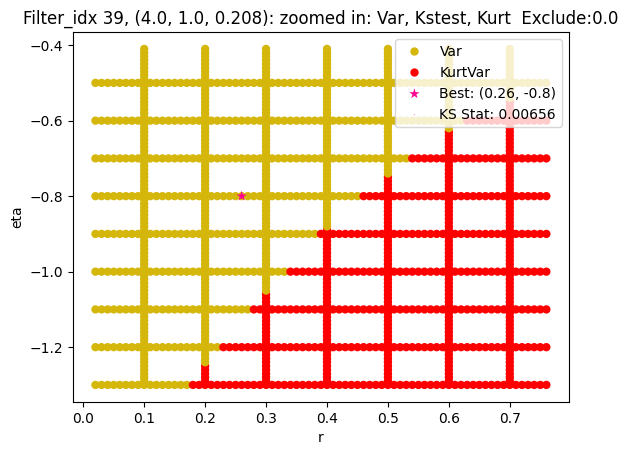

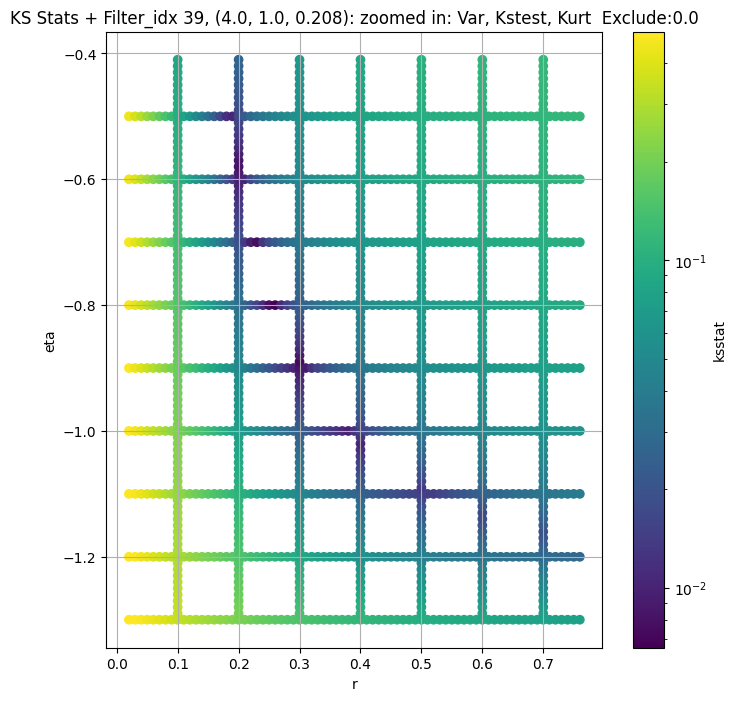

Filter_idx 40, (4.0, 1.0, 0.306):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 40, 0.0 + 100 = 100, ksstat: 0.0058163708256031565, var: 0.6946561932563782


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 40, 0.0 + 75 = 75, ksstat: 0.005439120278783682, var: 0.718884289264679


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 40, 0.0 + 50 = 50, ksstat: 0.004631123469921339, var: 0.7489539384841919


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 40, 0.0 + 25 = 25, ksstat: 0.003429142530949947, var: 0.7902976274490356


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 40, 0.0 + 0 = 0, ksstat: 0.003945258537061014, var: 0.9422348141670227
Number of samples: 100000, Without approximation : 160000000.0


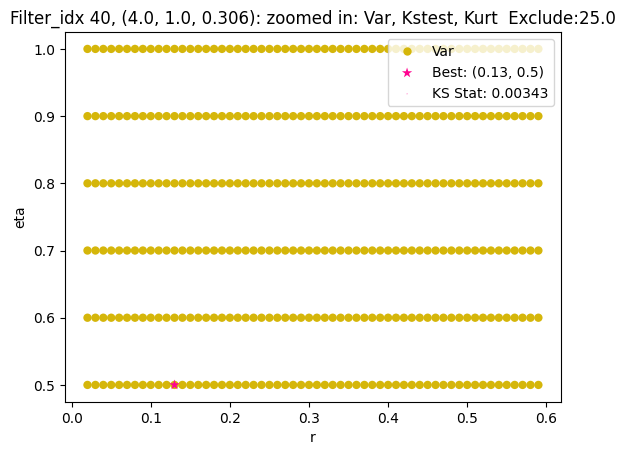

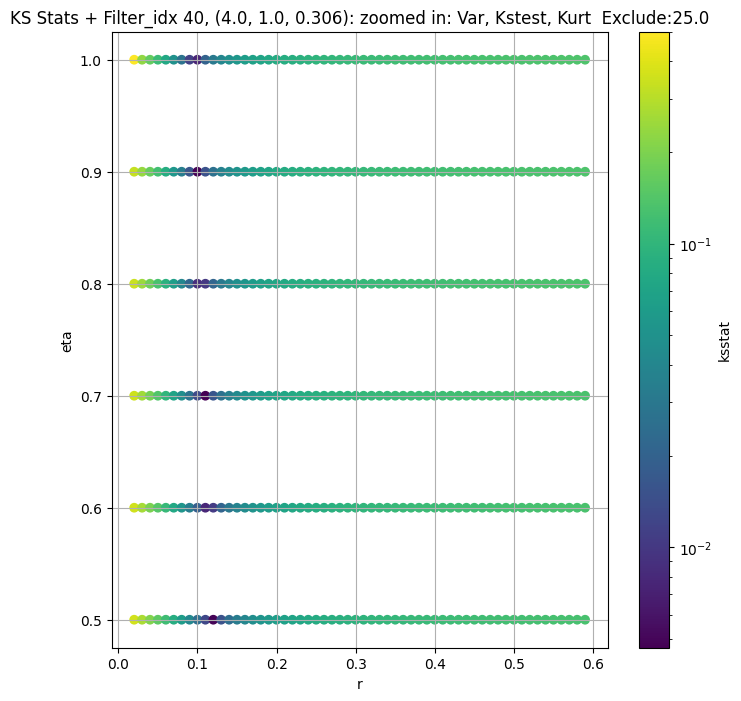

Filter_idx 41, (4.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 50.0 + 100 = 150, ksstat: 0.004836435097550051, var: 0.18602639436721802


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 50.0 + 75 = 125, ksstat: 0.004270204096696893, var: 0.19055141508579254


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 50.0 + 50 = 100, ksstat: 0.0036266002231461064, var: 0.19574657082557678


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 50.0 + 25 = 75, ksstat: 0.0030148182256298783, var: 0.20190398395061493


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 50.0 + 0 = 50, ksstat: 0.00201636395579341, var: 0.2096206396818161


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 50.0 + -25 = 25, ksstat: 0.0023363521782292507, var: 0.22047476470470428


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 41, 50.0 + -50 = 0, ksstat: 0.007177963893016545, var: 0.2931467890739441
Number of samples: 100000, Without approximation : 160000000.0


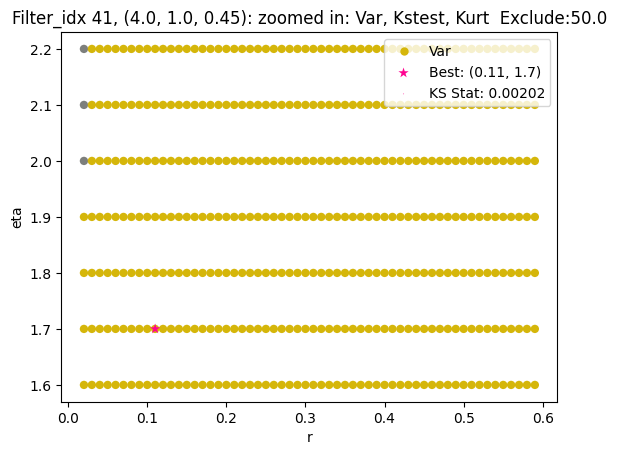

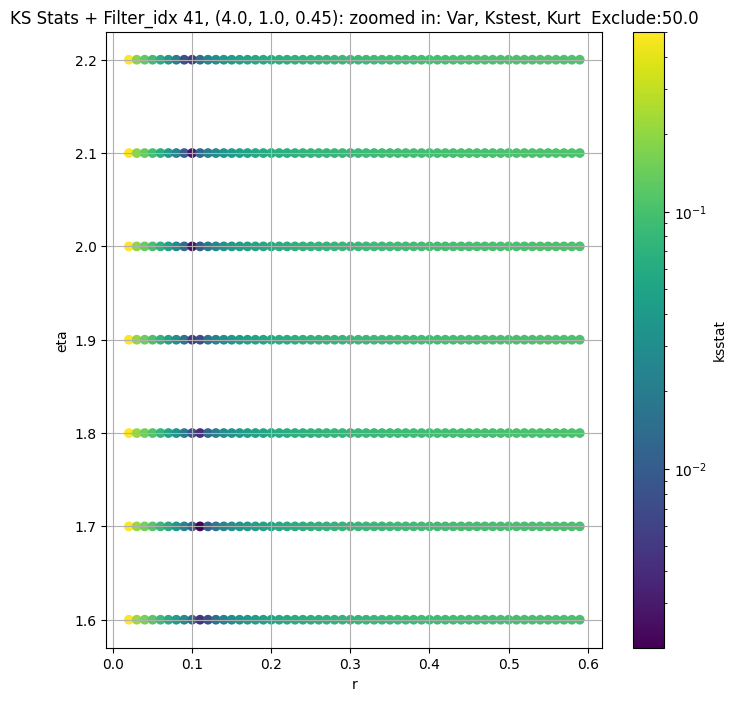

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff,n_pval_0.05
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",96.525920,70.528580,161.917770,19.178097,3.513101,155.585340,160000000.0,"(2.0, 0.5, 0.044)",0.010890,...,4.500731e+02,0.0,96.525920,0.000107,0.010890,3.30,-1.20,4.500731e+02,0.0,15637
1,"(2.0, 0.5, 0.065)",39.640656,29.082182,68.552986,24.873302,4.030701,218.632260,160000000.0,"(2.0, 0.5, 0.065)",0.009132,...,1.617406e+02,50.0,39.640656,0.000107,0.008482,2.00,-1.21,1.832617e+02,0.0,24718
2,"(2.0, 0.5, 0.096)",17.815247,12.593767,35.419140,39.990158,4.784158,295.938780,160000000.0,"(2.0, 0.5, 0.096)",0.008870,...,6.333919e+01,200.0,13.963770,0.000107,0.008870,9.90,-1.20,6.333919e+01,200.0,24718
3,"(2.0, 0.5, 0.141)",7.128089,4.933293,16.395422,52.462814,5.251441,315.332460,160000000.0,"(2.0, 0.5, 0.141)",0.007169,...,8.106799e+00,0.0,6.106246,0.000107,0.006634,0.66,-1.10,8.519917e+00,75.0,43944
4,"(2.0, 0.5, 0.208)",2.827215,1.798519,8.435795,99.624886,7.044568,497.418400,160000000.0,"(2.0, 0.5, 0.208)",0.008669,...,1.030344e+00,200.0,2.253248,0.000107,0.006941,0.40,-0.92,3.540356e-01,100.0,39062
5,"(2.0, 0.5, 0.306)",0.849095,0.525596,3.329293,202.204280,5.845236,593.344670,160000000.0,"(2.0, 0.5, 0.306)",0.004564,...,1.274587e-15,0.0,0.849095,0.000107,0.004564,0.10,1.10,1.274587e-15,0.0,87889
6,"(2.0, 0.5, 0.45)",0.509841,0.329509,1.785459,138.650010,5.808846,532.173160,160000000.0,"(2.0, 0.5, 0.45)",0.002769,...,2.209982e-16,0.0,0.509841,0.000107,0.002456,0.11,1.20,3.058806e-14,0.0,312500
7,"(2.0, 1.0, 0.044)",122.047100,91.589440,198.601530,18.166317,3.700830,162.124650,160000000.0,"(2.0, 1.0, 0.044)",0.013232,...,5.426253e+02,0.0,122.047100,0.000107,0.013232,20.00,-1.20,5.426253e+02,0.0,10984
8,"(2.0, 1.0, 0.065)",50.507060,36.873737,92.119070,23.864079,3.781666,200.233380,160000000.0,"(2.0, 1.0, 0.065)",0.008396,...,2.080705e+02,50.0,45.871265,0.000107,0.008396,9.90,-1.20,2.080705e+02,50.0,26392


In [19]:
master_df_optimized_path = Path(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))

NUM_ITERS = dict(zip(GROUPS, [1]*len(GROUPS))) # By default, does one iteration per group
NUM_SAMPLES_OPTIMIZE = 2000
EXCLUDE_CUTOFFS_OPTIMIZE = np.arange(100, -101, -25)

if RERUN or not master_df_optimized_path.exists():

    if SKIP_OPTIMIZE_STEP:

        master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
        master_df[f'best_r'] = master_df['initial_r']
        master_df[f'best_eta'] = master_df['initial_eta']
        master_df[f'best_scale'] = master_df['initial_scale']
        master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

    else:
        for group in GROUPS: # TODO For quick testing purposes
            print(f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}:")
            master_df.loc[group, 'kstest_stat_best'] = master_df.loc[group, 'kstest_stat_initial']
            master_df.loc[group, 'best_r'] = master_df.loc[group, 'initial_r']
            master_df.loc[group, 'best_eta'] = master_df.loc[group, 'initial_eta']
            master_df.loc[group, 'best_scale'] = master_df.loc[group, 'initial_scale']

            sample = group_data_map[group]
            if len(sample) == 0:
                continue
            initial_r, initial_eta = master_df.loc[group, 'initial_r'], master_df.loc[group, f'initial_eta']
            eps = 0.5
            group_cdfs_df = fine_cdfs_df[(np.abs(master_df.loc[group, 'initial_r'] - fine_cdfs_df['r']) < eps) & 
                                        (np.abs(master_df.loc[group, 'initial_eta'] - fine_cdfs_df['eta']) < eps)].reset_index(drop=True)
            group_cdfs = {x[0]:x[1] for x in group_cdfs_df['(r,eta),cdf']}

            for adjust_exclude_cutoff in EXCLUDE_CUTOFFS_OPTIMIZE: # -50, -25, 0, 25, 50
                
                exclude_cutoff = int(max(0, adjust_exclude_cutoff + master_df.loc[group, 'initial_exclude_cutoff']))
                
                if exclude_cutoff == 0:
                    augmented_var = np.var(group_data_map[group])
                else:
                    augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])                       

                group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
                ksstats, initial_param, min_stat = gridsearch(sample, group_cdfs, debug=True, scales=group_cdfs_df['scale'])
                
                cutoff_label = generate_cutoff_label(adjust_exclude_cutoff)

                augmented_var_df.loc[group, f"kstest_stat_{cutoff_label}"] = min_stat
                group_cdfs_df[f'ksstat_exclude_{cutoff_label}'] = ksstats
                
                print(f"{GROUP} {group}, {master_df.loc[group, 'initial_exclude_cutoff']} + {adjust_exclude_cutoff} = {exclude_cutoff}, ksstat: {min_stat}, var: {augmented_var}")
                best_adjust = 0

                if min_stat < master_df.loc[group, 'kstest_stat_best']:

                    inital_min_stat = min_stat
                    inital_best_param = initial_param
                    master_df.loc[group, 'kstest_stat_best'] = min_stat
                    initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                    master_df.loc[group, 'best_r'], master_df.loc[group, 'best_eta'] = initial_param
                    master_df.loc[group, 'best_scale'] = initial_scale
                    master_df.loc[group, 'best_exclude_cutoff'] = exclude_cutoff
                    master_df.loc[group, 'best_augmented_var'] = augmented_var
                    augmented_var_df.loc[group, 'best_augmented_var'] = augmented_var
                    best_adjust = adjust_exclude_cutoff

                if exclude_cutoff == 0:
                    break

            cutoff_label = generate_cutoff_label(best_adjust)
            ksstats = group_cdfs_df[f"ksstat_exclude_{cutoff_label}"]
            
            print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
            
            cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
            master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

            best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

            group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
            group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

            group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

            group_dict = rEtaKsstats_dict[group]
            group_dict.update({'r_optimize' : group_cdfs_df['r'], 'eta_optimize' : group_cdfs_df['eta'], f'ksstat_exclude_{cutoff_label}' : ksstats})
            rEtaKsstats_dict[group] = group_dict

            cols = ['pass_var', 'pass_kstest', 'pass_kurt']
            fig = combo_test_plot(group_cdfs_df, cols, 
                                plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: zoomed in: {', '.join([col[5:].capitalize() for col in cols])}  Exclude:{master_df.loc[group, 'best_exclude_cutoff']}",
                                best_param=(master_df.loc[group, 'best_r'], master_df.loc[group, f'best_eta']),
                                best_ksstat=master_df.loc[group, 'kstest_stat_best'])
            fig.figure.savefig(os.path.join(CWD, "plots", f"optimized_full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)
            
    master_df['n_pval_0.05'] = master_df.apply(lambda row : find_n_fixed_pval_stat(row.loc['kstest_stat_best'], row.loc['total_samples']), axis = 1)    
    master_df[['total_samples', 'initial_r', 'initial_eta', 'kstest_stat_initial', 'initial_exclude_cutoff', 'best_r', 'best_eta', 'best_scale', 'kstest_stat_best', 'best_exclude_cutoff', 'n_pval_0.05']].to_csv(os.path.join(CWD, "CSVs", 'optimized_params.csv'))
    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))
    augmented_var_df.to_csv(augmented_var_df_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)

rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df = pd.read_csv(master_df_optimized_path, index_col = GROUP)
augmented_var_df = pd.read_csv(augmented_var_df_path, index_col = GROUP)
master_df

## Comparing Empirical and Computed CDF/PDF

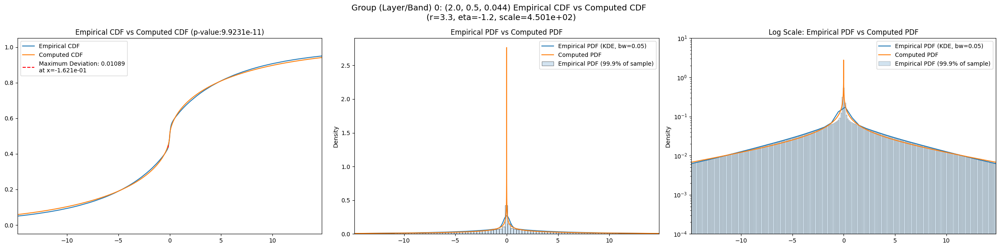

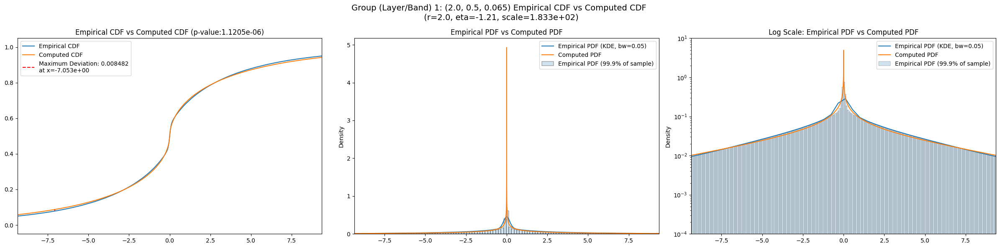

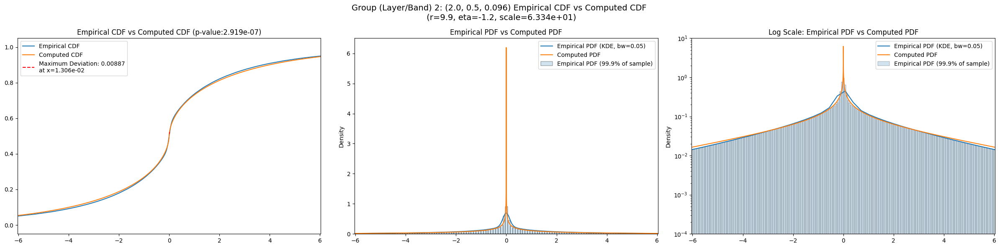

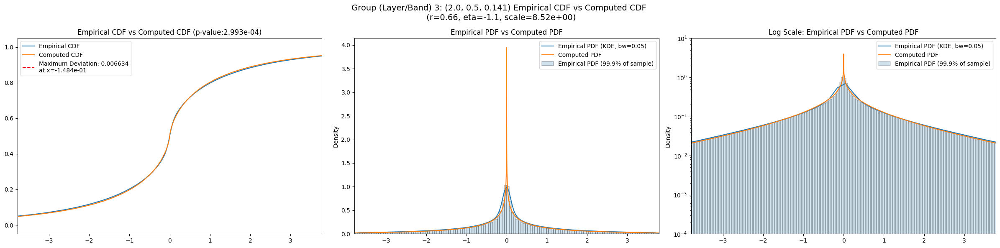

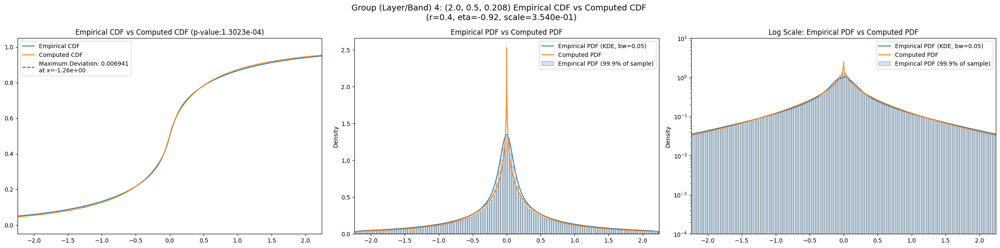

...

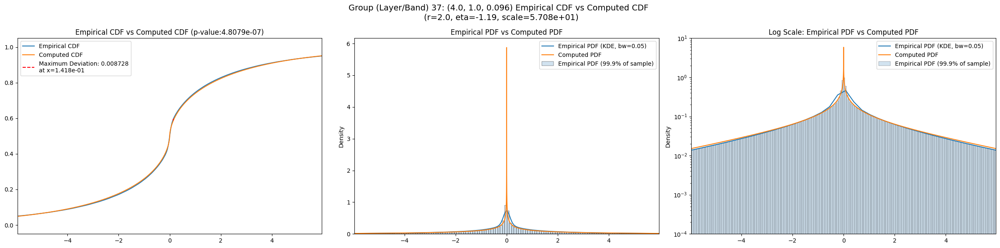

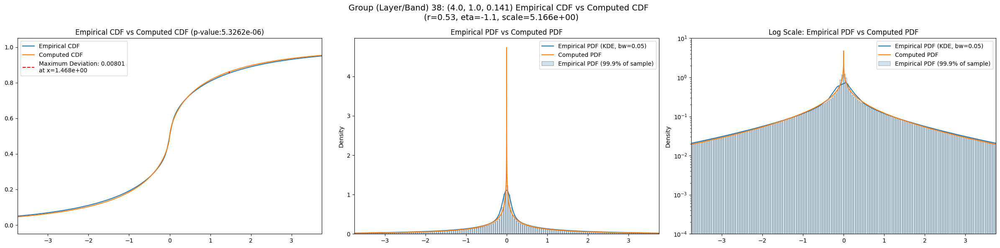

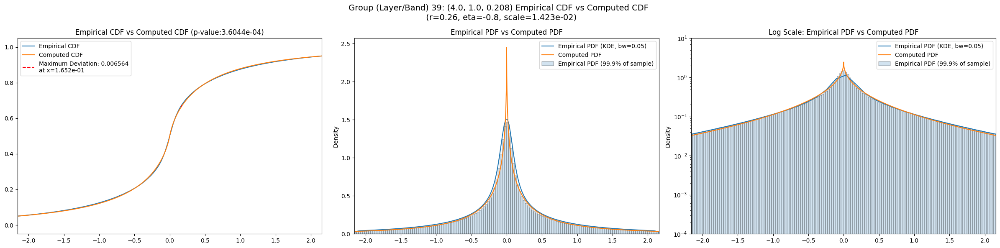

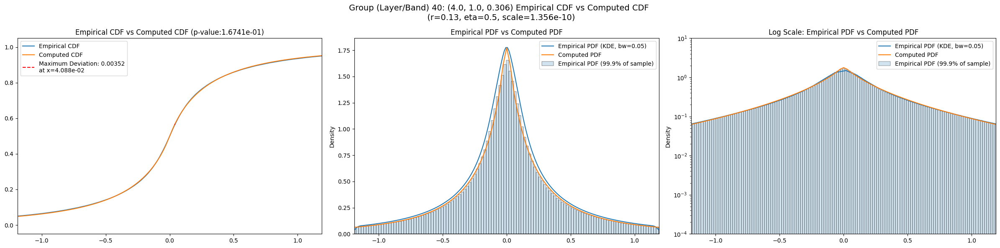

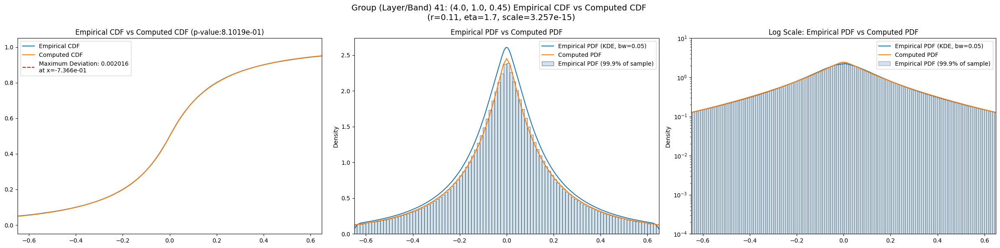

In [20]:
for group in GROUPS:
    group_info = master_df.loc[group]
    best_r = group_info['best_r']
    best_eta = group_info['best_eta']
    best_scale = group_info['best_scale']
    fig = visualize_cdf_pdf(sample = group_data_map[group], 
                    params = (best_r, best_eta, best_scale), 
                    log_scale = True,
                    group = f"{group}: {filter_group_map[group]}")
    fig.savefig(os.path.join(CWD, "plots", f'compare_cdf_pdf_layer_{group}.jpg'), bbox_inches = 'tight', dpi = 100)

## Comparing with Gaussian and Laplace Priors

In [21]:
def generate_func(sample, distro, *args, n_samples=200):
    if distro == 'gaussian' or distro == 'normal':
        def var_func(var):
            cdf = scipy.stats.norm(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'laplace':
        def var_func(var):
            cdf = scipy.stats.laplace(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 't':
        def var_func(var):
            cdf = scipy.stats.t(df=2, scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'prior_r':
        eta = args[0]
        def r_func(r):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return r_func
    elif distro == 'prior_eta':
        r = args[0]
        def eta_func(eta):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return eta_func
    elif distro == 'prior':
        def r_eta_func(params):
            r = params[0]
            eta = params[1]
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample, cdf)
        return r_eta_func
    elif distro == 'prior_with_scale':
        def r_eta_scale_func(params):
            r = params[0]
            eta = params[1]
            scale = params[2]
            print(r, eta, scale)
            cdf = compute_prior_cdf(r = r, eta = eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample/ np.sqrt(scale), cdf)
        return r_eta_scale_func

    print("Please enter a valid argument for `distro`: 'gaussian', 'laplace', 'prior_r', 'prior_eta', 'prior','prior_with_scale', 't'")

In [22]:
master_df_path = Path(os.path.join(CWD, "CSVs", 'master_df.csv'))

if RERUN or not master_df_path.exists():
    upper_bound = int(1e6)
    for group in GROUPS:
        if len(group_data_map[group]) == 0:
            continue
        norm_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'gaussian'), method = 'bounded', bounds = (0, upper_bound))
        laplace_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'laplace'), method = 'bounded', bounds = (0, upper_bound))
        t_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 't'), method = 'bounded', bounds = (0, upper_bound))
        
        master_df.loc[group, 'param_gaussian'] = round_to_sigfigs(norm_result['x'], 6)
        master_df.loc[group, 'kstest_stat_gaussian'] = round_to_sigfigs(norm_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_gaussian'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_gaussian']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6) 

        master_df.loc[group, 'param_t'] = round_to_sigfigs(t_result['x'], 6)
        master_df.loc[group, 'kstest_stat_t'] = round_to_sigfigs(t_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_t'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_t']), 6) 

        master_df.loc[group, 'kstest_pval_gengamma'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_best']))

    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df.csv'))
    
master_df = pd.read_csv(os.path.join(CWD, "CSVs", 'master_df.csv'), index_col = GROUP)
master_df

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,param_gaussian,kstest_stat_gaussian,kstest_pval_gaussian,param_laplace,kstest_stat_laplace,kstest_pval_laplace,param_t,kstest_stat_t,kstest_pval_t,kstest_pval_gengamma
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",96.525920,70.528580,161.917770,19.178097,3.513101,155.585340,160000000.0,"(2.0, 0.5, 0.044)",0.010890,...,5.313160,0.063825,0.0,4.200450,0.048852,0.0,3.448180,0.052417,0.0,0.000000e+00
1,"(2.0, 0.5, 0.065)",39.640656,29.082182,68.552986,24.873302,4.030701,218.632260,160000000.0,"(2.0, 0.5, 0.065)",0.009132,...,3.175720,0.068467,0.0,2.537300,0.051541,0.0,2.058760,0.055219,0.0,0.000000e+00
2,"(2.0, 0.5, 0.096)",17.815247,12.593767,35.419140,39.990158,4.784158,295.938780,160000000.0,"(2.0, 0.5, 0.096)",0.008870,...,1.962240,0.071624,0.0,1.603330,0.051531,0.0,1.284990,0.055322,0.0,0.000000e+00
3,"(2.0, 0.5, 0.141)",7.128089,4.933293,16.395422,52.462814,5.251441,315.332460,160000000.0,"(2.0, 0.5, 0.141)",0.007169,...,1.210390,0.072010,0.0,1.018910,0.048276,0.0,0.808931,0.051650,0.0,0.000000e+00
4,"(2.0, 0.5, 0.208)",2.827215,1.798519,8.435795,99.624886,7.044568,497.418400,160000000.0,"(2.0, 0.5, 0.208)",0.008669,...,0.717400,0.069370,0.0,0.621560,0.042769,0.0,0.491779,0.044427,0.0,0.000000e+00
5,"(2.0, 0.5, 0.306)",0.849095,0.525596,3.329293,202.204280,5.845236,593.344670,160000000.0,"(2.0, 0.5, 0.306)",0.004564,...,0.436400,0.057623,0.0,0.383165,0.030212,0.0,0.305047,0.030153,0.0,0.000000e+00
6,"(2.0, 0.5, 0.45)",0.509841,0.329509,1.785459,138.650010,5.808846,532.173160,160000000.0,"(2.0, 0.5, 0.45)",0.002769,...,0.370093,0.051611,0.0,0.325299,0.024155,0.0,0.259842,0.023977,0.0,0.000000e+00
7,"(2.0, 1.0, 0.044)",122.047100,91.589440,198.601530,18.166317,3.700830,162.124650,160000000.0,"(2.0, 1.0, 0.044)",0.013232,...,6.215910,0.059141,0.0,4.967850,0.042487,0.0,4.076570,0.046159,0.0,0.000000e+00
8,"(2.0, 1.0, 0.065)",50.507060,36.873737,92.119070,23.864079,3.781666,200.233380,160000000.0,"(2.0, 1.0, 0.065)",0.008396,...,3.773000,0.063677,0.0,3.019310,0.046409,0.0,2.453010,0.050010,0.0,0.000000e+00


## Results

In [23]:
import pandas as pd
import os
master_df = pd.read_csv(os.path.join(os.getcwd(), "CSVs", 'master_df.csv'), index_col = 0)

In [24]:
master_df.filter(regex="kstest_stat.*")

,kstest_stat_initial,kstest_stat_cutoff_0.05,kstest_stat_best,kstest_stat_gaussian,kstest_stat_laplace,kstest_stat_t
filter_idx,,,,,,
0,0.010890,0.000107,0.010890,0.063825,0.048852,0.052417
1,0.009132,0.000107,0.008482,0.068467,0.051541,0.055219
2,0.008870,0.000107,0.008870,0.071624,0.051531,0.055322
3,0.007169,0.000107,0.006634,0.072010,0.048276,0.051650
4,0.008669,0.000107,0.006941,0.069370,0.042769,0.044427
5,0.004564,0.000107,0.004564,0.057623,0.030212,0.030153
6,0.002769,0.000107,0.002456,0.051611,0.024155,0.023977
7,0.013232,0.000107,0.013232,0.059141,0.042487,0.046159
8,0.008396,0.000107,0.008396,0.063677,0.046409,0.050010


In [25]:
master_df.filter(regex="best.*")

,best_augmented_var,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff
filter_idx,,,,,,
0,96.525920,0.010890,3.30,-1.20,4.500731e+02,0.0
1,39.640656,0.008482,2.00,-1.21,1.832617e+02,0.0
2,13.963770,0.008870,9.90,-1.20,6.333919e+01,200.0
3,6.106246,0.006634,0.66,-1.10,8.519917e+00,75.0
4,2.253248,0.006941,0.40,-0.92,3.540356e-01,100.0
5,0.849095,0.004564,0.10,1.10,1.274587e-15,0.0
6,0.509841,0.002456,0.11,1.20,3.058806e-14,0.0
7,122.047100,0.013232,20.00,-1.20,5.426253e+02,0.0
8,45.871265,0.008396,9.90,-1.20,2.080705e+02,50.0
